# Capstone Project_Anomaly and Fraud Detection
__________________________________________________________________________________________________________________

# Problem Statement
___________________________________________________________________________________________________________________________

1. Which factors or behavior of fraudulent customer.
2. To classify and predict new transaction automatically.
3. Which models are the best efficient to predict fraud.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.layers import Input, Dense, LeakyReLU
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MSE
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report,plot_confusion_matrix, average_precision_score
from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
import collections
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from scipy.stats import rankdata

from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

from sklearn.decomposition import PCA


%matplotlib inline
sns.set_style('white')
%config InlineBackend.figure_format = 'retina'

# Import Data

In [2]:
df_train_tran = pd.read_csv('ieee-fraud-detection/train_transaction.csv')
df_train_id = pd.read_csv('ieee-fraud-detection/train_identity.csv')

In [3]:
df_test_tran = pd.read_csv('ieee-fraud-detection/test_transaction.csv')
df_test_id = pd.read_csv('ieee-fraud-detection/test_identity.csv')

In [4]:
df_train_tran.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
df_train_tran.shape

(590540, 394)

In [6]:
df_train_id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [7]:
df_train_id.shape

(144233, 41)

In [8]:
train = pd.merge(df_train_tran, df_train_id, on='TransactionID', how='left')

In [9]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [10]:
train.shape

(590540, 434)

In [11]:
list(train.columns)

['TransactionID',
 'isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'M1',
 'M2',
 'M3',
 'M4',
 'M5',
 'M6',
 'M7',
 'M8',
 'M9',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V

# EDA

**Data Description**
- TransactionDT: timedelta from a given reference datetime (not an actual timestamp)
- TransactionAMT: transaction payment amount in USD
- ProductCD: product code, the product for each transaction
- card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
- addr: address
- dist: distance
- P_ and (R__) emaildomain: purchaser and recipient email domain
- C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
- D1-D15: timedelta, such as days between previous transaction, etc.
- M1-M9: match, such as names on card and address, etc.
- Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.

Due to this data has many features so, I will use some feature for exploring the data.

**Features >> TransactionAmt, ProductCD, card1-card6, P_emaildomain, DeviceType**

**Class >> isFraud**
__________________________________________________________________________________________

Imbalance data :
- Fraud = 3.5%
- Not Fraud = 96.5%

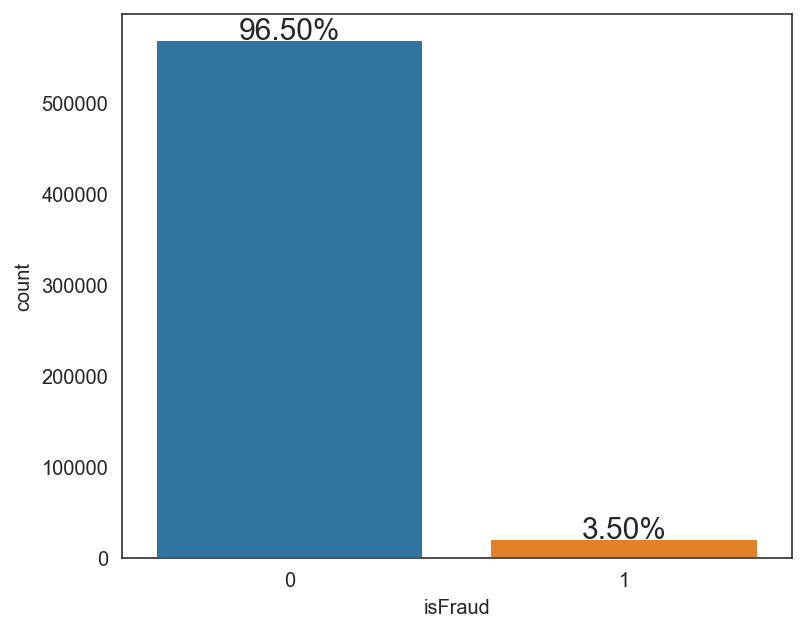

In [12]:
plt.figure(figsize=(6,5))
total = len(train)
total_amt = train.groupby(['isFraud'])['TransactionAmt'].sum().sum()
g = sns.countplot(x='isFraud', data=train)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15) 

## TransactionAmt

In [13]:
train['TransactionAmt'].quantile([.01, .025, .1, .25, .5, .75, .9, .975, .99])

0.010       9.2440
0.025      14.5010
0.100      25.9500
0.250      43.3210
0.500      68.7690
0.750     125.0000
0.900     275.2930
0.975     648.3345
0.990    1104.0000
Name: TransactionAmt, dtype: float64

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


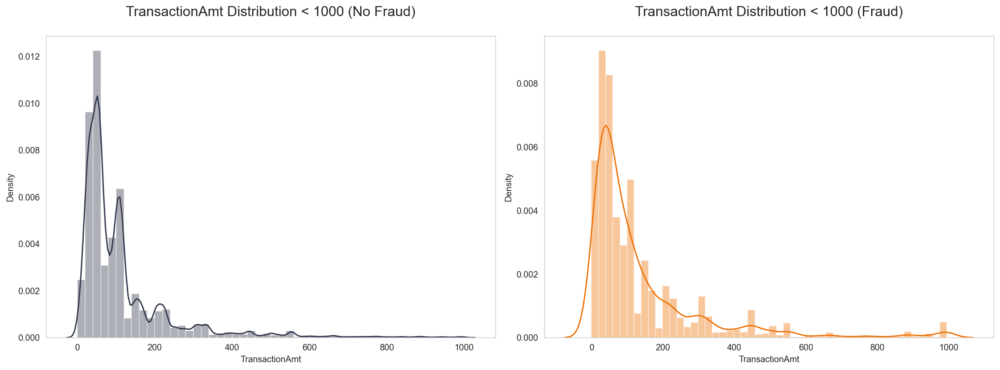

In [364]:
### Plot the distribution of TransactionAmt

plt.subplots(1,2,figsize=(16,6),sharey=True)

plt.subplot(1,2,1)
sns.distplot(train[['isFraud','TransactionAmt']]['TransactionAmt'].loc[(train['isFraud'] == 0) & (train['TransactionAmt'] < 1000)],color='#33374d')
plt.title('TransactionAmt Distribution < 1000 (No Fraud)\n',fontsize=16)
plt.grid()
plt.subplot(1,2,2)
sns.distplot(train[['isFraud','TransactionAmt']]['TransactionAmt'].loc[(train['isFraud'] == 1) & (train['TransactionAmt'] < 1000)],color='#ee7106')
plt.title('TransactionAmt Distribution < 1000 (Fraud)\n',fontsize=16)
plt.tight_layout()
plt.grid()


## ProductCD

In [15]:
prod = pd.crosstab(train['ProductCD'], train['isFraud'])
prod = prod.reset_index()
prod.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
prod

isFraud,ProductCD,NoFraud,Fraud
0,C,60511,8008
1,H,31450,1574
2,R,36273,1426
3,S,10942,686
4,W,430701,8969


In [16]:
### Normalize

prod = pd.crosstab(train['ProductCD'], train['isFraud'], normalize = 'index') * 100
prod = prod.reset_index()
prod.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
prod

isFraud,ProductCD,NoFraud,Fraud
0,C,88.312731,11.687269
1,H,95.233769,4.766231
2,R,96.217406,3.782594
3,S,94.100447,5.899553
4,W,97.960061,2.039939


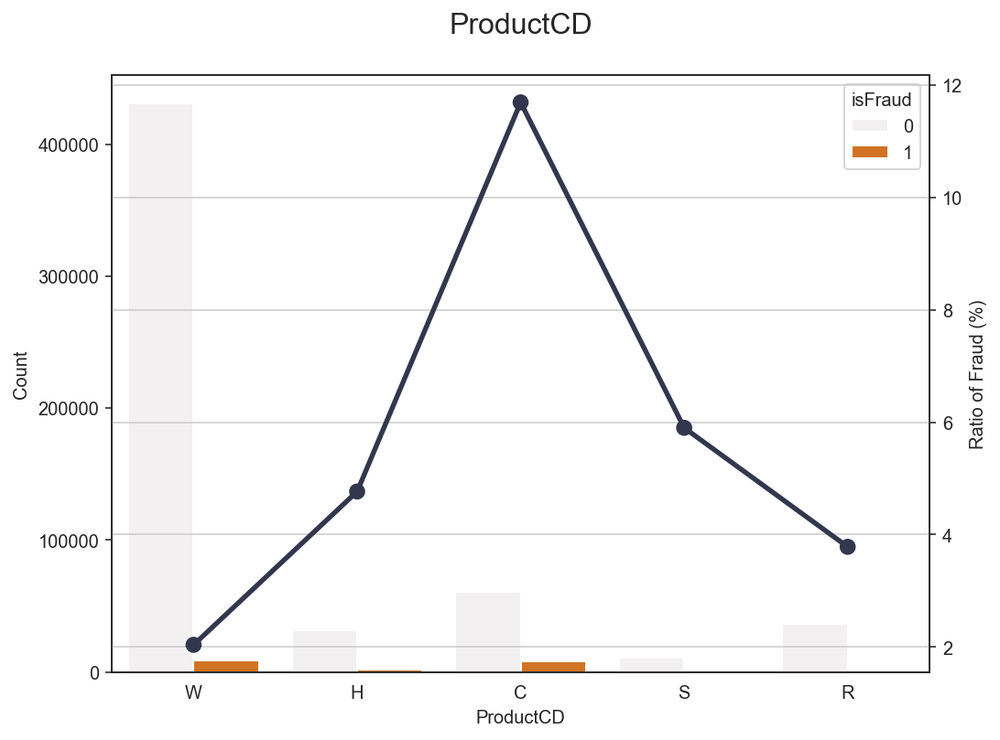

In [17]:
### Plot %fraud & total of transactions for each product

plt.figure(figsize=(8,6))
g1 = sns.countplot(x='ProductCD',data = train, hue='isFraud', color = '#ee7106')
plt.ylabel('Count')
g2 = g1.twinx()
g2 = sns.pointplot(x='ProductCD', y ='Fraud',data = prod, color = '#33374d', order=['W', 'H',"C", "S", "R"])
plt.title('ProductCD\n',fontsize=16)
plt.ylabel('Ratio of Fraud (%)')
plt.grid()

In [18]:
### Product C

prod2 = train[['ProductCD','TransactionAmt','isFraud']]
prod_c = prod2[prod2['ProductCD'] == 'C'].reset_index(drop=True).reset_index().drop(columns = ['ProductCD']).sort_values(by='isFraud')
prod_c

,index,TransactionAmt,isFraud
0,0,75.887,0
43936,43936,54.136,0
43937,43937,21.147,0
43938,43938,17.159,0
43939,43939,3.747,0
...,...,...,...
24717,24717,32.356,1
40116,40116,18.851,1
58097,58097,15.247,1
24655,24655,89.024,1


Text(0.5, 1.0, 'Fraud of Product C\n')

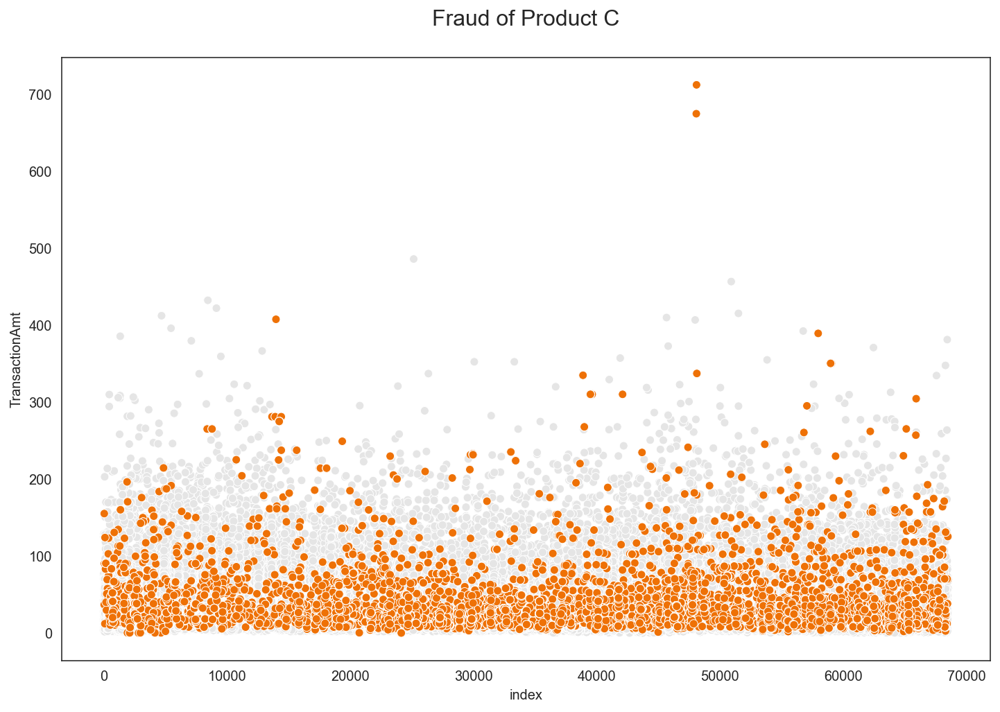

In [19]:
### The distribution of fraud and not fraud of product C

plt.figure(figsize = (12,8))
prod_c['color'] = prod_c['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
sns.scatterplot(x = 'index', y = 'TransactionAmt', data = prod_c , c=prod_c['color'])
plt.title('Fraud of Product C\n',fontsize=16)

In [20]:
### Product H

prod2 = train[['ProductCD','TransactionAmt','isFraud']]
prod_h = prod2[prod2['ProductCD'] == 'H'].reset_index(drop=True).reset_index().drop(columns = ['ProductCD']).sort_values(by='isFraud')
prod_h

,index,TransactionAmt,isFraud
0,0,50.0,0
21284,21284,25.0,0
21283,21283,25.0,0
21282,21282,100.0,0
21280,21280,40.0,0
...,...,...,...
30669,30669,100.0,1
30670,30670,100.0,1
30671,30671,100.0,1
23083,23083,200.0,1


Text(0.5, 1.0, 'Fraud of Product H\n')

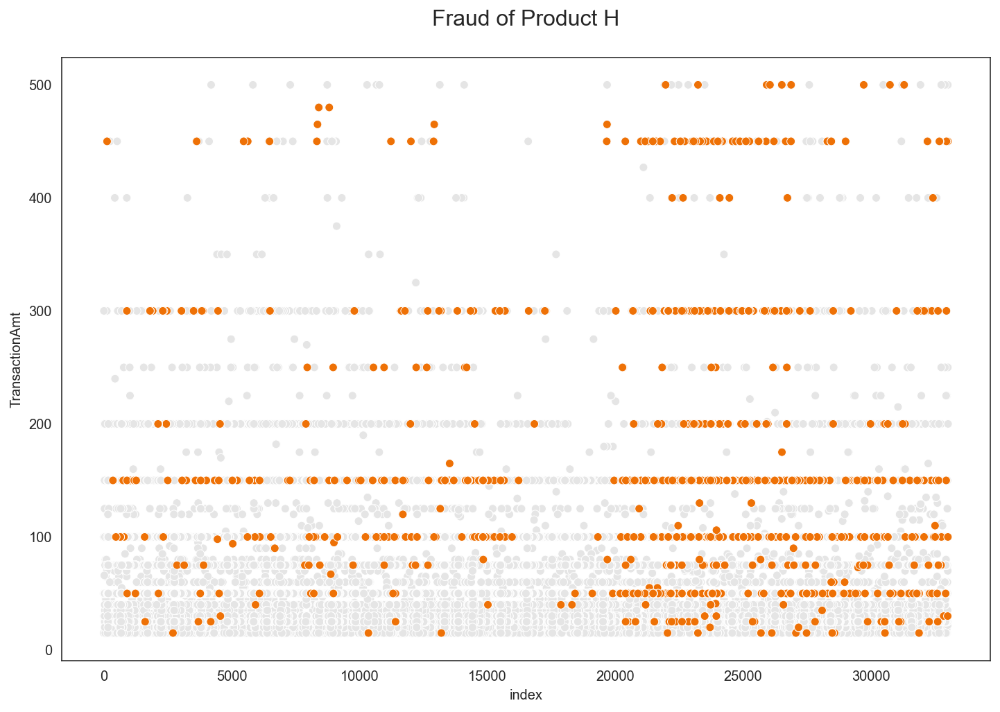

In [21]:
### The distribution of fraud and not fraud of product H

plt.figure(figsize = (12,8))
prod_h['color'] = prod_h['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
sns.scatterplot(x = 'index', y = 'TransactionAmt', data = prod_h , c=prod_h['color'])
plt.title('Fraud of Product H\n',fontsize=16)

In [22]:
### Product R

prod2 = train[['ProductCD','TransactionAmt','isFraud']]
prod_r = prod2[prod2['ProductCD'] == 'R'].reset_index(drop=True).reset_index().drop(columns = ['ProductCD']).sort_values(by='isFraud')
prod_r

,index,TransactionAmt,isFraud
0,0,75.0,0
24818,24818,300.0,0
24817,24817,50.0,0
24816,24816,250.0,0
24815,24815,200.0,0
...,...,...,...
26747,26747,225.0,1
8660,8660,200.0,1
19140,19140,250.0,1
20505,20505,300.0,1


Text(0.5, 1.0, 'Fraud of Product R\n')

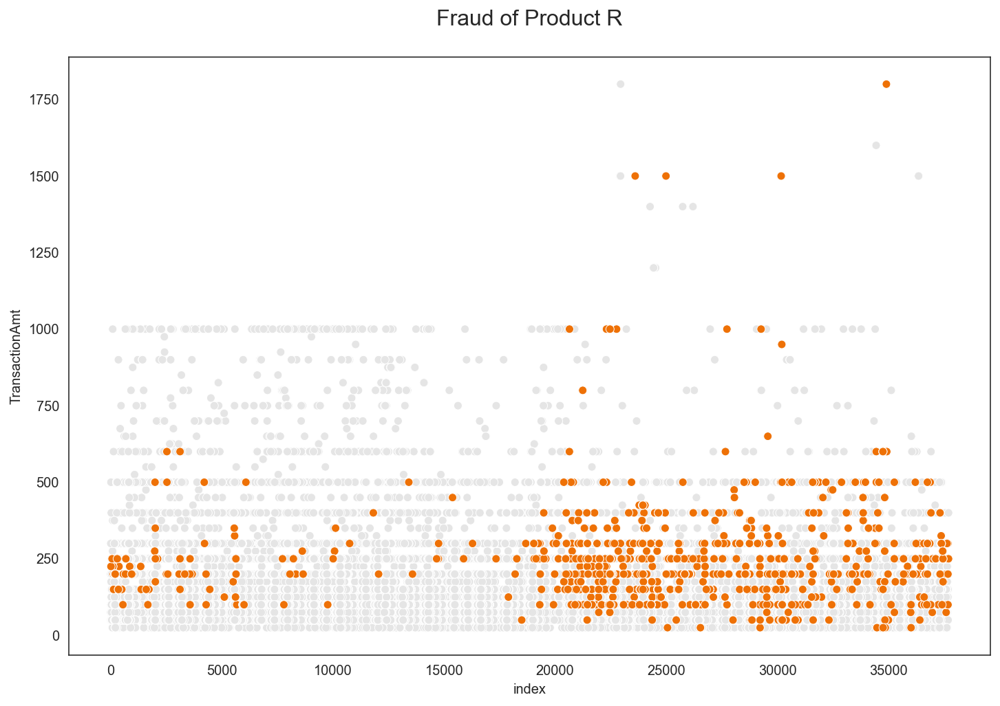

In [23]:
### The distribution of fraud and not fraud of product R

plt.figure(figsize = (12,8))
prod_r['color'] = prod_r['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
sns.scatterplot(x = 'index', y = 'TransactionAmt', data = prod_r , c=prod_r['color'])
plt.title('Fraud of Product R\n',fontsize=16)

In [24]:
### Product S

prod2 = train[['ProductCD','TransactionAmt','isFraud']]
prod_s = prod2[prod2['ProductCD'] == 'S'].reset_index(drop=True).reset_index().drop(columns = ['ProductCD']).sort_values(by='isFraud')
prod_s

,index,TransactionAmt,isFraud
0,0,25.0,0
7650,7650,100.0,0
7651,7651,25.0,0
7652,7652,75.0,0
7653,7653,10.0,0
...,...,...,...
4497,4497,75.0,1
6848,6848,35.0,1
6835,6835,90.0,1
6917,6917,65.0,1


Text(0.5, 1.0, 'Fraud of Product S\n')

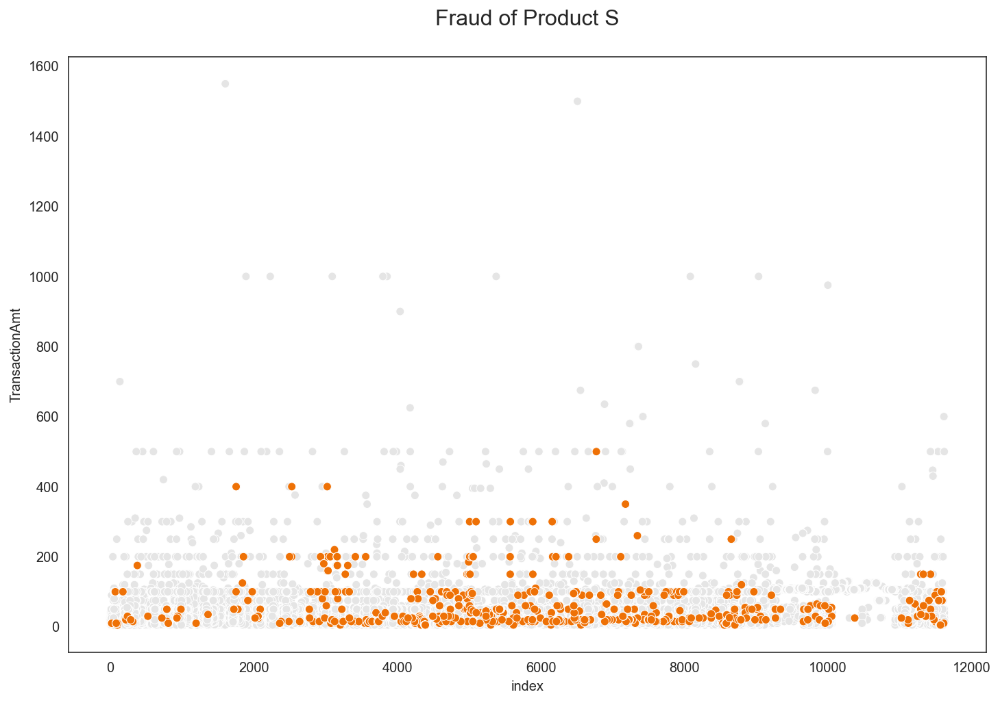

In [25]:
### The distribution of fraud and not fraud of product S

plt.figure(figsize = (12,8))
prod_s['color'] = prod_s['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
sns.scatterplot(x = 'index', y = 'TransactionAmt', data = prod_s , c=prod_s['color'])
plt.title('Fraud of Product S\n',fontsize=16)

In [26]:
### Product W

prod2 = train[['ProductCD','TransactionAmt','isFraud']]
prod_w = prod2[prod2['ProductCD'] == 'W'].reset_index(drop=True).reset_index().drop(columns = ['ProductCD']).sort_values(by='isFraud')
prod_w = prod_w[prod_w['TransactionAmt'] < 10000]
prod_w

,index,TransactionAmt,isFraud
0,0,68.50,0
291694,291694,179.95,0
291693,291693,59.00,0
291692,291692,107.95,0
291691,291691,28.95,0
...,...,...,...
132278,132278,77.00,1
119659,119659,59.00,1
49409,49409,49.00,1
49399,49399,24.00,1


Text(0.5, 1.0, 'Fraud of Product W\n')

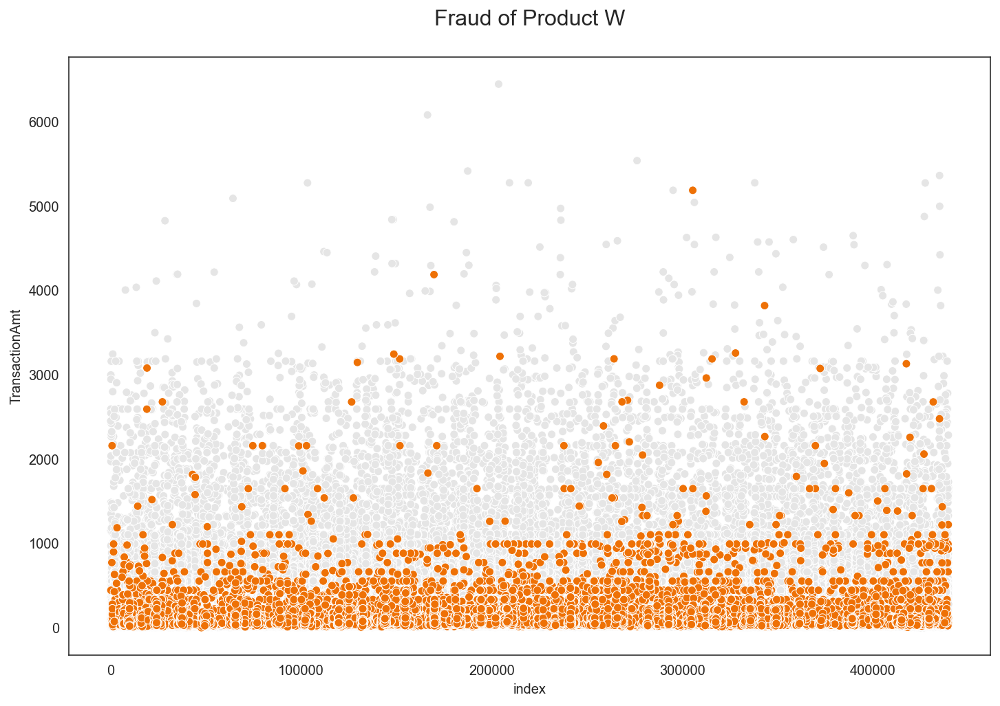

In [27]:
### The distribution of fraud and not fraud of product W

plt.figure(figsize = (12,8))
prod_w['color'] = prod_w['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
sns.scatterplot(x = 'index', y = 'TransactionAmt', data = prod_w , c=prod_w['color'])
plt.title('Fraud of Product W\n',fontsize=16)

## Card 1-6

- Card 1, 2, 3 and 5 are numerical data
- Card 4 and 6 are categorical data
- Card 4 >> Discover, Mastercard, Visa and American Express
- Card 6 >> Credit, Debit

In [28]:
cards = train[['card1','card2','card3','card4','card5','card6','TransactionAmt','isFraud']]
cards

,card1,card2,card3,card4,card5,card6,TransactionAmt,isFraud
0,13926,NaN,150.0,discover,142.0,credit,68.50,0
1,2755,404.0,150.0,mastercard,102.0,credit,29.00,0
2,4663,490.0,150.0,visa,166.0,debit,59.00,0
3,18132,567.0,150.0,mastercard,117.0,debit,50.00,0
4,4497,514.0,150.0,mastercard,102.0,credit,50.00,0
...,...,...,...,...,...,...,...,...
590535,6550,NaN,150.0,visa,226.0,debit,49.00,0
590536,10444,225.0,150.0,mastercard,224.0,debit,39.50,0
590537,12037,595.0,150.0,mastercard,224.0,debit,30.95,0
590538,7826,481.0,150.0,mastercard,224.0,debit,117.00,0


In [29]:
cards.dtypes

card1               int64
card2             float64
card3             float64
card4              object
card5             float64
card6              object
TransactionAmt    float64
isFraud             int64
dtype: object

### Card1

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='card1', ylabel='Density'>

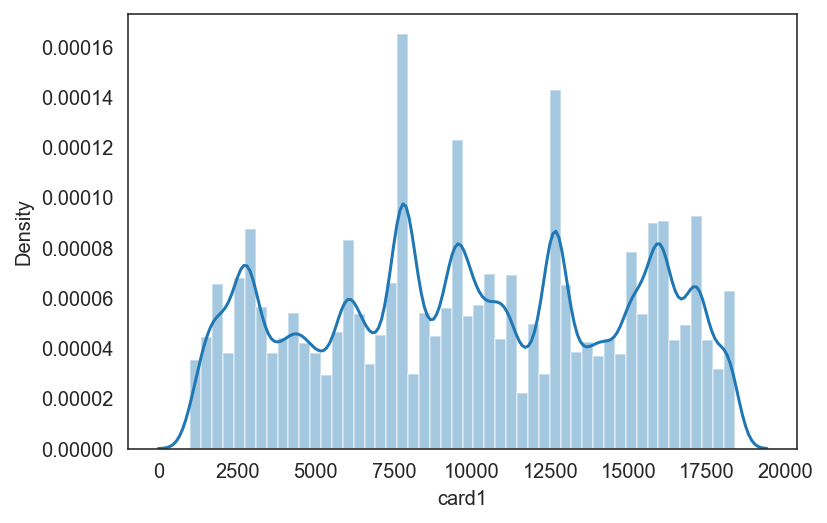

In [30]:
sns.distplot(cards['card1'])

In [31]:
card1 = cards[['card1','TransactionAmt','isFraud']]
card1 = card1.reset_index(drop=True).sort_values(by='isFraud')
card1['color'] = card1['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card1 = card1[card1['TransactionAmt'] < 10000]
card1

,card1,TransactionAmt,isFraud,color
0,13926,68.500,0,#e5e5e5
390062,11757,47.950,0,#e5e5e5
390060,2884,25.950,0,#e5e5e5
390059,6697,100.000,0,#e5e5e5
390058,7207,210.950,0,#e5e5e5
...,...,...,...,...
415021,9500,150.000,1,#ee7106
231999,14649,59.000,1,#ee7106
199476,9500,2680.000,1,#ee7106
313705,3821,994.000,1,#ee7106


Text(0.5, 1.0, 'Fraud of Card 1\n')

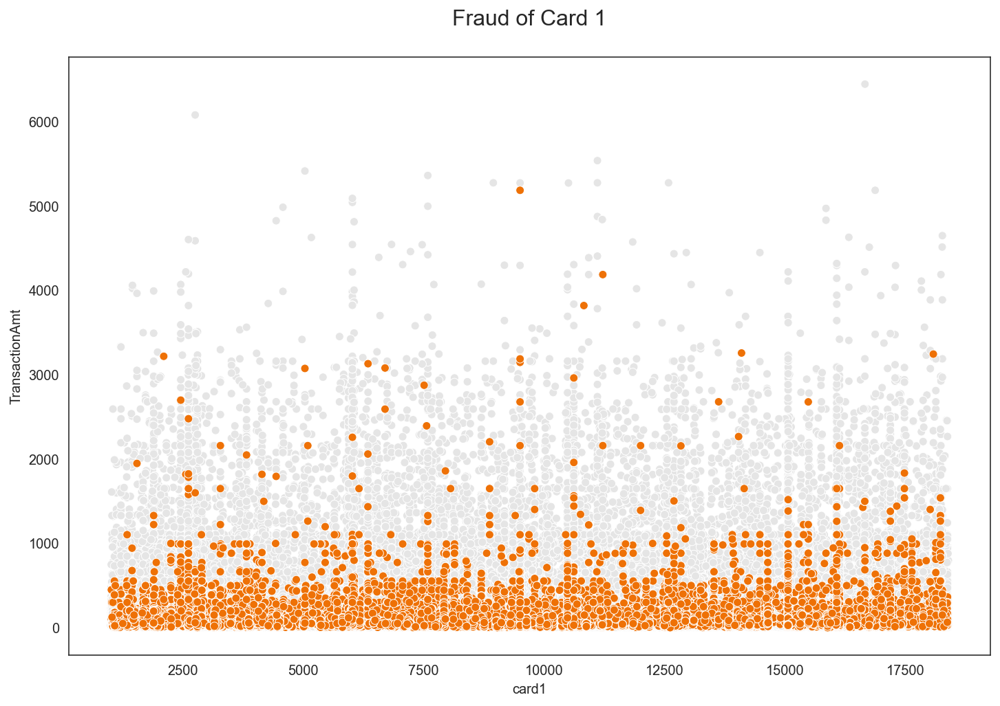

In [32]:
### The distribution of fraud and not fraud of Card 1

plt.figure(figsize = (12,8))
sns.scatterplot(x = 'card1', y = 'TransactionAmt', c = card1['color'], data = card1)
plt.title('Fraud of Card 1\n',fontsize=16)

### Card2

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='card2', ylabel='Density'>

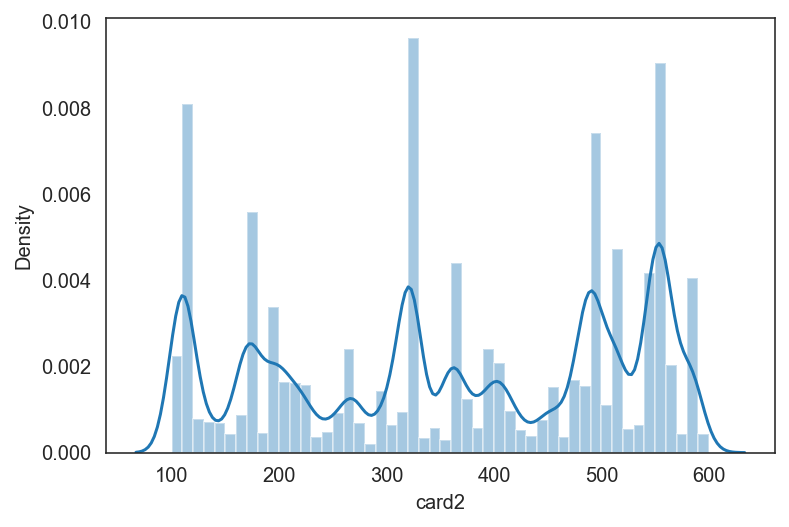

In [33]:
sns.distplot(cards['card2'])

In [34]:
card2 = cards[['card2','TransactionAmt','isFraud']]
card2 = card2.reset_index(drop=True).sort_values(by='isFraud')
card2['color'] = card2['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card2 = card2[card2['TransactionAmt'] < 10000]
card2 = card2.dropna()
card2

,card2,TransactionAmt,isFraud,color
390062,555.0,47.950,0,#e5e5e5
390060,490.0,25.950,0,#e5e5e5
390059,111.0,100.000,0,#e5e5e5
390058,111.0,210.950,0,#e5e5e5
390057,321.0,15.950,0,#e5e5e5
...,...,...,...,...
415021,321.0,150.000,1,#ee7106
231999,548.0,59.000,1,#ee7106
199476,321.0,2680.000,1,#ee7106
313705,111.0,994.000,1,#ee7106


In [35]:
card22 = pd.crosstab(cards['card2'], cards['isFraud'], normalize = 'index') *100
card22 = card22.reset_index()
card22 = card22.rename(columns={0:'NoFraud', 1:'Fraud'})
card22

isFraud,card2,NoFraud,Fraud
0,100.0,98.718626,1.281374
1,101.0,100.000000,0.000000
2,102.0,100.000000,0.000000
3,103.0,90.051903,9.948097
4,104.0,75.198939,24.801061
...,...,...,...
495,596.0,100.000000,0.000000
496,597.0,100.000000,0.000000
497,598.0,100.000000,0.000000
498,599.0,99.255583,0.744417


Text(0.5, 1.0, 'Fraud of Card 2\n')

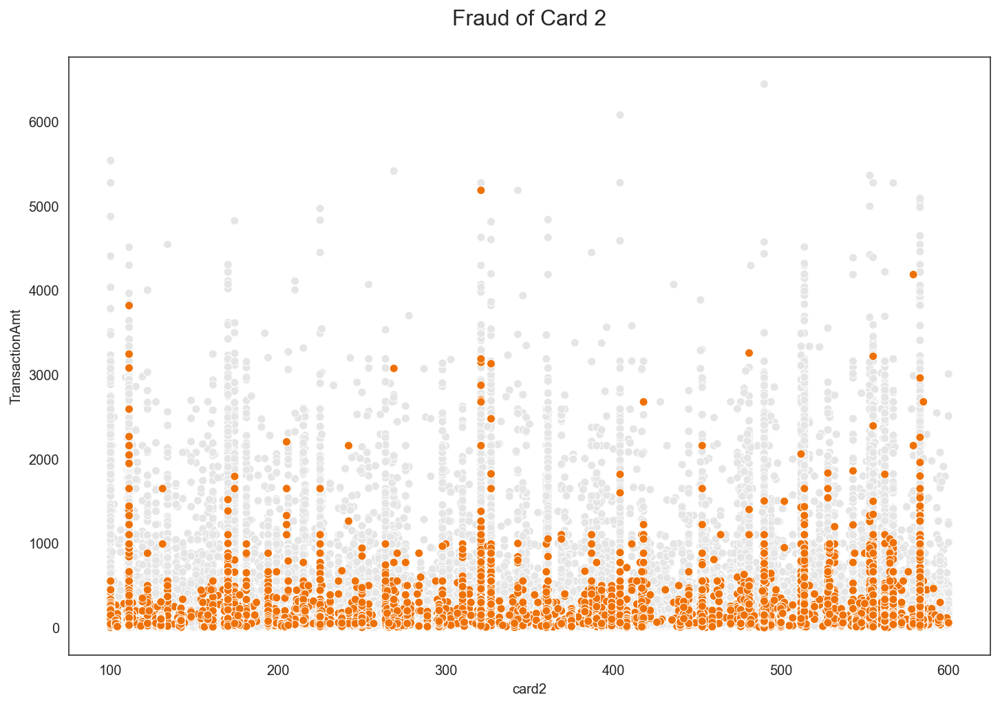

In [36]:
### The distribution of fraud and not fraud of Card 2

plt.figure(figsize = (12,8))
g2 = sns.scatterplot(x = 'card2', y = 'TransactionAmt', c = card2['color'], data = card2)
plt.title('Fraud of Card 2\n',fontsize=16)

In [37]:
### Due to this data (card2) likely high variance so, it doesn't suitable for plotting as the graph below

card2['card2'].value_counts(normalize=True)

321.0    0.084138
111.0    0.077701
555.0    0.072205
490.0    0.065586
583.0    0.037488
           ...   
388.0    0.000067
153.0    0.000065
557.0    0.000064
473.0    0.000031
582.0    0.000024
Name: card2, Length: 500, dtype: float64

Text(0, 0.5, '%Fraud')

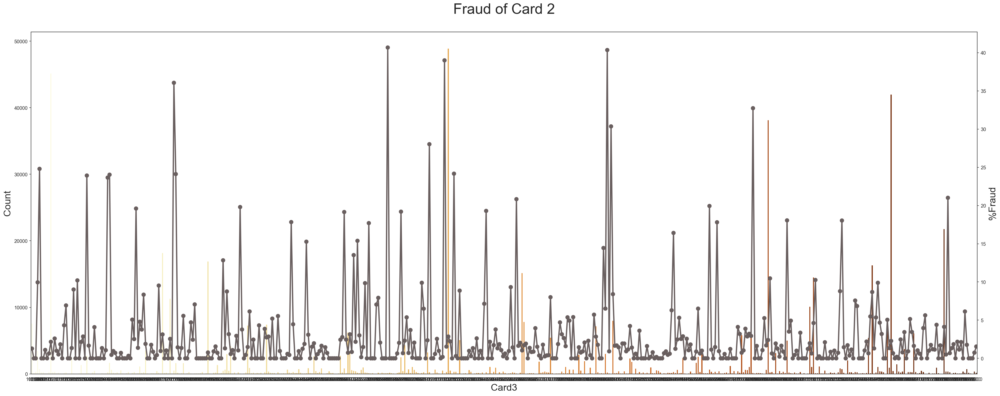

In [38]:
### Checking %fraud for each transaction

plt.figure(figsize = (35,13))
g2 = sns.countplot(x = 'card2', data = card2, palette='YlOrBr')
g22 = g2.twinx()
g22 = sns.pointplot(x = 'card2', y = 'Fraud', data = card22, color = '#695f5f')
plt.title('Fraud of Card 2\n',fontsize=30)
g2.set_xlabel('Card3', fontsize=20)
g2.set_ylabel('Count', fontsize=20)
g22.set_ylabel('%Fraud', fontsize=20)

### Card 3

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='card3', ylabel='Density'>

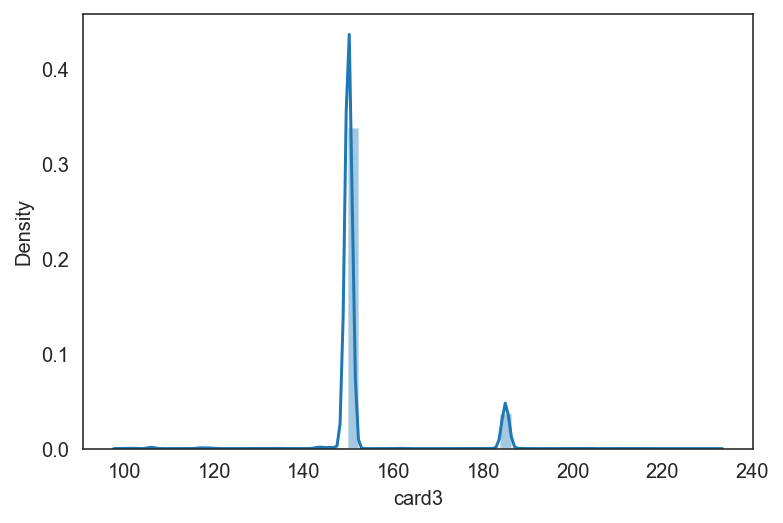

In [39]:
sns.distplot(cards['card3'])

In [40]:
card3 = cards[['card3','TransactionAmt','isFraud']]
card3 = card3.reset_index(drop=True).sort_values(by='isFraud')
card3['color'] = card3['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card3 = card3[card3['TransactionAmt'] < 10000]
card3 = card3.dropna()
card3

,card3,TransactionAmt,isFraud,color
0,150.0,68.500,0,#e5e5e5
390062,150.0,47.950,0,#e5e5e5
390060,150.0,25.950,0,#e5e5e5
390059,150.0,100.000,0,#e5e5e5
390058,150.0,210.950,0,#e5e5e5
...,...,...,...,...
415021,150.0,150.000,1,#ee7106
231999,150.0,59.000,1,#ee7106
199476,150.0,2680.000,1,#ee7106
313705,150.0,994.000,1,#ee7106


In [41]:
card33 = pd.crosstab(cards['card3'], cards['isFraud'], normalize = 'index') *100
card33 = card33.reset_index()
card33 = card33.rename(columns={0:'NoFraud', 1:'Fraud'})
card33

isFraud,card3,NoFraud,Fraud
0,100.0,95.049505,4.950495
1,101.0,100.000000,0.000000
2,102.0,97.608696,2.391304
3,105.0,100.000000,0.000000
4,106.0,98.472311,1.527689
...,...,...,...
109,226.0,100.000000,0.000000
110,227.0,100.000000,0.000000
111,228.0,100.000000,0.000000
112,229.0,99.152542,0.847458


Text(0.5, 1.0, 'Fraud of Card 3\n')

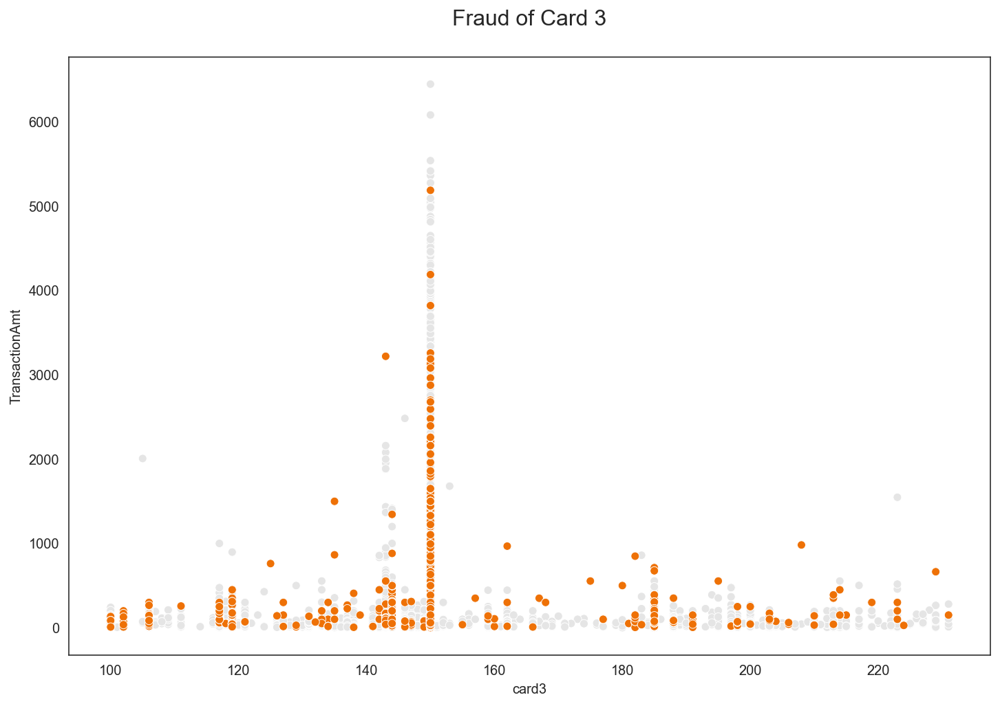

In [42]:
### The distribution of fraud and not fraud of Card 3

plt.figure(figsize = (12,8))
sns.scatterplot(x = 'card3', y = 'TransactionAmt', c = card3['color'], data = card3)
plt.title('Fraud of Card 3\n',fontsize=16)

In [43]:
### This data has low variance so it suitable for plotting to look for percentage of fraud per card3

card3['card3'].value_counts(normalize=True)

150.0    0.885075
185.0    0.095668
106.0    0.002667
144.0    0.002126
146.0    0.002126
           ...   
101.0    0.000002
170.0    0.000002
125.0    0.000002
172.0    0.000002
209.0    0.000002
Name: card3, Length: 114, dtype: float64

Text(0, 0.5, '%Fraud')

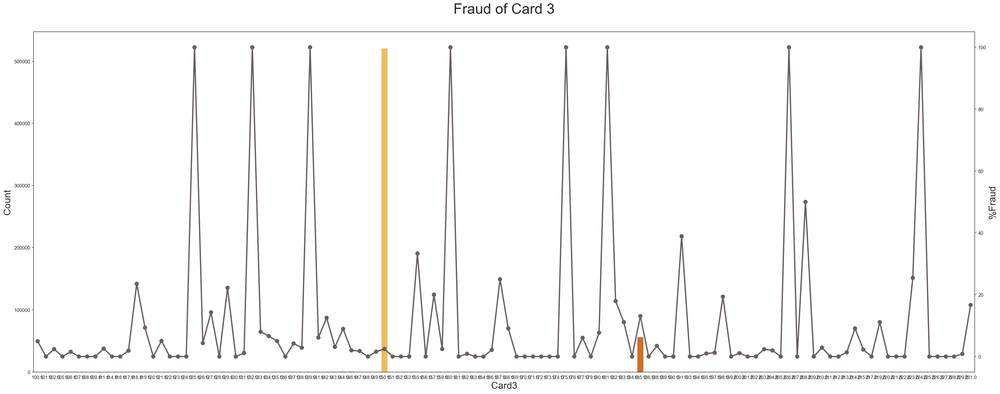

In [44]:
### Checking %fraud for each transaction

plt.figure(figsize = (35,13))
g3 = sns.countplot(x = 'card3', data = card3, palette='YlOrBr')
g33 = g3.twinx()
g33 = sns.pointplot(x = 'card3', y = 'Fraud', data = card33, color = '#695f5f')
plt.title('Fraud of Card 3\n',fontsize=30)
g3.set_xlabel('Card3', fontsize=20)
g3.set_ylabel('Count', fontsize=20)
g33.set_ylabel('%Fraud', fontsize=20)

### Card4

In [45]:
card4 = cards[['card4','TransactionAmt','isFraud']]
card4 = card4.reset_index(drop=True).reset_index().sort_values(by='isFraud')
card4['color'] = card4['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card4 = card4.dropna()
card4

,index,card4,TransactionAmt,isFraud,color
0,0,discover,68.500,0,#e5e5e5
390062,390062,visa,47.950,0,#e5e5e5
390060,390060,visa,25.950,0,#e5e5e5
390059,390059,visa,100.000,0,#e5e5e5
390058,390058,visa,210.950,0,#e5e5e5
...,...,...,...,...,...
415021,415021,visa,150.000,1,#ee7106
231999,231999,visa,59.000,1,#ee7106
199476,199476,visa,2680.000,1,#ee7106
313705,313705,mastercard,994.000,1,#ee7106


In [46]:
card4.card4.value_counts()

visa                384767
mastercard          189217
american express      8328
discover              6651
Name: card4, dtype: int64

Text(0.5, 1.0, 'Type of card\n')

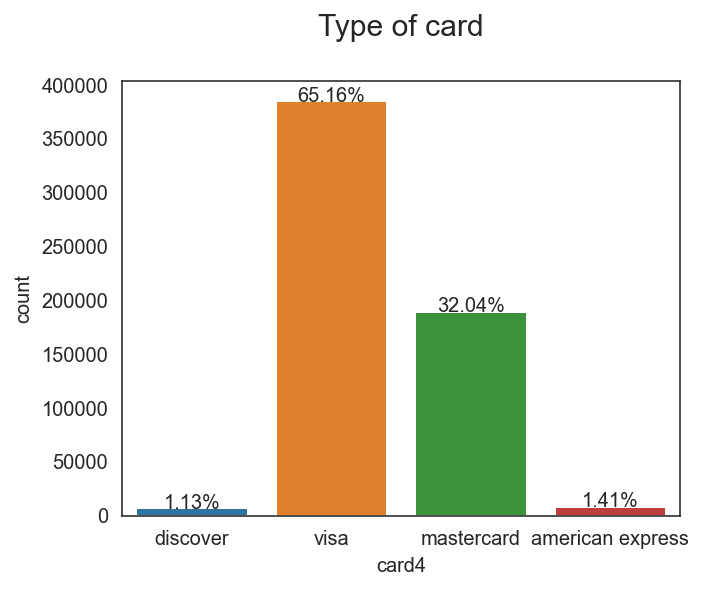

In [47]:
### Ratio of each type of Card 4

plt.figure(figsize=(5,4))
g4 = sns.countplot(x='card4', data = card4)
for p in g4.patches:
    height = p.get_height()
    g4.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=10)

plt.title('Type of card\n', fontsize=15)

In [48]:
card44 = pd.crosstab(cards['card4'], cards['isFraud'], normalize = 'index') *100
card44 = card44.reset_index()
card44 = card44.rename(columns={0:'NoFraud', 1:'Fraud'})
card44

isFraud,card4,NoFraud,Fraud
0,american express,97.130163,2.869837
1,discover,92.271839,7.728161
2,mastercard,96.566905,3.433095
3,visa,96.524390,3.475610


Text(0, 0.5, 'Ratio of Fraud (%)')

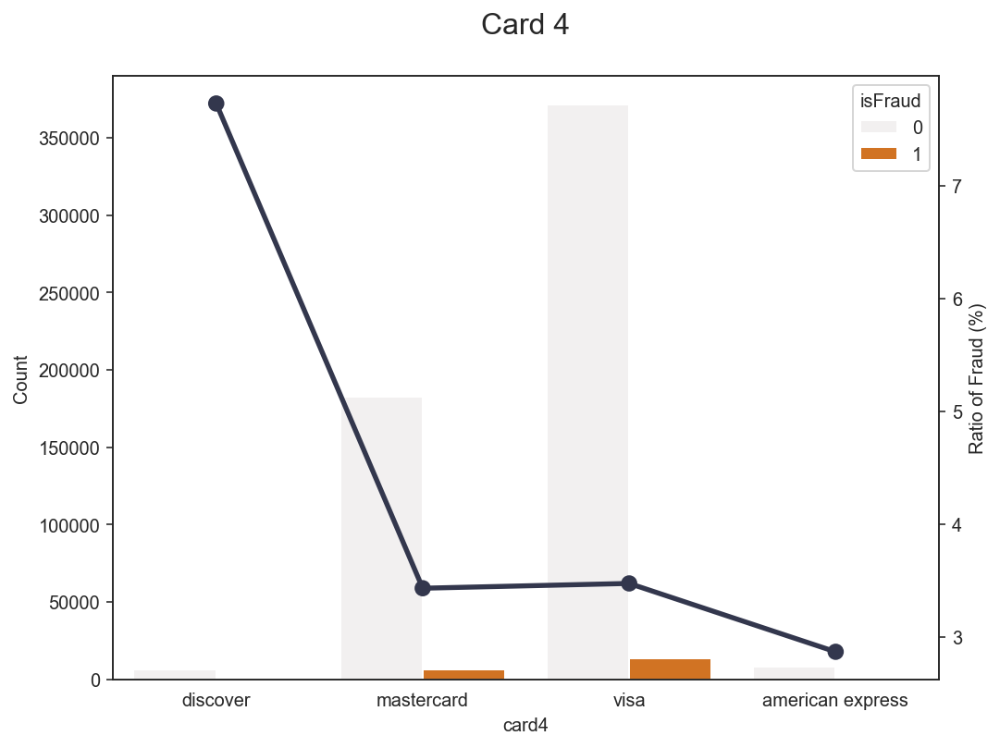

In [49]:
### Plot %fraud & total of transactions for Card 4

plt.figure(figsize=(8,6))
g1 = sns.countplot(x='card4',data = train, hue='isFraud', color = '#ee7106')
#plt.yscale("log")
plt.ylabel('Count')
g2 = g1.twinx()
g2 = sns.pointplot(x='card4', y ='Fraud',data = card44, color = '#33374d', order=['discover', 'mastercard', 'visa', 'american express'])
plt.title('Card 4\n',fontsize=16)
plt.ylabel('Ratio of Fraud (%)')

In [50]:
card4_fraud = card4[card4['isFraud'] == 1]

card4_visa = card4[card4['card4'] == 'visa']
card4_master = card4[card4['card4'] == 'mastercard']
card4_dis = card4[card4['card4'] == 'discover']
card4_american = card4[card4['card4'] == 'american express']

Text(0.5, 1.0, 'Fraud of Card 4\n')

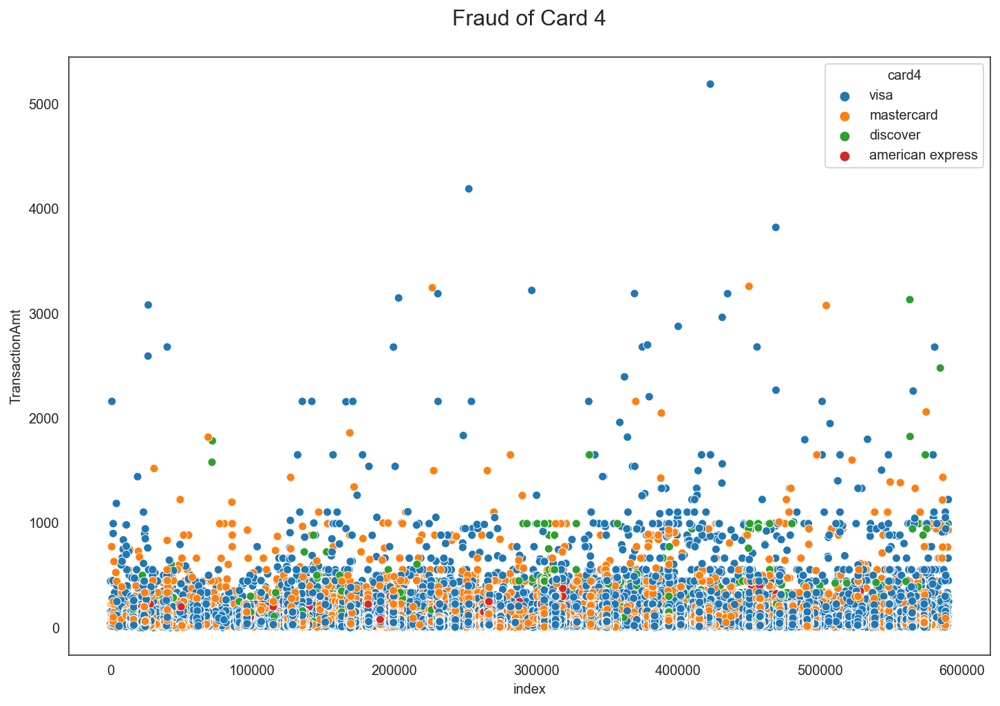

In [51]:
### The distribution of fraud and not fraud of Card 4

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card4_fraud, hue = 'card4')
plt.title('Fraud of Card 4\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of Visa Card\n')

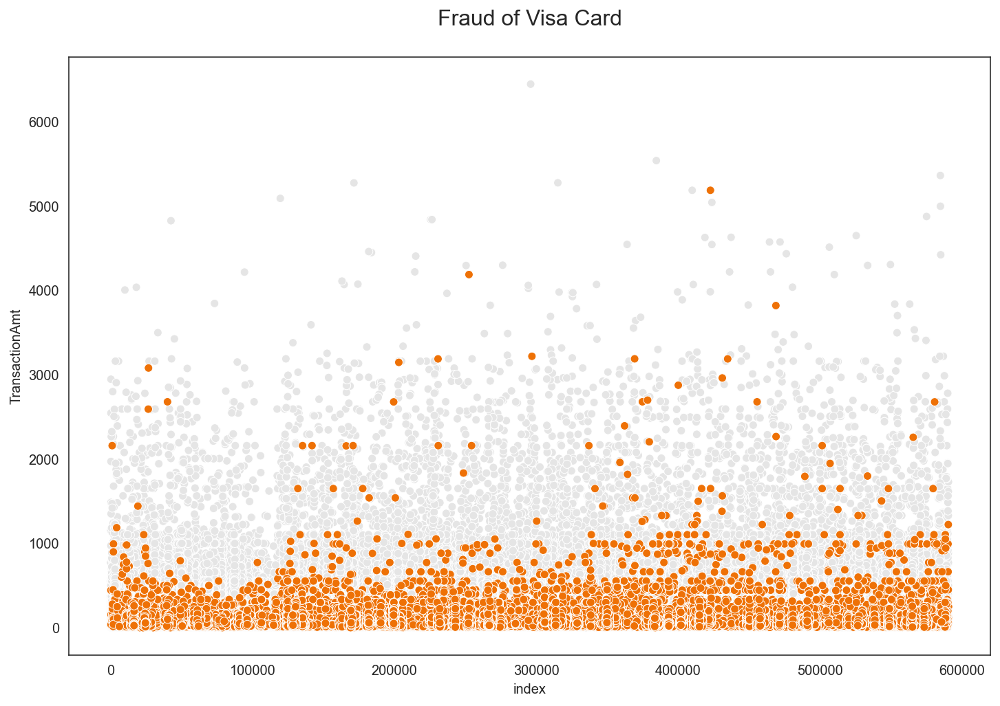

In [52]:
### Visa Card

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card4_visa, c = card4_visa['color'])
plt.title('Fraud of Visa Card\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of Mastercard\n')

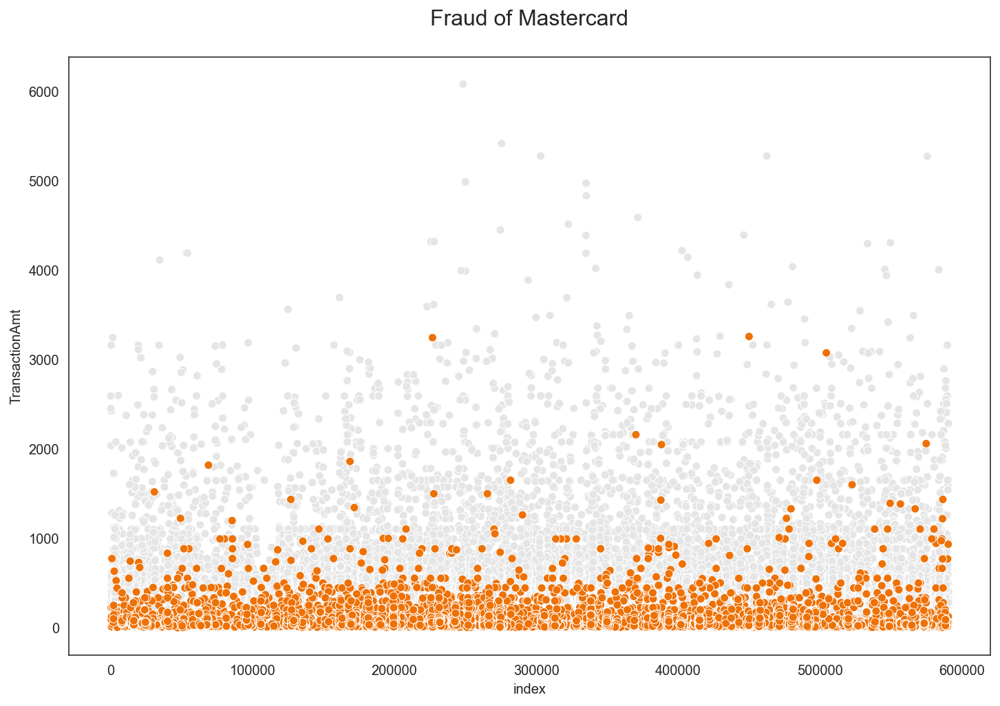

In [53]:
### Mastercard

card4_master = card4_master[card4_master['TransactionAmt'] < 10000]

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card4_master, c = card4_master['color'])
plt.title('Fraud of Mastercard\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of Discovery Card\n')

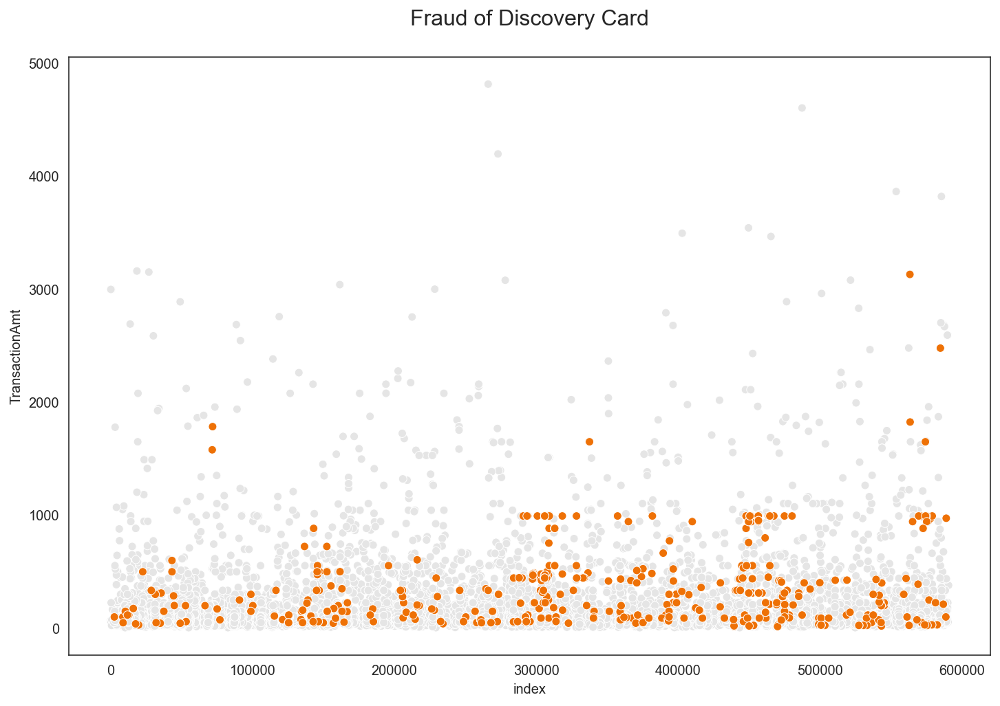

In [54]:
### Discovery Card

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card4_dis, c = card4_dis['color'])
plt.title('Fraud of Discovery Card\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of American Express Card\n')

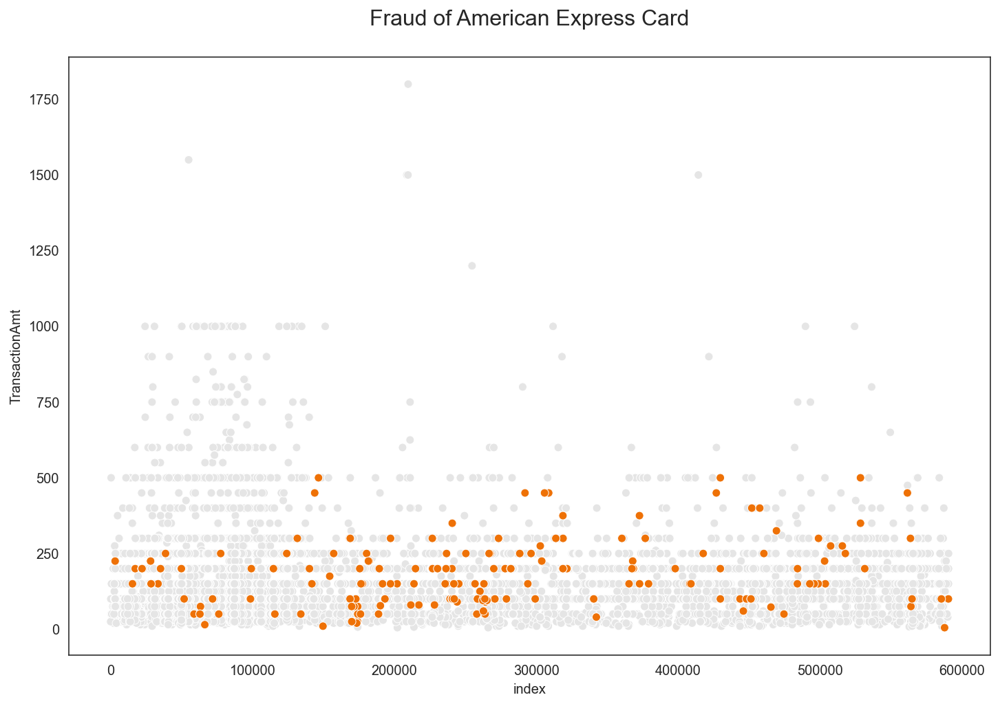

In [55]:
### American Express Card

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card4_american, c = card4_american['color'])
plt.title('Fraud of American Express Card\n',fontsize=16)

### Card 5

C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='card5', ylabel='Density'>

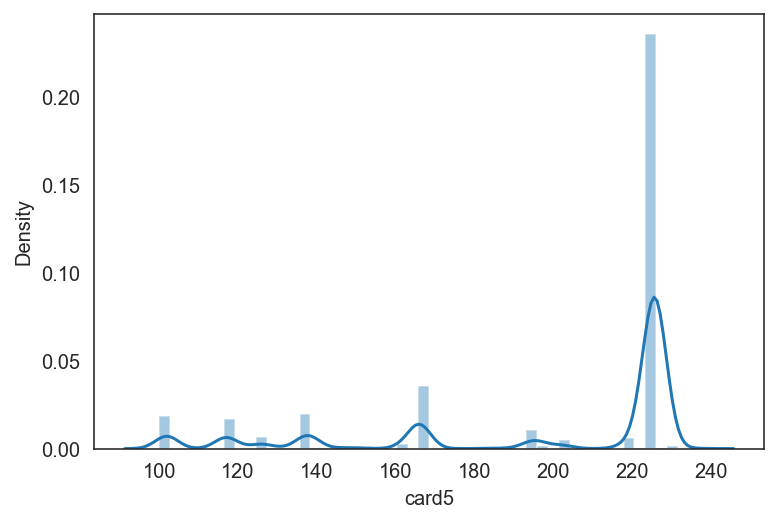

In [56]:
sns.distplot(cards['card5'])

In [57]:
card5 = cards[['card5','TransactionAmt','isFraud']]
card5 = card5.reset_index(drop=True).sort_values(by='isFraud')
card5['color'] = card5['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card5 = card5[card5['TransactionAmt'] < 10000]
card5 = card5.dropna()
card5

,card5,TransactionAmt,isFraud,color
0,142.0,68.500,0,#e5e5e5
390062,226.0,47.950,0,#e5e5e5
390060,226.0,25.950,0,#e5e5e5
390059,195.0,100.000,0,#e5e5e5
390058,226.0,210.950,0,#e5e5e5
...,...,...,...,...
415021,226.0,150.000,1,#ee7106
231999,226.0,59.000,1,#ee7106
199476,226.0,2680.000,1,#ee7106
313705,219.0,994.000,1,#ee7106


In [58]:
card55 = pd.crosstab(cards['card5'], cards['isFraud'], normalize = 'index') *100
card55 = card55.reset_index()
card55 = card55.rename(columns={0:'NoFraud', 1:'Fraud'})
card55

isFraud,card5,NoFraud,Fraud
0,100.0,98.159509,1.840491
1,101.0,100.000000,0.000000
2,102.0,93.705549,6.294451
3,104.0,100.000000,0.000000
4,105.0,100.000000,0.000000
...,...,...,...
114,233.0,100.000000,0.000000
115,234.0,100.000000,0.000000
116,235.0,100.000000,0.000000
117,236.0,96.908810,3.091190


Text(0.5, 1.0, 'Fraud of Card 5\n')

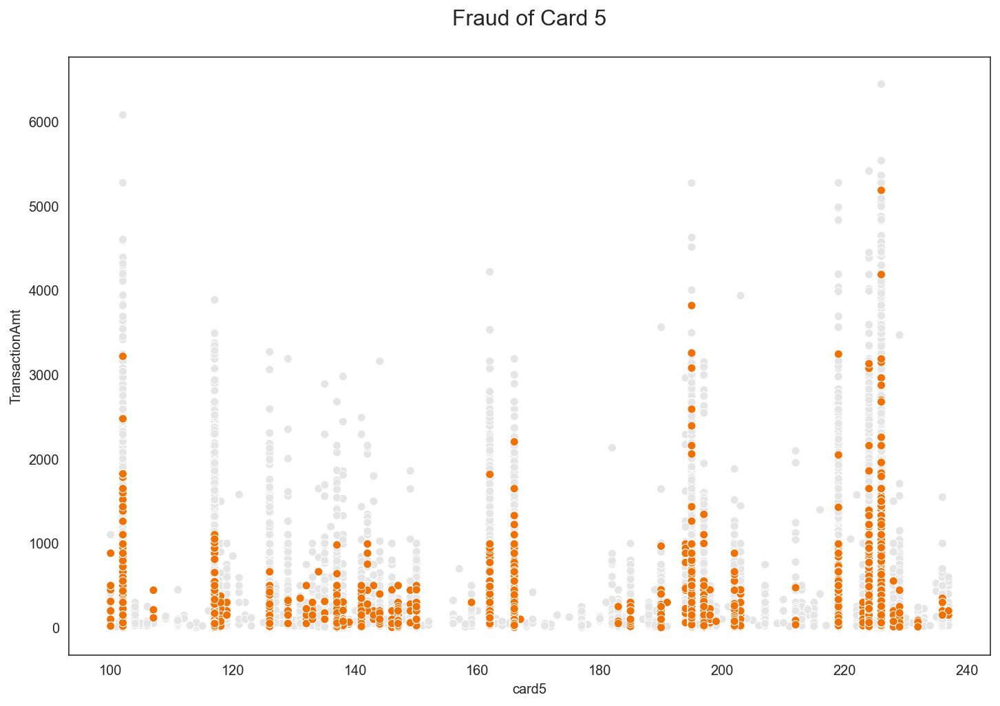

In [59]:
### The distribution of fraud and not fraud of Card 5

plt.figure(figsize = (12,8))
sns.scatterplot(x = 'card5', y = 'TransactionAmt', c = card5['color'], data = card5)
plt.title('Fraud of Card 5\n',fontsize=16)

In [60]:
### This data has low variance so it suitable for plotting to look for percentage of fraud per card3

card5['card5'].value_counts(normalize=True)

226.0    0.505810
224.0    0.139034
166.0    0.097462
102.0    0.049640
117.0    0.044247
           ...   
234.0    0.000002
204.0    0.000002
196.0    0.000002
165.0    0.000002
167.0    0.000002
Name: card5, Length: 119, dtype: float64

Text(0, 0.5, '%Fraud')

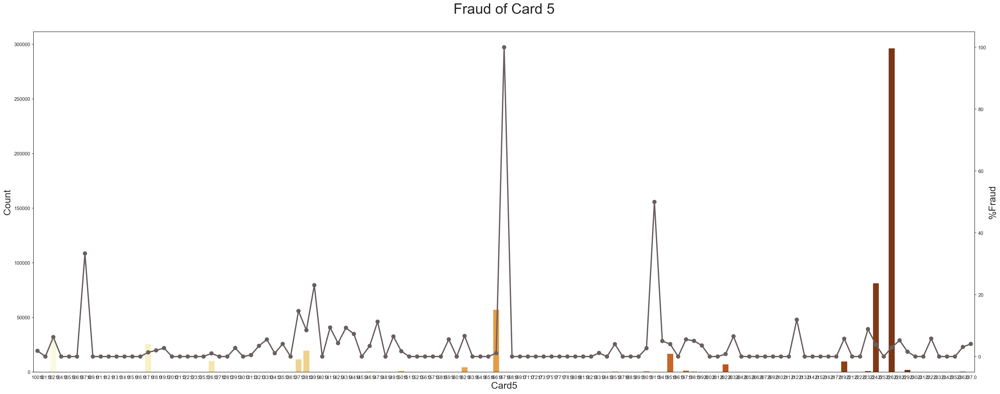

In [61]:
### Checking %fraud for each transaction

plt.figure(figsize = (35,13))
g5 = sns.countplot(x = 'card5', data = card5, palette='YlOrBr')
g55 = g5.twinx()
g55 = sns.pointplot(x = 'card5', y = 'Fraud', data = card55, color = '#695f5f')
plt.title('Fraud of Card 5\n',fontsize=30)
g5.set_xlabel('Card5', fontsize=20)
g5.set_ylabel('Count', fontsize=20)
g55.set_ylabel('%Fraud', fontsize=20)

### Card 6

In [62]:
card6 = cards[['card6','TransactionAmt','isFraud']]
card6 = card6.reset_index(drop=True).reset_index().sort_values(by='isFraud')
card6['color'] = card6['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
card6 = card6.dropna()
card6

,index,card6,TransactionAmt,isFraud,color
0,0,credit,68.500,0,#e5e5e5
390062,390062,debit,47.950,0,#e5e5e5
390060,390060,debit,25.950,0,#e5e5e5
390059,390059,debit,100.000,0,#e5e5e5
390058,390058,debit,210.950,0,#e5e5e5
...,...,...,...,...,...
415021,415021,debit,150.000,1,#ee7106
231999,231999,debit,59.000,1,#ee7106
199476,199476,debit,2680.000,1,#ee7106
313705,313705,credit,994.000,1,#ee7106


In [63]:
card6.card6.value_counts()

debit              439938
credit             148986
debit or credit        30
charge card            15
Name: card6, dtype: int64

Text(0.5, 1.0, 'Type of card\n')

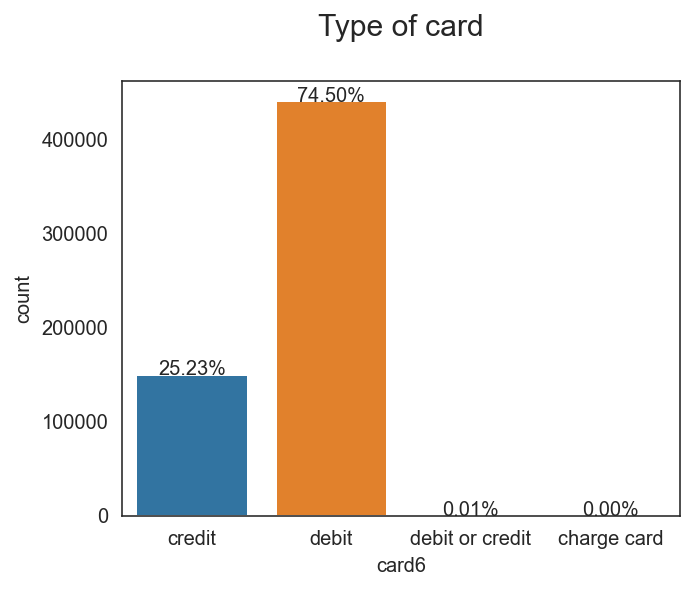

In [64]:
### Ratio of each type of Card 6

plt.figure(figsize=(5,4))
g6 = sns.countplot(x='card6', data = card6)
for p in g6.patches:
    height = p.get_height()
    g6.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=10)

plt.title('Type of card\n', fontsize=15)

In [65]:
card66 = pd.crosstab(cards['card6'], cards['isFraud'], normalize = 'index') *100
card66 = card66.reset_index()
card66 = card66.rename(columns={0:'NoFraud', 1:'Fraud'})
card66

isFraud,card6,NoFraud,Fraud
0,charge card,100.000000,0.000000
1,credit,93.321520,6.678480
2,debit,97.573749,2.426251
3,debit or credit,100.000000,0.000000


Text(0, 0.5, 'Ratio of Fraud (%)')

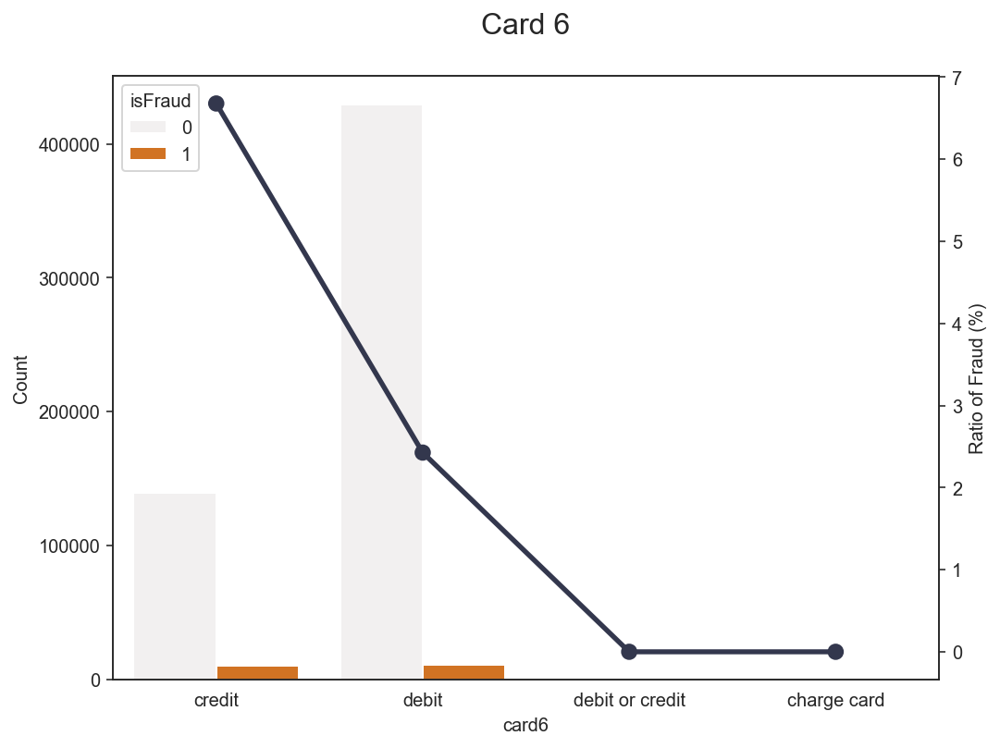

In [66]:
### Plot %fraud & total of transactions for Card 6

plt.figure(figsize=(8,6))
g1 = sns.countplot(x='card6',data = train, hue='isFraud', color = '#ee7106')
#plt.yscale("log")
plt.ylabel('Count')
g2 = g1.twinx()
g2 = sns.pointplot(x='card6', y ='Fraud',data = card66, color = '#33374d', order=['credit', 'debit', 'debit or credit', 'charge card'])
plt.title('Card 6\n',fontsize=16)
plt.ylabel('Ratio of Fraud (%)')

In [67]:
card6_fraud = card6[card6['isFraud'] == 1]

card6_credit = card6[card6['card6'] == 'credit']
card6_debit = card6[card6['card6'] == 'debit']
card6_decre = card6[card6['card6'] == 'debit or credit']
card6_charge = card6[card6['card6'] == 'charge card']

Text(0.5, 1.0, 'Fraud of Card 6\n')

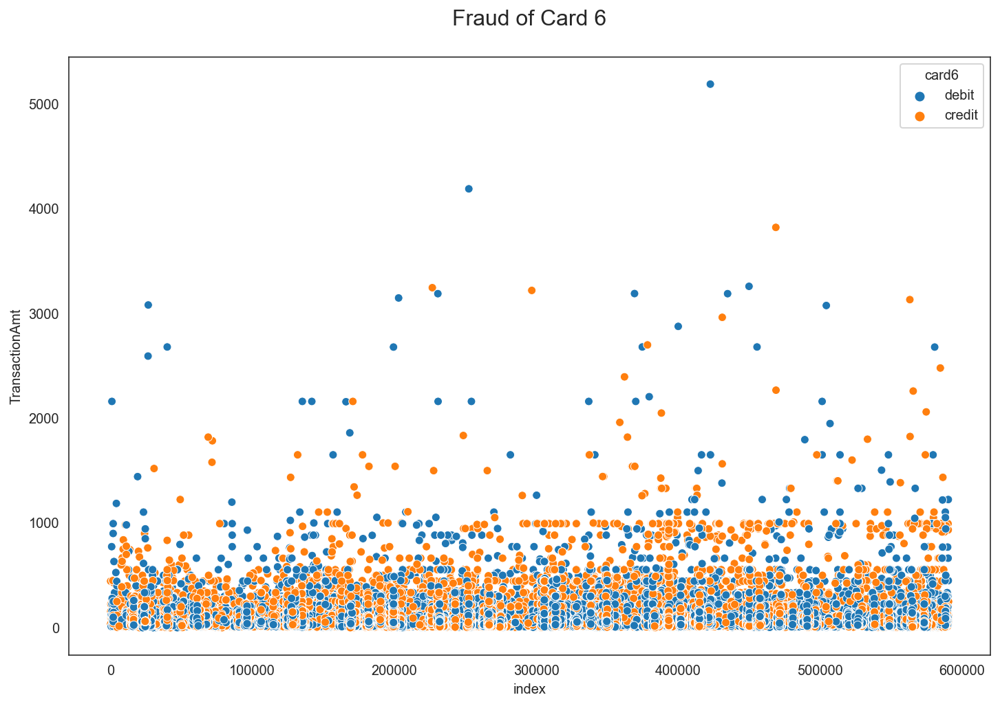

In [68]:
### The distribution of fraud and not fraud of Card 6

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card6_fraud, hue = 'card6')
plt.title('Fraud of Card 6\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of Credit Card\n')

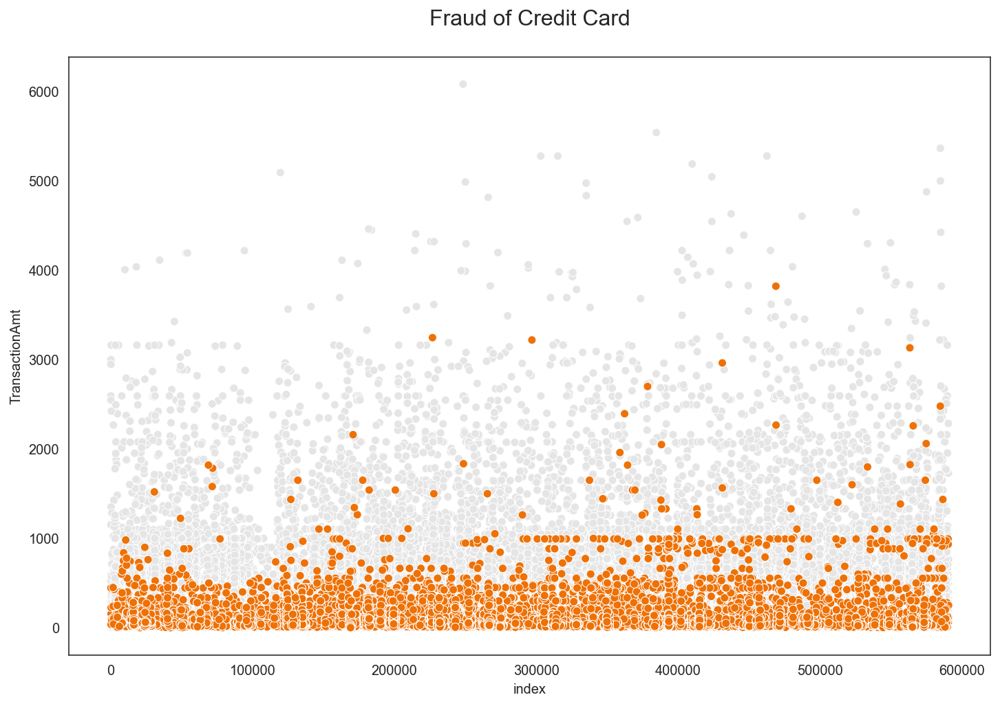

In [69]:
### Credit Card

card6_credit = card6_credit[card6_credit['TransactionAmt'] < 10000]

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card6_credit, c = card6_credit['color'])
plt.title('Fraud of Credit Card\n',fontsize=16)

Text(0.5, 1.0, 'Fraud of Debit Card\n')

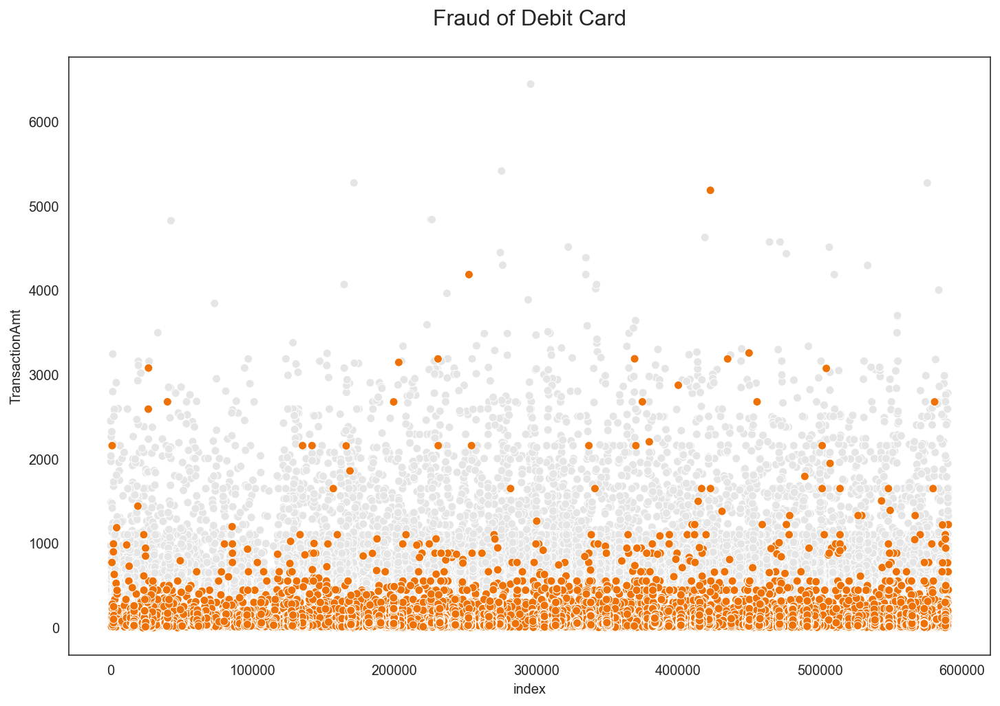

In [70]:
### Debit Card

plt.figure(figsize = (12,8))
sns.scatterplot(x='index', y='TransactionAmt', data = card6_debit, c = card6_debit['color'])
plt.title('Fraud of Debit Card\n',fontsize=16)

## Email

In [71]:
train['P_emaildomain'].value_counts()

gmail.com           228355
yahoo.com           100934
hotmail.com          45250
anonymous.com        36998
aol.com              28289
comcast.net           7888
icloud.com            6267
outlook.com           5096
msn.com               4092
att.net               4033
live.com              3041
sbcglobal.net         2970
verizon.net           2705
ymail.com             2396
bellsouth.net         1909
yahoo.com.mx          1543
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
live.com.mx            749
rocketmail.com         664
mail.com               559
earthlink.net          514
gmail                  496
outlook.es             438
mac.com                436
juno.com               322
aim.com                315
hotmail.es             305
roadrunner.com         305
windstream.net         305
hotmail.fr             295
frontier.com           280
embarqmail.com         260
web.de                 240
twc.com                230
n

In [72]:
email = train.copy()

In [73]:
### Grouping to "Google" domain

email.loc[email['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'

In [74]:
### Grouping to "Yahoo" domain

email.loc[email['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'

In [75]:
### Grouping to "Microsoft" domain

email.loc[email['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'

In [76]:
### Grouping only the email that has less than 2000 transactions to "Others"

email.loc[email['P_emaildomain'].isin(email['P_emaildomain'].value_counts()[email['P_emaildomain'].value_counts() <= 2000 ].index), 'P_emaildomain'] = "Others"

In [77]:
email['P_emaildomain'].value_counts()

Google           228851
Yahoo            102909
Microsoft         59477
anonymous.com     36998
aol.com           28289
Others            13301
comcast.net        7888
icloud.com         6267
att.net            4033
sbcglobal.net      2970
verizon.net        2705
ymail.com          2396
Name: P_emaildomain, dtype: int64

In [78]:
email1 = email[['P_emaildomain','TransactionAmt','isFraud']]
email1 = email1.reset_index(drop=True).reset_index().sort_values(by='isFraud')
email1['color'] = email1['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
email1 = email1.dropna()
email1

,index,P_emaildomain,TransactionAmt,isFraud,color
390059,390059,anonymous.com,100.000,0,#e5e5e5
390058,390058,Yahoo,210.950,0,#e5e5e5
390056,390056,anonymous.com,100.000,0,#e5e5e5
390055,390055,Yahoo,117.000,0,#e5e5e5
390054,390054,icloud.com,114.950,0,#e5e5e5
...,...,...,...,...,...
199488,199488,Google,226.000,1,#ee7106
415021,415021,Google,150.000,1,#ee7106
231999,231999,Yahoo,59.000,1,#ee7106
313705,313705,comcast.net,994.000,1,#ee7106


Text(0.5, 1.0, 'P_Email\n')

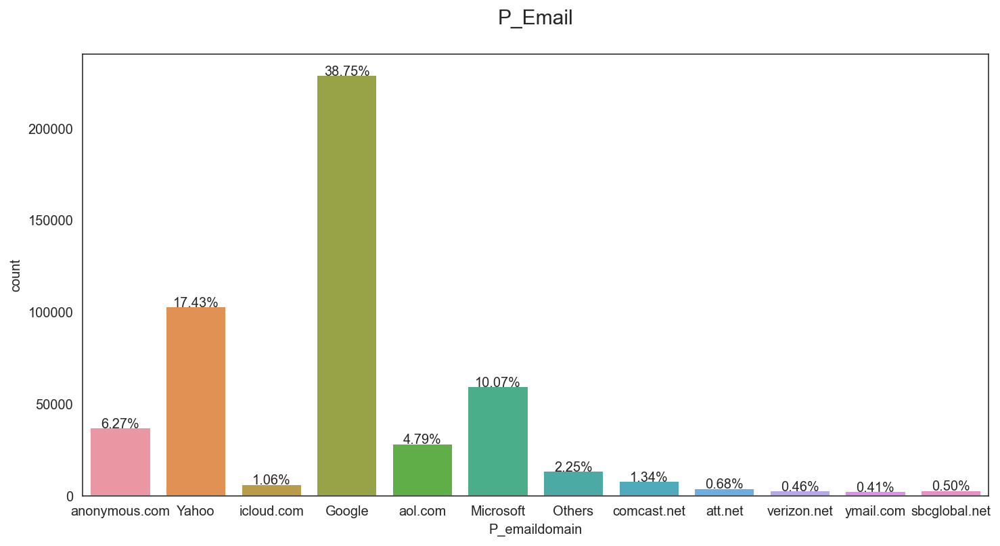

In [79]:
### Ratio of each type for email domain

plt.figure(figsize=(12,6))
e1 = sns.countplot(x='P_emaildomain', data = email1)
for p in e1.patches:
    height = p.get_height()
    e1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=10)

plt.title('P_Email\n', fontsize=15)

In [80]:
email11 = pd.crosstab(email['P_emaildomain'], email['isFraud'], normalize = 'index') *100
email11 = email11.reset_index()
email11 = email11.rename(columns={0:'NoFraud', 1:'Fraud'})
email11

isFraud,P_emaildomain,NoFraud,Fraud
0,Google,95.650445,4.349555
1,Microsoft,94.670209,5.329791
2,Others,97.022780,2.977220
3,Yahoo,97.745581,2.254419
4,anonymous.com,97.678253,2.321747
5,aol.com,97.818940,2.181060
6,att.net,99.256137,0.743863
7,comcast.net,96.881339,3.118661
8,icloud.com,96.856550,3.143450
9,sbcglobal.net,99.595960,0.404040


Text(0, 0.5, 'Ratio of Fraud (%)')

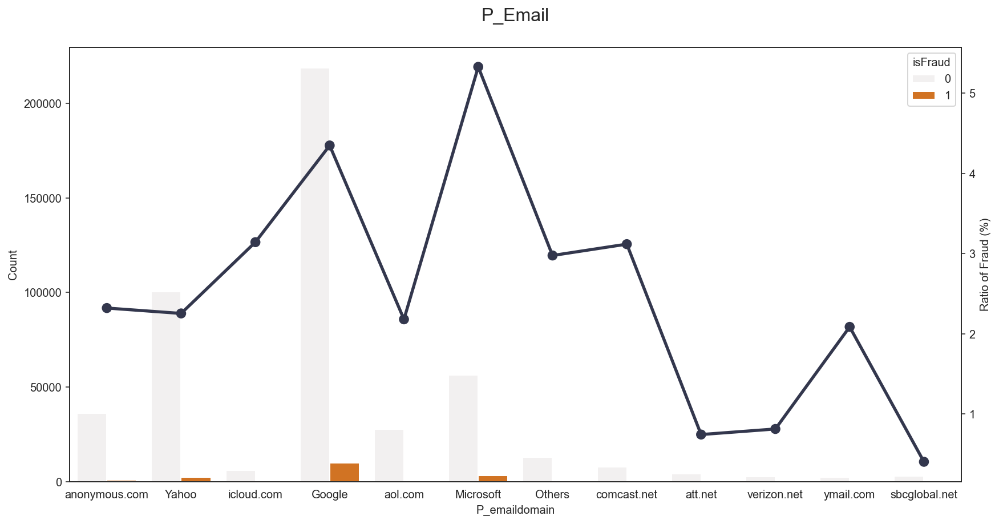

In [81]:
### Plot %fraud & total of transactions for Purchaser email

plt.figure(figsize=(14,7))
e1 = sns.countplot(x='P_emaildomain',data = email1, hue='isFraud', color = '#ee7106')
#plt.yscale("log")
plt.ylabel('Count')
e2 = e1.twinx()
e2 = sns.pointplot(x='P_emaildomain', y ='Fraud',data = email11, color = '#33374d', order=['anonymous.com','Yahoo','icloud.com','Google','aol.com','Microsoft','Others','comcast.net','att.net','verizon.net','ymail.com','sbcglobal.net'])
plt.title('P_Email\n',fontsize=16)
plt.xlabel('P_emaildomain')
plt.ylabel('Ratio of Fraud (%)')

## DeviceType

In [82]:
train['DeviceType'].value_counts()

desktop    85165
mobile     55645
Name: DeviceType, dtype: int64

In [83]:
device1 = train[['DeviceType','TransactionAmt','isFraud']]
device1 = device1.reset_index(drop=True).reset_index().sort_values(by='isFraud')
device1['color'] = device1['isFraud'].map(lambda x:'#ee7106' if x == 1 else '#e5e5e5')
device1 = device1.dropna()
device1

,index,DeviceType,TransactionAmt,isFraud,color
390059,390059,mobile,100.000,0,#e5e5e5
390056,390056,mobile,100.000,0,#e5e5e5
390053,390053,mobile,15.000,0,#e5e5e5
390052,390052,desktop,52.686,0,#e5e5e5
390047,390047,desktop,11.359,0,#e5e5e5
...,...,...,...,...,...
128406,128406,mobile,150.000,1,#ee7106
24497,24497,mobile,56.311,1,#ee7106
24507,24507,desktop,61.628,1,#ee7106
415021,415021,desktop,150.000,1,#ee7106


Text(0.5, 1.0, 'Device Type\n')

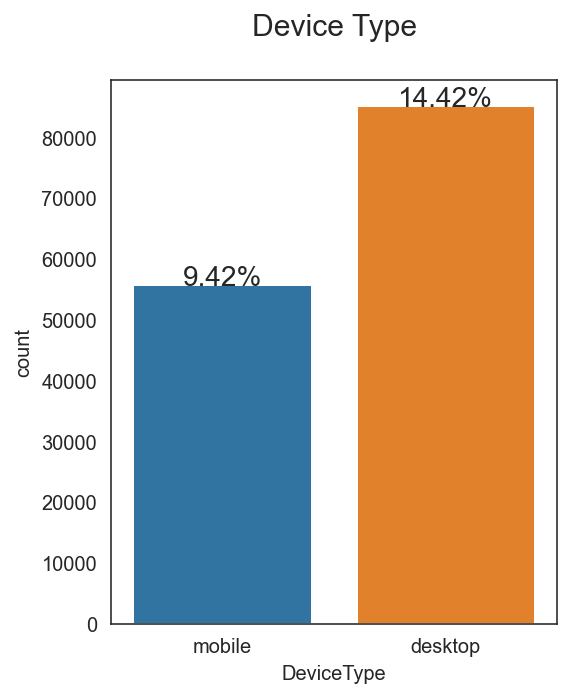

In [84]:
### Ratio of each type for Device type

plt.figure(figsize=(4,5))
d1 = sns.countplot(x='DeviceType', data = device1)
for p in d1.patches:
    height = p.get_height()
    d1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14)

plt.title('Device Type\n', fontsize=15)

In [85]:
device11 = pd.crosstab(train['DeviceType'], train['isFraud'], normalize = 'index') *100
device11 = device11.reset_index()
device11 = device11.rename(columns={0:'NoFraud', 1:'Fraud'})
device11

isFraud,DeviceType,NoFraud,Fraud
0,desktop,93.478542,6.521458
1,mobile,89.833768,10.166232


Text(0, 0.5, 'Ratio of Fraud (%)')

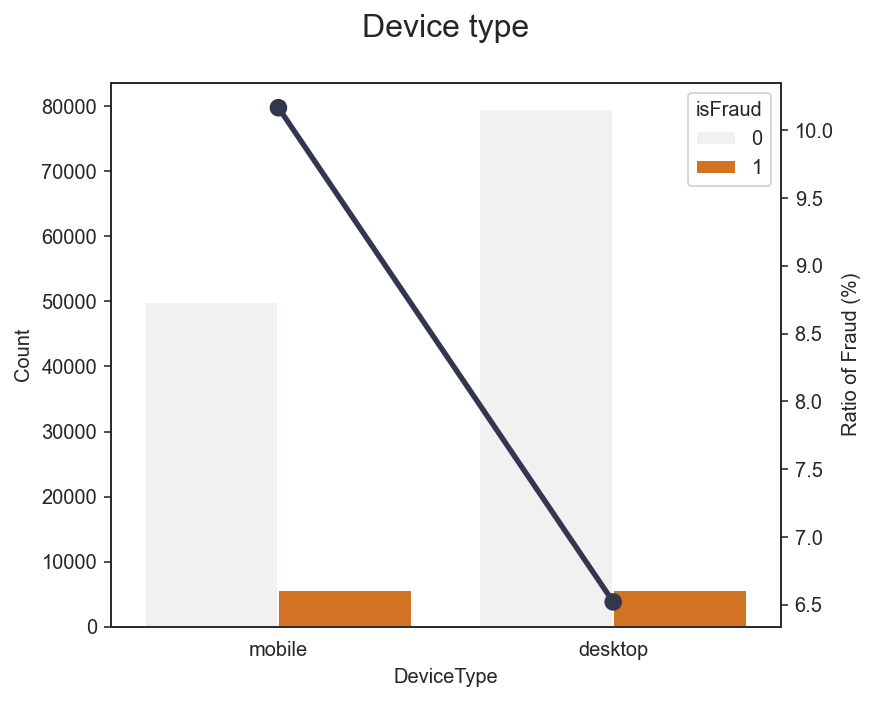

In [86]:
### Plot %fraud & total of transactions for Device type

plt.figure(figsize=(6,5))
d1 = sns.countplot(x='DeviceType',data = device1, hue='isFraud', color = '#ee7106')
plt.ylabel('Count')
d2 = d1.twinx()
d2 = sns.pointplot(x='DeviceType', y ='Fraud',data = device11, color = '#33374d', order=['mobile','desktop'])
plt.title('Device type\n',fontsize=16)
plt.xlabel('DeviceType')
plt.ylabel('Ratio of Fraud (%)')

In [100]:
train_dev = train[train['DeviceType'].isnull()]
train_dev.groupby('ProductCD').count()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card4,card5,card6,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
ProductCD,,,,,,,,,,,,,,,,,,,,,
C,7504,7504,7504,7504,7504,7476,7481,7481,7251,7481,...,0,0,0,0,1,1,1,1,0,0
H,926,926,926,926,926,917,926,926,923,926,...,1,0,0,46,48,48,48,48,0,1
R,1270,1270,1270,1270,1270,1260,1270,1270,1255,1270,...,49,0,0,63,108,108,108,108,0,44
S,360,360,360,360,360,357,360,360,360,360,...,0,0,0,8,18,18,18,18,0,0
W,439670,439670,439670,439670,439670,431665,438299,438299,436617,438299,...,0,0,0,0,0,0,0,0,0,0


In [101]:
train.ProductCD.value_counts()

W    439670
C     68519
R     37699
H     33024
S     11628
Name: ProductCD, dtype: int64

# Cleaning Train & Test Set

In [2]:
### Import data again

df_train_tran = pd.read_csv('ieee-fraud-detection/train_transaction.csv')
df_train_id = pd.read_csv('ieee-fraud-detection/train_identity.csv')
df_test_tran = pd.read_csv('ieee-fraud-detection/test_transaction.csv')
df_test_id = pd.read_csv('ieee-fraud-detection/test_identity.csv')

In [3]:
print(df_train_tran.shape)
print(df_train_id.shape)
print(df_test_tran.shape)
print(df_test_id.shape)

(590540, 394)
(144233, 41)
(506691, 393)
(141907, 41)


## Train Set

In [4]:
train = pd.merge(df_train_tran, df_train_id, on='TransactionID', how='left')

In [5]:
train

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,3577538,0,15811088,117.00,W,7826,481.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
### Separate null value with mode value

for col in train.columns:
    mode = train[col].mode()[0]
    train[col] = train[col].fillna(mode)

In [7]:
### Grouping the email

train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train['P_emaildomain'].isin(train['P_emaildomain'].value_counts()[train['P_emaildomain'].value_counts() <= 10000 ].index), 'P_emaildomain'] = "Others"

In [8]:
train.P_emaildomain.value_counts()

Google           323307
Yahoo            102909
Microsoft         59477
Others            39560
anonymous.com     36998
aol.com           28289
Name: P_emaildomain, dtype: int64

In [9]:
### OneHotEncoding only categorical data from EDA
### Categorical data >> ProductCD, card4, card6, P_emaildomain, DeviceType

train_new = pd.get_dummies(train, columns = ['ProductCD', 'card4', 'P_emaildomain', 'DeviceType'])

In [10]:
train_new.drop(columns = ['TransactionID', 'TransactionDT'], inplace= True)

In [11]:
train_new

,isFraud,TransactionAmt,card1,card2,card3,card5,card6,addr1,addr2,dist1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,0,68.50,13926,321.0,150.0,142.0,credit,315.0,87.0,19.0,...,0,0,1,0,0,0,0,0,1,0
1,0,29.00,2755,404.0,150.0,102.0,credit,325.0,87.0,0.0,...,1,0,1,0,0,0,0,0,1,0
2,0,59.00,4663,490.0,150.0,166.0,debit,330.0,87.0,287.0,...,0,1,0,1,0,0,0,0,1,0
3,0,50.00,18132,567.0,150.0,117.0,debit,476.0,87.0,0.0,...,1,0,0,0,0,1,0,0,1,0
4,0,50.00,4497,514.0,150.0,102.0,credit,420.0,87.0,0.0,...,1,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,0,49.00,6550,321.0,150.0,226.0,debit,272.0,87.0,48.0,...,0,1,1,0,0,0,0,0,1,0
590536,0,39.50,10444,225.0,150.0,224.0,debit,204.0,87.0,0.0,...,1,0,1,0,0,0,0,0,1,0
590537,0,30.95,12037,595.0,150.0,224.0,debit,231.0,87.0,0.0,...,1,0,1,0,0,0,0,0,1,0
590538,0,117.00,7826,481.0,150.0,224.0,debit,387.0,87.0,3.0,...,1,0,0,0,0,0,0,1,1,0


In [12]:
### Use only numerical data into the model

train_new = train_new._get_numeric_data()

In [13]:
train_new

,isFraud,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,0,68.50,13926,321.0,150.0,142.0,315.0,87.0,19.0,7.0,...,0,0,1,0,0,0,0,0,1,0
1,0,29.00,2755,404.0,150.0,102.0,325.0,87.0,0.0,7.0,...,1,0,1,0,0,0,0,0,1,0
2,0,59.00,4663,490.0,150.0,166.0,330.0,87.0,287.0,7.0,...,0,1,0,1,0,0,0,0,1,0
3,0,50.00,18132,567.0,150.0,117.0,476.0,87.0,0.0,7.0,...,1,0,0,0,0,1,0,0,1,0
4,0,50.00,4497,514.0,150.0,102.0,420.0,87.0,0.0,7.0,...,1,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,0,49.00,6550,321.0,150.0,226.0,272.0,87.0,48.0,7.0,...,0,1,1,0,0,0,0,0,1,0
590536,0,39.50,10444,225.0,150.0,224.0,204.0,87.0,0.0,7.0,...,1,0,1,0,0,0,0,0,1,0
590537,0,30.95,12037,595.0,150.0,224.0,231.0,87.0,0.0,7.0,...,1,0,1,0,0,0,0,0,1,0
590538,0,117.00,7826,481.0,150.0,224.0,387.0,87.0,3.0,7.0,...,1,0,0,0,0,0,0,1,1,0


## Test Set

In [14]:
test = pd.merge(df_test_tran, df_test_id, on='TransactionID', how='left')

In [15]:
### Separate null value with mode value

for col in test.columns:
    mode = test[col].mode()[0]
    test[col] = test[col].fillna(mode)

In [16]:
### Grouping the email

test.loc[test['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
test.loc[test['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
test.loc[test['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx', 
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
test.loc[test['P_emaildomain'].isin(test['P_emaildomain'].value_counts()[test['P_emaildomain'].value_counts() <= 10000 ].index), 'P_emaildomain'] = "Others"

In [17]:
### OneHotEncoding only categorical data from EDA
### Categorical data >> ProductCD, card4, card6, P_emaildomain, DeviceType

test_new = pd.get_dummies(test, columns = ['ProductCD', 'card4', 'P_emaildomain', 'DeviceType'])

In [18]:
test_new.drop(columns = ['TransactionID', 'TransactionDT'], inplace= True)

In [19]:
test_new

,TransactionAmt,card1,card2,card3,card5,card6,addr1,addr2,dist1,dist2,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,31.950,10409,111.0,150.0,226.0,debit,170.0,87.0,1.0,0.0,...,0,1,1,0,0,0,0,0,1,0
1,49.000,4272,111.0,150.0,226.0,debit,299.0,87.0,4.0,0.0,...,0,1,0,0,0,0,0,1,1,0
2,171.000,4476,574.0,150.0,226.0,debit,472.0,87.0,2635.0,0.0,...,0,1,0,1,0,0,0,0,1,0
3,284.950,10989,360.0,150.0,166.0,debit,205.0,87.0,17.0,0.0,...,0,1,1,0,0,0,0,0,1,0
4,67.950,18018,452.0,150.0,117.0,debit,264.0,87.0,6.0,0.0,...,1,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,94.679,13832,375.0,185.0,224.0,debit,284.0,60.0,0.0,0.0,...,1,0,1,0,0,0,0,0,1,0
506687,12.173,3154,408.0,185.0,224.0,debit,299.0,87.0,0.0,157.0,...,1,0,0,1,0,0,0,0,0,1
506688,49.000,16661,490.0,150.0,226.0,debit,327.0,87.0,0.0,0.0,...,0,1,0,1,0,0,0,0,1,0
506689,202.000,16621,516.0,150.0,224.0,debit,177.0,87.0,0.0,0.0,...,1,0,0,1,0,0,0,0,1,0


In [20]:
### Use only numerical data into the model

test_new = test_new._get_numeric_data()

In [21]:
test_new

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,31.950,10409,111.0,150.0,226.0,170.0,87.0,1.0,0.0,6.0,...,0,1,1,0,0,0,0,0,1,0
1,49.000,4272,111.0,150.0,226.0,299.0,87.0,4.0,0.0,3.0,...,0,1,0,0,0,0,0,1,1,0
2,171.000,4476,574.0,150.0,226.0,472.0,87.0,2635.0,0.0,2.0,...,0,1,0,1,0,0,0,0,1,0
3,284.950,10989,360.0,150.0,166.0,205.0,87.0,17.0,0.0,5.0,...,0,1,1,0,0,0,0,0,1,0
4,67.950,18018,452.0,150.0,117.0,264.0,87.0,6.0,0.0,6.0,...,1,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,94.679,13832,375.0,185.0,224.0,284.0,60.0,0.0,0.0,1.0,...,1,0,1,0,0,0,0,0,1,0
506687,12.173,3154,408.0,185.0,224.0,299.0,87.0,0.0,157.0,1.0,...,1,0,0,1,0,0,0,0,0,1
506688,49.000,16661,490.0,150.0,226.0,327.0,87.0,0.0,0.0,1.0,...,0,1,0,1,0,0,0,0,1,0
506689,202.000,16621,516.0,150.0,224.0,177.0,87.0,0.0,0.0,1.0,...,1,0,0,1,0,0,0,0,1,0


# Supervised Method

In [22]:
X = train_new.drop(columns= ['isFraud'])
y = train_new['isFraud']

In [23]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state=101)

In [24]:
print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(472432, 417)
(118108, 417)
(472432,)
(118108,)


In [25]:
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train)
X_val_sc = ss.transform(X_val)

In [26]:
y_train.value_counts() ### Imbalance Data

0    455920
1     16512
Name: isFraud, dtype: int64

## SMOTE

In [53]:
### For solving the imbalance data

sm = SMOTE()

Xsm_train, ysm_train = sm.fit_resample(X_train_sc, y_train)

In [28]:
ysm_train.value_counts() ### Balance Data

0    455920
1    455920
Name: isFraud, dtype: int64

In [29]:
print(Xsm_train.shape)
print(X_val.shape)
print(ysm_train.shape)
print(y_val.shape)

(911840, 417)
(118108, 417)
(911840,)
(118108,)


## PCA

In [30]:
list(X_train.columns)

['TransactionAmt',
 'card1',
 'card2',
 'card3',
 'card5',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67',
 'V68',
 'V69',
 'V70',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V81',
 'V82',
 'V83',
 'V84',
 'V85',
 'V86',
 'V87',


In [31]:
columns_pca = [i for i in X_train.columns][5:]

In [32]:
X_train_pca1 = pd.DataFrame(Xsm_train, columns=X_train.columns)
X_val_pca1 = pd.DataFrame(X_val.reset_index(drop=True), columns=X_val.columns)

In [33]:
X_val_pca1

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,15.00,13734,491.0,150.0,226.0,337.0,87.0,0.0,7.0,1.0,...,0,1,1,0,0,0,0,0,1,0
1,25.95,11207,361.0,150.0,226.0,325.0,87.0,11.0,7.0,4.0,...,0,1,0,0,0,1,0,0,1,0
2,44.00,7919,194.0,150.0,202.0,327.0,87.0,0.0,7.0,3.0,...,1,0,1,0,0,0,0,0,1,0
3,88.50,4249,555.0,150.0,102.0,325.0,87.0,59.0,7.0,1.0,...,1,0,0,0,0,0,1,0,1,0
4,97.00,6481,111.0,150.0,226.0,251.0,87.0,17.0,7.0,2.0,...,0,1,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118103,87.95,2803,100.0,150.0,226.0,315.0,87.0,86.0,7.0,5.0,...,0,1,1,0,0,0,0,0,1,0
118104,56.95,2803,100.0,150.0,226.0,315.0,87.0,11.0,7.0,1.0,...,0,1,1,0,0,0,0,0,1,0
118105,107.95,2755,404.0,150.0,102.0,143.0,87.0,0.0,7.0,4.0,...,1,0,1,0,0,0,0,0,1,0
118106,445.00,6019,583.0,150.0,226.0,325.0,87.0,0.0,7.0,2.0,...,0,1,0,0,1,0,0,0,1,0


In [34]:
X_val_pca1 = ss.transform(X_val_pca1)

In [35]:
X_val_pca1 = pd.DataFrame(X_val_pca1, columns = X_train_pca1.columns)
X_val_pca1

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,-0.497394,0.782725,0.822962,-0.28128,0.644887,0.471856,0.069716,-0.196397,-0.098731,-0.097862,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
1,-0.452031,0.267214,-0.006452,-0.28128,0.644887,0.346758,0.069716,-0.151161,-0.098731,-0.075571,...,-0.686204,0.726389,-1.100621,-0.334339,-0.267345,2.175941,-0.258581,-0.224322,0.322064,-0.322064
2,-0.377256,-0.403542,-1.071929,-0.28128,0.062051,0.367608,0.069716,-0.196397,-0.098731,-0.083001,...,1.457293,-1.376673,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
3,-0.192907,-1.152226,1.231288,-0.28128,-2.366432,0.346758,0.069716,0.046230,-0.098731,-0.097862,...,1.457293,-1.376673,-1.100621,-0.334339,-0.267345,-0.459571,3.867259,-0.224322,0.322064,-0.322064
4,-0.157695,-0.696895,-1.601478,-0.28128,0.644887,-0.424680,0.069716,-0.126487,-0.098731,-0.090432,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118103,-0.195186,-1.447212,-1.671659,-0.28128,0.644887,0.242510,0.069716,0.157262,-0.098731,-0.068141,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118104,-0.323608,-1.447212,-1.671659,-0.28128,0.644887,0.242510,0.069716,-0.151161,-0.098731,-0.097862,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118105,-0.112332,-1.457004,0.267893,-0.28128,-2.366432,-1.550562,0.069716,-0.196397,-0.098731,-0.075571,...,1.457293,-1.376673,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118106,1.283955,-0.791144,1.409931,-0.28128,0.644887,0.346758,0.069716,-0.196397,-0.098731,-0.090432,...,-0.686204,0.726389,-1.100621,-0.334339,3.740478,-0.459571,-0.258581,-0.224322,0.322064,-0.322064


In [36]:
X_train_pca = X_train_pca1[columns_pca]
X_val_pca = X_val_pca1[columns_pca]

In [37]:
print(X_train_pca.shape)
print(X_val_pca.shape)

(911840, 412)
(118108, 412)


In [38]:
pca = PCA()
X_pca = pca.fit_transform(X_train_pca)

In [ ]:
exp_variance = pca.explained_variance_ratio_
exp_variance[:50]

In [110]:
np.cumsum(pca.explained_variance_ratio_)[:50]

array([0.20506552, 0.31085464, 0.37465744, 0.42907011, 0.46923389,
       0.49517314, 0.52046998, 0.54480796, 0.56427247, 0.58098723,
       0.59643827, 0.61073344, 0.62413323, 0.63674569, 0.64904893,
       0.6612021 , 0.67289977, 0.68384704, 0.69400238, 0.70341313,
       0.71218915, 0.72043453, 0.72787999, 0.73515523, 0.74203229,
       0.74868393, 0.75489189, 0.76076997, 0.76633922, 0.77165604,
       0.77683475, 0.78183178, 0.78679643, 0.79146648, 0.79611558,
       0.80065836, 0.80498585, 0.80925421, 0.81325389, 0.81717616,
       0.82096837, 0.8246955 , 0.82829072, 0.83172649, 0.83494143,
       0.83807483, 0.84120279, 0.84424092, 0.84713202, 0.85000598])

C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 0, 'Number of Components')

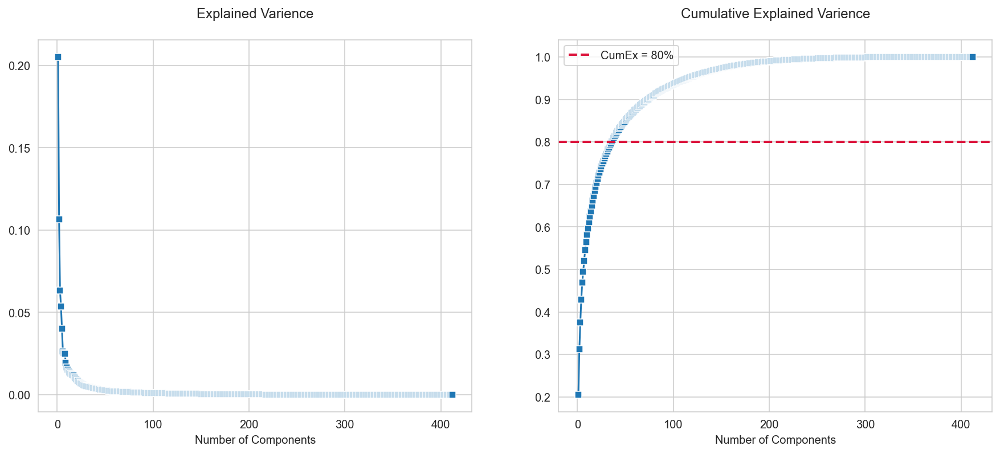

In [78]:
### Suitable number of components = 100 (Cumulative Explained Varience = 95%)

sns.set_style('whitegrid')
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,6))
x = list(range(1, len(exp_variance)+1));
ax1 = sns.lineplot(x, exp_variance, marker = 's', markersize=6, ax=ax1);
ax2 = sns.lineplot(x, np.cumsum(exp_variance), marker = 's', markersize=6, ax=ax2);
ax2.axhline(0.80,ls='--',lw=2,c='crimson',label='CumEx = 80%')
ax2.legend()
#plt.xticks(x);
ax1.set_title('Explained Varience\n');
ax1.set_xlabel('Number of Components')
ax2.set_title('Cumulative Explained Varience\n');
ax2.set_xlabel('Number of Components')

In [111]:
ysm_train_pca = pd.DataFrame(ysm_train, columns=['isFraud'])

In [112]:
df_pca = ysm_train_pca.copy()
df_pca['pca1'] = X_pca[:,0]
df_pca['pca2'] = X_pca[:,1]
df_pca['pca3'] = X_pca[:,2]
df_pca['pca4'] = X_pca[:,3]

In [113]:
df_pca.head()

,isFraud,pca1,pca2,pca3,pca4
0,0,-4.556207,1.566596,-1.017223,0.967742
1,0,-1.947846,5.728228,0.504833,-0.678529
2,0,-9.167767,-10.800005,-1.587832,4.126752
3,0,-4.874528,1.333594,-1.797929,1.509959
4,0,3.139286,-7.786771,5.634346,-11.665222


C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='pca2', ylabel='Density'>

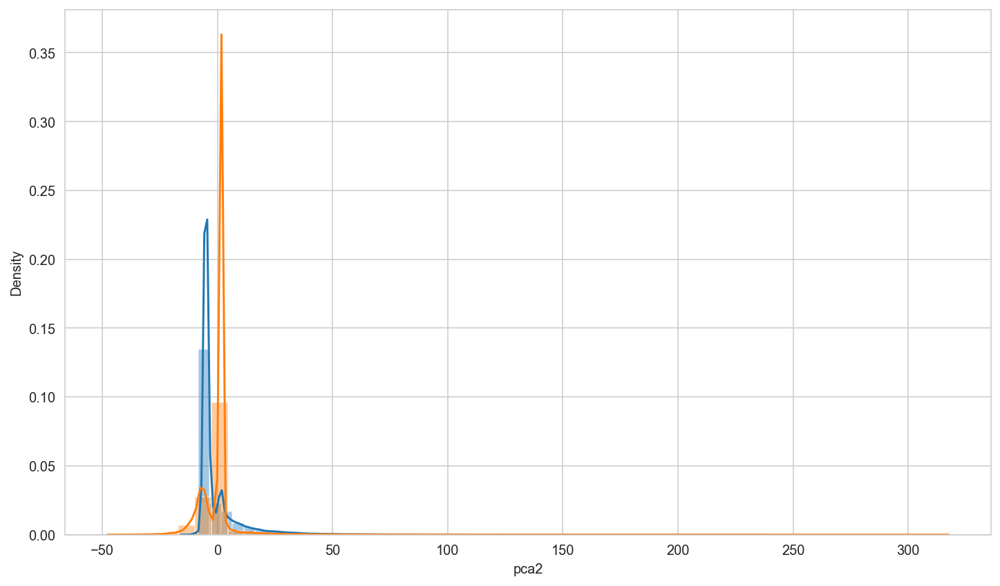

In [82]:
plt.figure(figsize=(12,7))
sns.distplot(df_pca['pca1'])
sns.distplot(df_pca['pca2'])

In [83]:
### From Cumulative Explained Varience = 95% --> n_components = 100

pca2 = PCA(n_components=100,random_state=1)
X_train_pca2 = pca2.fit_transform(X_train_pca)
X_val_pca2 = pca2.transform(X_val_pca)

In [84]:
column_pca = ['pca'+str(i) for i in range(1,101)]

X_train_pca2 = pd.DataFrame(X_train_pca2, columns = column_pca)
X_val_pca2 = pd.DataFrame(X_val_pca2, columns = column_pca)

X_train_pca2.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48
0,-4.543673,1.565321,-1.046306,0.946945,-0.392814,-0.035596,0.499342,-0.046502,1.060848,1.650102,...,0.503292,-0.458069,0.503988,-0.260440,-0.770788,-0.574426,-0.584395,-1.577452,-1.247828,0.136217
1,-1.947537,5.709598,0.497378,-0.644109,2.716137,0.579671,-0.534958,-0.595203,3.187859,2.319327,...,-11.830431,6.614482,0.493654,-2.726187,3.496272,3.589403,-0.071689,-2.562206,-1.072238,2.610955
2,-9.167878,-10.839463,-1.710649,4.097650,6.540354,4.403448,3.084639,1.891849,3.773703,3.844243,...,-0.079324,0.916447,2.566796,1.587063,-2.412830,1.688703,0.525639,4.476392,-0.955491,-2.487203
3,-4.860843,1.338207,-1.833636,1.455919,-0.827922,-0.109479,0.162452,-0.286547,-1.130308,0.301137,...,-0.119961,-0.212871,-0.215600,-0.477875,-0.175168,0.580241,0.096808,0.478445,0.829835,-0.129865
4,3.164799,-7.759718,5.959285,-11.553792,-0.925271,-1.122439,-0.084683,-1.180577,-1.999252,-2.009115,...,0.022483,1.954969,-0.605084,2.228865,-0.104001,-3.995976,3.758567,-7.757163,3.472864,2.239505


In [85]:
X_val_pca1

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,-0.497394,0.782725,0.822962,-0.28128,0.644887,0.471856,0.069716,-0.196397,-0.098731,-0.097862,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
1,-0.452031,0.267214,-0.006452,-0.28128,0.644887,0.346758,0.069716,-0.151161,-0.098731,-0.075571,...,-0.686204,0.726389,-1.100621,-0.334339,-0.267345,2.175941,-0.258581,-0.224322,0.322064,-0.322064
2,-0.377256,-0.403542,-1.071929,-0.28128,0.062051,0.367608,0.069716,-0.196397,-0.098731,-0.083001,...,1.457293,-1.376673,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
3,-0.192907,-1.152226,1.231288,-0.28128,-2.366432,0.346758,0.069716,0.046230,-0.098731,-0.097862,...,1.457293,-1.376673,-1.100621,-0.334339,-0.267345,-0.459571,3.867259,-0.224322,0.322064,-0.322064
4,-0.157695,-0.696895,-1.601478,-0.28128,0.644887,-0.424680,0.069716,-0.126487,-0.098731,-0.090432,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118103,-0.195186,-1.447212,-1.671659,-0.28128,0.644887,0.242510,0.069716,0.157262,-0.098731,-0.068141,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118104,-0.323608,-1.447212,-1.671659,-0.28128,0.644887,0.242510,0.069716,-0.151161,-0.098731,-0.097862,...,-0.686204,0.726389,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118105,-0.112332,-1.457004,0.267893,-0.28128,-2.366432,-1.550562,0.069716,-0.196397,-0.098731,-0.075571,...,1.457293,-1.376673,0.908578,-0.334339,-0.267345,-0.459571,-0.258581,-0.224322,0.322064,-0.322064
118106,1.283955,-0.791144,1.409931,-0.28128,0.644887,0.346758,0.069716,-0.196397,-0.098731,-0.090432,...,-0.686204,0.726389,-1.100621,-0.334339,3.740478,-0.459571,-0.258581,-0.224322,0.322064,-0.322064


In [86]:
print(X_train_pca2.shape)
print(X_val_pca2.shape)

(911840, 48)
(118108, 48)


In [87]:
X_train_pca11 = X_train_pca1.drop(columns = columns_pca)
X_val_pca11 = X_val_pca1.reset_index(drop=True).drop(columns = columns_pca)

In [88]:
X_train_pca2 = pd.concat([X_train_pca11, X_train_pca2],axis=1)
X_val_pca2 = pd.concat([X_val_pca11, X_val_pca2],axis=1)

In [89]:
X_val_pca2

,TransactionAmt,card1,card2,card3,card5,pca1,pca2,pca3,pca4,pca5,...,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48
0,-0.497394,0.782725,0.822962,-0.28128,0.644887,-4.771226,1.603148,-1.697024,1.398292,-0.249119,...,0.623357,0.738587,0.679869,1.091198,0.746841,0.265666,-1.090272,-0.834877,1.228009,-0.920525
1,-0.452031,0.267214,-0.006452,-0.28128,0.644887,-5.405584,1.895680,-2.578999,2.444788,-0.821077,...,0.167554,0.151271,0.328619,1.069783,0.166388,-0.487277,-1.074668,0.026143,-0.148161,-0.822437
2,-0.377256,-0.403542,-1.071929,-0.28128,0.062051,-5.160020,1.640753,-1.613838,3.349524,-0.133162,...,-0.086576,-0.461903,0.296360,0.761074,0.571397,0.741362,0.869838,1.175993,-2.972003,-0.665607
3,-0.192907,-1.152226,1.231288,-0.28128,-2.366432,-4.747051,1.146294,-1.694249,1.186370,-1.079157,...,-0.388399,-0.428542,-0.170039,-0.675161,-0.436620,0.856633,1.240158,0.319228,1.258548,0.643196
4,-0.157695,-0.696895,-1.601478,-0.28128,0.644887,-5.200818,1.796713,-2.270949,2.162769,-0.578192,...,0.349308,0.556568,-0.440382,-0.049300,0.672200,-0.290994,-0.792927,0.182899,-0.082629,-0.544029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118103,-0.195186,-1.447212,-1.671659,-0.28128,0.644887,-5.333567,1.578097,-2.510939,2.377757,-1.396846,...,-0.576396,-0.128731,-0.580618,-1.462878,-0.749799,-0.200609,1.824821,-1.482809,1.267711,1.572607
118104,-0.323608,-1.447212,-1.671659,-0.28128,0.644887,-5.475160,1.947529,-2.680542,2.667815,-1.255417,...,0.134398,0.518529,-0.051623,0.223853,0.250948,-0.391114,-0.492560,-0.751515,0.247604,0.107331
118105,-0.112332,-1.457004,0.267893,-0.28128,-2.366432,-3.691808,-0.082441,2.767652,7.227059,-0.537488,...,-1.392139,1.008710,1.066969,0.801540,0.741149,-1.745841,0.383221,0.925391,-3.847998,3.563957
118106,1.283955,-0.791144,1.409931,-0.28128,0.644887,-5.304062,1.794723,-2.194148,2.953236,1.989552,...,-0.311328,0.067175,-0.238647,-0.741358,-0.542242,-1.756232,-0.540952,-0.395094,-0.441988,-0.014555


In [90]:
print(X_train_pca2.shape)
print(X_val_pca2.shape)

(911840, 53)
(118108, 53)


In [91]:
Xsm_train = X_train_pca2
X_val_sc = X_val_pca2

## Decision Tree

In [128]:
tree = DecisionTreeClassifier(random_state=101)
tree.fit(Xsm_train, ysm_train)

DecisionTreeClassifier(random_state=101)

In [129]:
pred_proba_tree = tree.predict_proba(X_val_sc)
pred_proba_tree[:20]

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.]])

In [130]:
pred_tree = tree.predict(X_val_sc)

In [131]:
pred_proba_tree = pd.DataFrame(pred_proba_tree).reset_index().rename(columns={'index':'Id',0:'NoFraud',1:'Fraud'})
pred_proba_tree['Id'] = [i for i in range(1,len(pred_proba_tree)+1)]
pred_proba_tree = pred_proba_tree.drop(columns=['NoFraud'])

In [132]:
pred_proba_tree.head(10)

,Id,Fraud
0,1,0.0
1,2,0.0
2,3,0.0
3,4,0.0
4,5,0.0
5,6,0.0
6,7,0.0
7,8,0.0
8,9,1.0
9,10,1.0


In [133]:
tree.score(Xsm_train, ysm_train)

0.9999649061238813

In [134]:
tree.score(X_val_sc, y_val)

0.9135790970975717

In [135]:
print(f'AUC score = {roc_auc_score(y_val, pred_tree)}')
print(f'f1 score = {f1_score(y_val, pred_tree)}')
print(f'Precision score = {precision_score(y_val, pred_tree)}')
print(f'Recall score = {recall_score(y_val, pred_tree)}')

AUC score = 0.7271472826246002
f1 score = 0.2998833939227656
Precision score = 0.20962792481779824
Recall score = 0.5266200915442062


In [136]:
# Compute ROC curve and ROC area for each class
fpr, tpr, thresholds = roc_curve(y_val.ravel(), pred_tree.ravel())
roc_auc = auc(fpr, tpr)

In [137]:
roc_auc

0.7271472826246002

Text(0.5, 0, 'False positive')

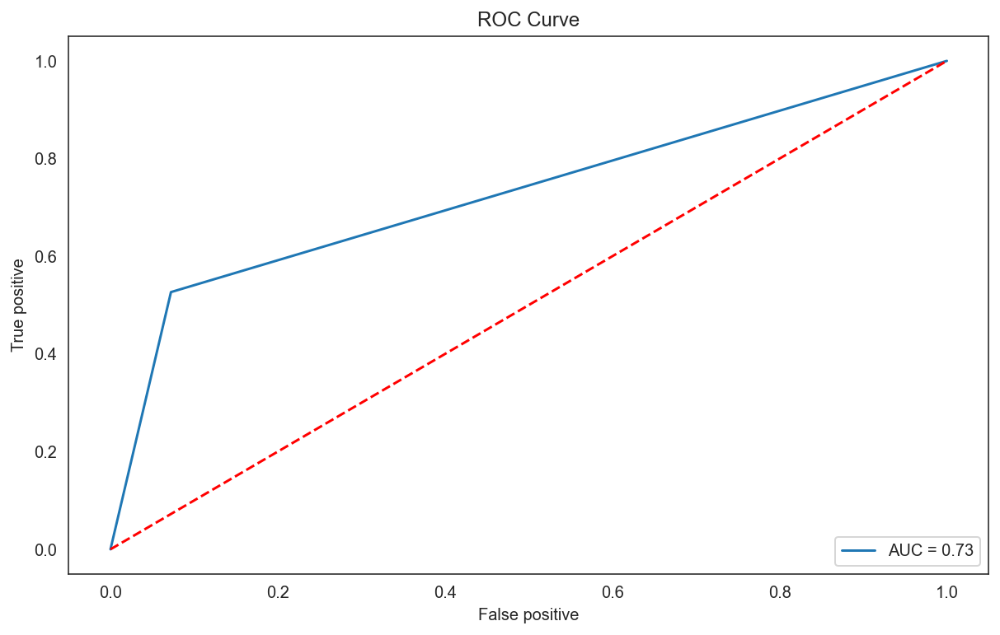

In [138]:
#Plotting ROC Curve
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
plt.grid(color = 'w')
plt.plot(fpr, tpr, label = 'AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.ylabel('True positive')
plt.xlabel('False positive')

In [139]:
print(classification_report(y_val, pred_tree))

              precision    recall  f1-score   support

           0       0.98      0.93      0.95    113957
           1       0.21      0.53      0.30      4151

    accuracy                           0.91    118108
   macro avg       0.60      0.73      0.63    118108
weighted avg       0.95      0.91      0.93    118108



<Figure size 360x324 with 0 Axes>

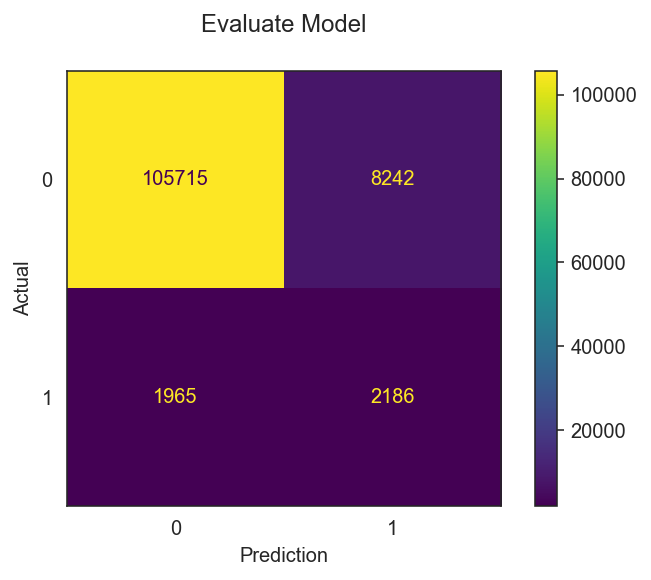

In [140]:
plt.figure(figsize = (5, 4.5))
disp = plot_confusion_matrix(tree, X_val_sc, y_val,cmap = plt.cm.viridis)
plt.title('Evaluate Model\n')
plt.xlabel('Prediction')
plt.ylabel('Actual')
print(disp)

In [141]:
tn, fp, fn, tp = confusion_matrix(y_val,pred_tree).ravel()
print('Correctly Predict that Wnv is Positive (TP):',tp)
print('Correctly Predict that Wnv is Negative (TN):',tn)
print('Incorrectly Predict that Wnv is Positive (FP):',fp)
print('Incorrectly Predict that Wnv is Negative (FN):',fn)

Correctly Predict that Wnv is Positive (TP): 2186
Correctly Predict that Wnv is Negative (TN): 105715
Incorrectly Predict that Wnv is Positive (FP): 8242
Incorrectly Predict that Wnv is Negative (FN): 1965


In [142]:
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.9136
Misclassification rate: 0.0864
Precision: 0.2096
Recall: 0.5266
Specificity: 0.9277


In [143]:
### Find the features importance (Top15)

importance = pd.DataFrame(tree.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef',ascending=False).head(15)

,coef
pca1,0.175753
TransactionAmt,0.133815
pca5,0.065292
card2,0.054716
card1,0.045459
card5,0.040637
pca22,0.032661
pca10,0.022490
pca19,0.017603
pca28,0.015471


In [145]:
### Find the features importance (coef = 0)

importance = pd.DataFrame(tree.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef')
importance[importance['coef']==0]

,coef


## Random Forest

In [146]:
clf = RandomForestClassifier(n_estimators=200,min_samples_split=11,min_samples_leaf=7, max_features=2,max_depth= 90,random_state=101)
clf.fit(Xsm_train, ysm_train)

RandomForestClassifier(max_depth=90, max_features=2, min_samples_leaf=7,
                       min_samples_split=11, n_estimators=200,
                       random_state=101)

In [147]:
pred_proba_clf = clf.predict_proba(X_val_sc)
pred_proba_clf[:20]

array([[0.96112674, 0.03887326],
       [0.94141656, 0.05858344],
       [0.81521189, 0.18478811],
       [0.96195998, 0.03804002],
       [0.91726365, 0.08273635],
       [0.74023514, 0.25976486],
       [0.75880366, 0.24119634],
       [0.79614088, 0.20385912],
       [0.34609988, 0.65390012],
       [0.24585784, 0.75414216],
       [0.96621663, 0.03378337],
       [0.84690606, 0.15309394],
       [0.67992607, 0.32007393],
       [0.69150512, 0.30849488],
       [0.88876746, 0.11123254],
       [0.72814414, 0.27185586],
       [0.95263367, 0.04736633],
       [0.99468954, 0.00531046],
       [0.54473586, 0.45526414],
       [0.9492109 , 0.0507891 ]])

In [148]:
pred_clf = clf.predict(X_val_sc)

In [149]:
pred_proba_clf = pd.DataFrame(pred_proba_clf).reset_index().rename(columns={'index':'Id',0:'NoFraud',1:'Fraud'})
pred_proba_clf['Id'] = [i for i in range(1,len(pred_proba_clf)+1)]
pred_proba_clf = pred_proba_clf.drop(columns=['NoFraud'])

In [150]:
pred_proba_clf.head(10)

,Id,Fraud
0,1,0.038873
1,2,0.058583
2,3,0.184788
3,4,0.038040
4,5,0.082736
5,6,0.259765
6,7,0.241196
7,8,0.203859
8,9,0.653900
9,10,0.754142


In [151]:
clf.score(Xsm_train, ysm_train)

0.9884223109317424

In [152]:
clf.score(X_val_sc, y_val)

0.946413452094693

In [153]:
print(f'AUC score = {roc_auc_score(y_val, pred_clf)}')
print(f'f1 score = {f1_score(y_val, pred_clf)}')
print(f'Precision score = {precision_score(y_val, pred_clf)}')
print(f'Recall score = {recall_score(y_val, pred_clf)}')

AUC score = 0.8019629835102421
f1 score = 0.4589210908780029
Precision score = 0.3556851311953353
Recall score = 0.6465911828475066


In [154]:
# Compute ROC curve and ROC area for each class
fpr, tpr, thresholds = roc_curve(y_val.ravel(), pred_clf.ravel())
roc_auc = auc(fpr, tpr)

In [155]:
roc_auc

0.8019629835102421

Text(0.5, 0, 'False positive')

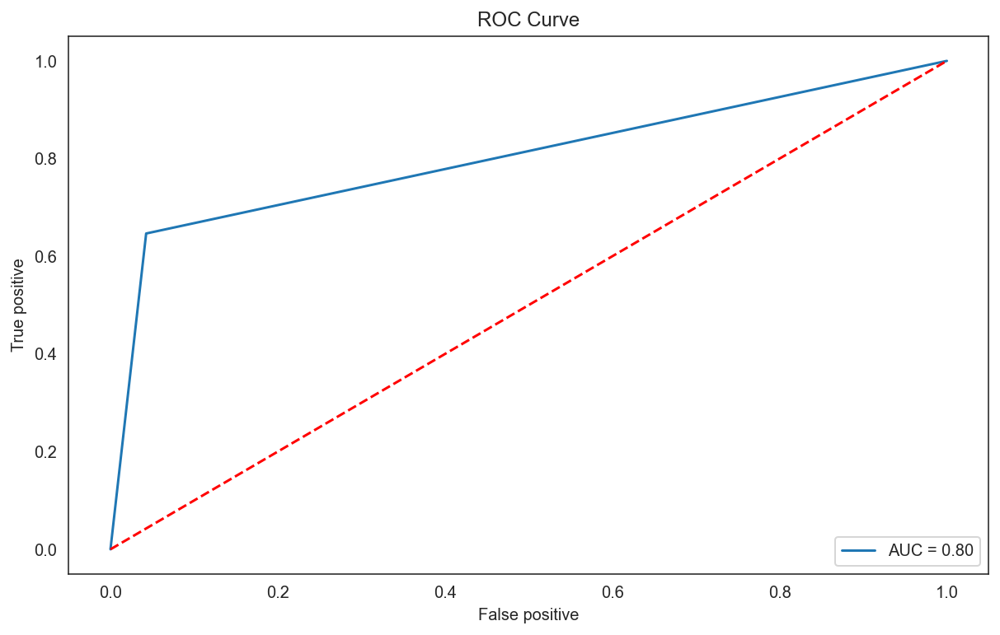

In [156]:
#Plotting ROC Curve
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
plt.grid(color = 'w')
plt.plot(fpr, tpr, label = 'AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.ylabel('True positive')
plt.xlabel('False positive')

In [157]:
print(classification_report(y_val, pred_clf))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97    113957
           1       0.36      0.65      0.46      4151

    accuracy                           0.95    118108
   macro avg       0.67      0.80      0.72    118108
weighted avg       0.96      0.95      0.95    118108



<Figure size 360x324 with 0 Axes>

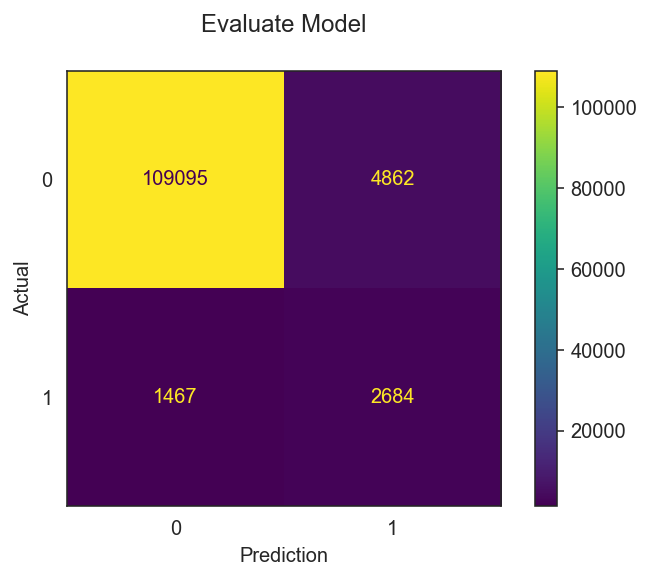

In [158]:
plt.figure(figsize = (5, 4.5))
disp = plot_confusion_matrix(clf, X_val_sc, y_val,cmap = plt.cm.viridis)
plt.title('Evaluate Model\n')
plt.xlabel('Prediction')
plt.ylabel('Actual')
print(disp)

In [159]:
tn, fp, fn, tp = confusion_matrix(y_val,pred_clf).ravel()
print('Correctly Predict that Wnv is Positive (TP):',tp)
print('Correctly Predict that Wnv is Negative (TN):',tn)
print('Incorrectly Predict that Wnv is Positive (FP):',fp)
print('Incorrectly Predict that Wnv is Negative (FN):',fn)

Correctly Predict that Wnv is Positive (TP): 2684
Correctly Predict that Wnv is Negative (TN): 109095
Incorrectly Predict that Wnv is Positive (FP): 4862
Incorrectly Predict that Wnv is Negative (FN): 1467


In [160]:
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.9464
Misclassification rate: 0.0536
Precision: 0.3557
Recall: 0.6466
Specificity: 0.9573


In [161]:
### Find the features importance (Top15)

importance = pd.DataFrame(clf.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef',ascending=False).head(15)

,coef
pca1,0.046994
TransactionAmt,0.030595
pca4,0.028462
pca2,0.028360
pca8,0.027054
pca3,0.026353
pca5,0.025553
card3,0.025175
pca15,0.022799
card2,0.022594


In [162]:
### Find the features importance (coef = 0)

importance = pd.DataFrame(clf.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef')
importance[importance['coef']==0]

,coef


## Gradient Boosting

In [110]:
gb = GradientBoostingClassifier(n_estimators=200, random_state=101)
gb.fit(Xsm_train, ysm_train)

GradientBoostingClassifier(n_estimators=200, random_state=101)

In [111]:
pred_proba_gb = gb.predict_proba(X_val_sc)
pred_proba_gb[:20]

array([[0.65527055, 0.34472945],
       [0.91065842, 0.08934158],
       [0.73543763, 0.26456237],
       [0.89582229, 0.10417771],
       [0.81333648, 0.18666352],
       [0.64310789, 0.35689211],
       [0.90771442, 0.09228558],
       [0.81823605, 0.18176395],
       [0.64399016, 0.35600984],
       [0.34205421, 0.65794579],
       [0.84352723, 0.15647277],
       [0.98547117, 0.01452883],
       [0.5724651 , 0.4275349 ],
       [0.56134569, 0.43865431],
       [0.85212919, 0.14787081],
       [0.84054978, 0.15945022],
       [0.80091907, 0.19908093],
       [0.98286208, 0.01713792],
       [0.72572444, 0.27427556],
       [0.81104801, 0.18895199]])

In [112]:
pred_gb = gb.predict(X_val_sc)

In [113]:
pred_proba_gb = pd.DataFrame(pred_proba_gb).reset_index().rename(columns={'index':'Id',0:'NoFraud',1:'Fraud'})
pred_proba_gb['Id'] = [i for i in range(1,len(pred_proba_gb)+1)]
pred_proba_gb = pred_proba_gb.drop(columns=['NoFraud'])

In [114]:
pred_proba_gb.head(10)

,Id,Fraud
0,1,0.344729
1,2,0.089342
2,3,0.264562
3,4,0.104178
4,5,0.186664
5,6,0.356892
6,7,0.092286
7,8,0.181764
8,9,0.356010
9,10,0.657946


In [115]:
gb.score(Xsm_train, ysm_train)

0.8457689945604492

In [116]:
gb.score(X_val_sc, y_val)

0.8564110813831408

In [117]:
print(f'AUC score = {roc_auc_score(y_val, pred_gb)}')
print(f'f1 score = {f1_score(y_val, pred_gb)}')
print(f'Precision score = {precision_score(y_val, pred_gb)}')
print(f'Recall score = {recall_score(y_val, pred_gb)}')

AUC score = 0.7664648512315588
f1 score = 0.246902615569075
Precision score = 0.15135017421602787
Recall score = 0.669718140207179


In [118]:
# Compute ROC curve and ROC area for each class
fpr, tpr, thresholds = roc_curve(y_val.ravel(), pred_gb.ravel())
roc_auc = auc(fpr, tpr)

In [119]:
roc_auc

0.7664648512315588

Text(0.5, 0, 'False positive')

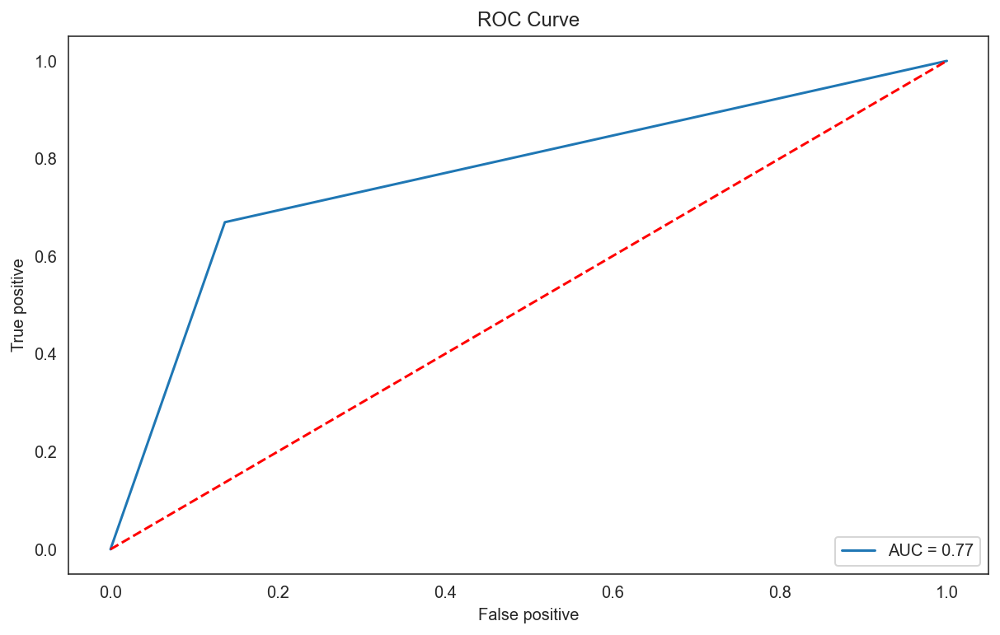

In [120]:
#Plotting ROC Curve
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
plt.grid(color = 'w')
plt.plot(fpr, tpr, label = 'AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.ylabel('True positive')
plt.xlabel('False positive')

In [121]:
print(classification_report(y_val, pred_gb))

              precision    recall  f1-score   support

           0       0.99      0.86      0.92    113957
           1       0.15      0.67      0.25      4151

    accuracy                           0.86    118108
   macro avg       0.57      0.77      0.58    118108
weighted avg       0.96      0.86      0.90    118108



<Figure size 360x324 with 0 Axes>

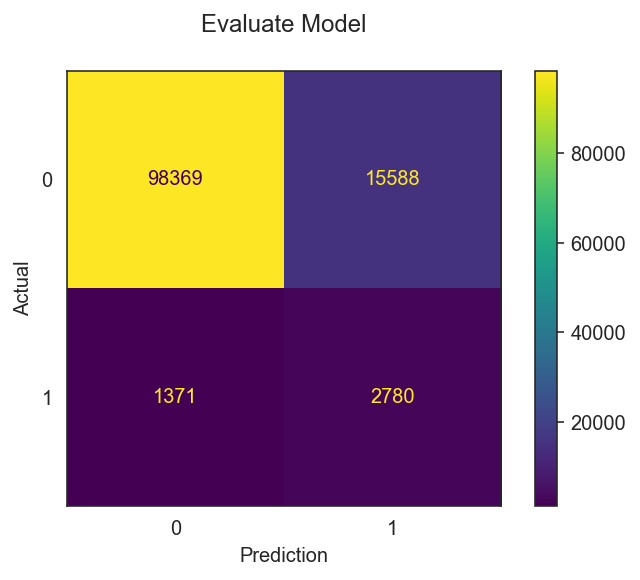

In [122]:
plt.figure(figsize = (5, 4.5))
disp = plot_confusion_matrix(gb, X_val_sc, y_val,cmap = plt.cm.viridis)
plt.title('Evaluate Model\n')
plt.xlabel('Prediction')
plt.ylabel('Actual')
print(disp)

In [123]:
tn, fp, fn, tp = confusion_matrix(y_val,pred_gb).ravel()
print('Correctly Predict that Wnv is Positive (TP):',tp)
print('Correctly Predict that Wnv is Negative (TN):',tn)
print('Incorrectly Predict that Wnv is Positive (FP):',fp)
print('Incorrectly Predict that Wnv is Negative (FN):',fn)

Correctly Predict that Wnv is Positive (TP): 2780
Correctly Predict that Wnv is Negative (TN): 98369
Incorrectly Predict that Wnv is Positive (FP): 15588
Incorrectly Predict that Wnv is Negative (FN): 1371


In [124]:
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.8564
Misclassification rate: 0.1436
Precision: 0.1514
Recall: 0.6697
Specificity: 0.8632


In [125]:
### Find the features importance (Top15)

importance = pd.DataFrame(gb.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef',ascending=False).head(15)

,coef
pca1,0.332523
TransactionAmt,0.118710
card5,0.101298
pca5,0.077193
card2,0.069699
pca19,0.047118
card1,0.042295
pca4,0.022550
pca16,0.022124
card3,0.021801


In [127]:
### Find the features importance (coef = 0)

importance = pd.DataFrame(gb.feature_importances_, index = X_train_pca2.columns, columns = ['coef'])
importance.sort_values(by='coef')
importance[importance['coef']==0]

,coef
pca20,0.0
pca41,0.0


# AutoEncoder (Unsupervised)

In [46]:
#Split data for training and testing
#Filtering only "Not Fraud" data into the model
#Need not to SMOTE for imbalance data

train, test = train_test_split(train_new, test_size = 0.2, random_state = 101)
X_train = train[train['isFraud'] == 0]
X_train = X_train.drop(['isFraud'], axis = 1)
X_val = test.drop(['isFraud'], axis = 1)
y_val = test['isFraud']

In [47]:
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train)
X_val_sc = ss.transform(X_val)

In [48]:
print(X_train_sc.shape)
print(X_val_sc.shape)
#print(y_train.shape)
print(y_val.shape)

(455920, 417)
(118108, 417)
(118108,)


In [49]:
#Autoencoder model
lr_rate = 0.01
epoch = 35
batch_size = 8000
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience = 5, mode='auto')
#leaky_relu = LeakyReLU(alpha=0.01)
#adam = Adam(lr=lr_rate, decay=(lr_rate/epoch))

def autoencoder_model(x):
    input_layer = Input(shape = (x.shape[1], ))
    encoder = Dense(x.shape[1] // 2, activation = 'tanh', use_bias = True, activity_regularizer = regularizers.l2(lr_rate))(input_layer)
    #encoder = Dropout(0.05)(encoder)
    encoder = Dense(x.shape[1] // 4, activation = 'relu')(encoder)
    #encoder = Dense(x.shape[1] // 6, activation = leaky_relu)(encoder)
    #encoder = Dense(x.shape[1] // 8, activation = 'relu')(encoder)
    #decoder = Dense(x.shape[1] // 8, activation = 'relu')(encoder)
    #decoder = Dense(x.shape[1] // 6, activation = leaky_relu)(decoder)
    decoder = Dense(x.shape[1] // 4, activation = 'relu')(encoder)
    #decoder = Dropout(0.05)(decoder)
    decoder = Dense(x.shape[1] // 2, activation = 'tanh')(decoder)
    output_layer = Dense(x.shape[1], activation = 'linear', use_bias = True)(decoder)
    model = Model(inputs = input_layer, outputs = output_layer)
    return model

In [50]:
#Model compile
model = autoencoder_model(X_train_sc)
model.compile(metrics = ['accuracy'], loss = 'mean_squared_error', optimizer = 'adam')
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 417)]             0         
_________________________________________________________________
dense (Dense)                (None, 208)               86944     
_________________________________________________________________
dense_1 (Dense)              (None, 104)               21736     
_________________________________________________________________
dense_2 (Dense)              (None, 104)               10920     
_________________________________________________________________
dense_3 (Dense)              (None, 208)               21840     
_________________________________________________________________
dense_4 (Dense)              (None, 417)               87153     
Total params: 228,593
Trainable params: 228,593
Non-trainable params: 0
_______________________________________________________

In [51]:
#Training model
history = model.fit(X_train_sc, X_train_sc, epochs = epoch,
                    batch_size = batch_size, shuffle = True,
                    validation_data = (X_val_sc, X_val_sc), verbose = 1).history #callbacks = [early_stop]

Epoch 1/35
57/57 [==============================] - 6s 97ms/step - loss: 1.2868 - accuracy: 0.0396 - val_loss: 0.9333 - val_accuracy: 0.1213
Epoch 2/35
57/57 [==============================] - 5s 94ms/step - loss: 0.6779 - accuracy: 0.1382 - val_loss: 0.6970 - val_accuracy: 0.1980
Epoch 3/35
57/57 [==============================] - 5s 90ms/step - loss: 0.5264 - accuracy: 0.2201 - val_loss: 0.6032 - val_accuracy: 0.2877
Epoch 4/35
57/57 [==============================] - 5s 88ms/step - loss: 0.4193 - accuracy: 0.3114 - val_loss: 0.5483 - val_accuracy: 0.3664
Epoch 5/35
57/57 [==============================] - 5s 93ms/step - loss: 0.3475 - accuracy: 0.3850 - val_loss: 0.5111 - val_accuracy: 0.4147
Epoch 6/35
57/57 [==============================] - 5s 89ms/step - loss: 0.3543 - accuracy: 0.4308 - val_loss: 0.4800 - val_accuracy: 0.4386
Epoch 7/35
57/57 [==============================] - 5s 90ms/step - loss: 0.3134 - accuracy: 0.4549 - val_loss: 0.4562 - val_accuracy: 0.4677
Epoch 8/35
57

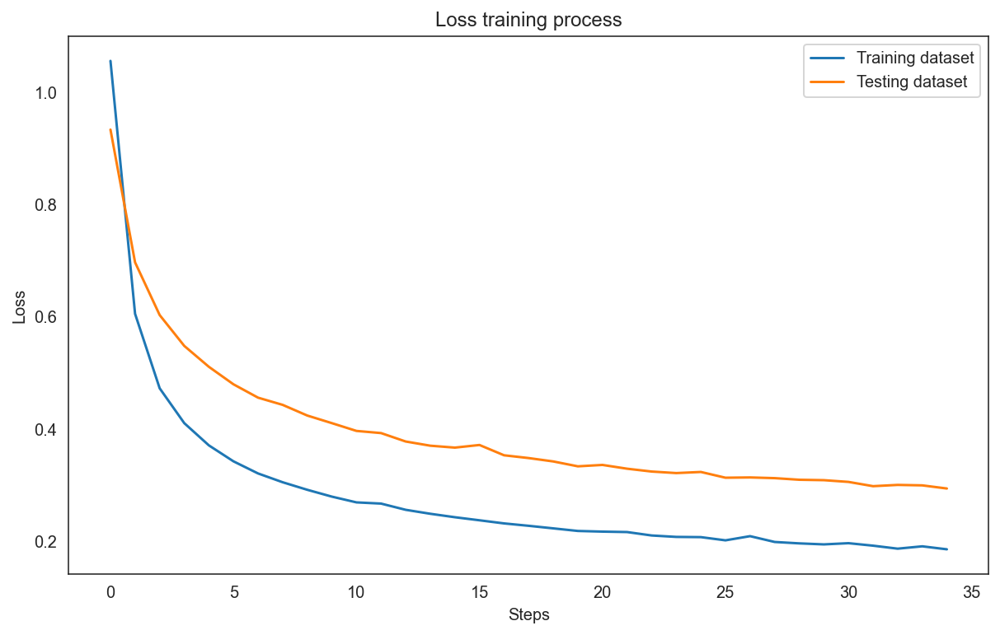

In [52]:
#Model Evaluate (Loss)
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
#plt.grid(color = 'w')
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Loss training process')
plt.ylabel('Loss')
plt.xlabel('Steps')
plt.legend(['Training dataset', 'Testing dataset'], loc = 'upper right')

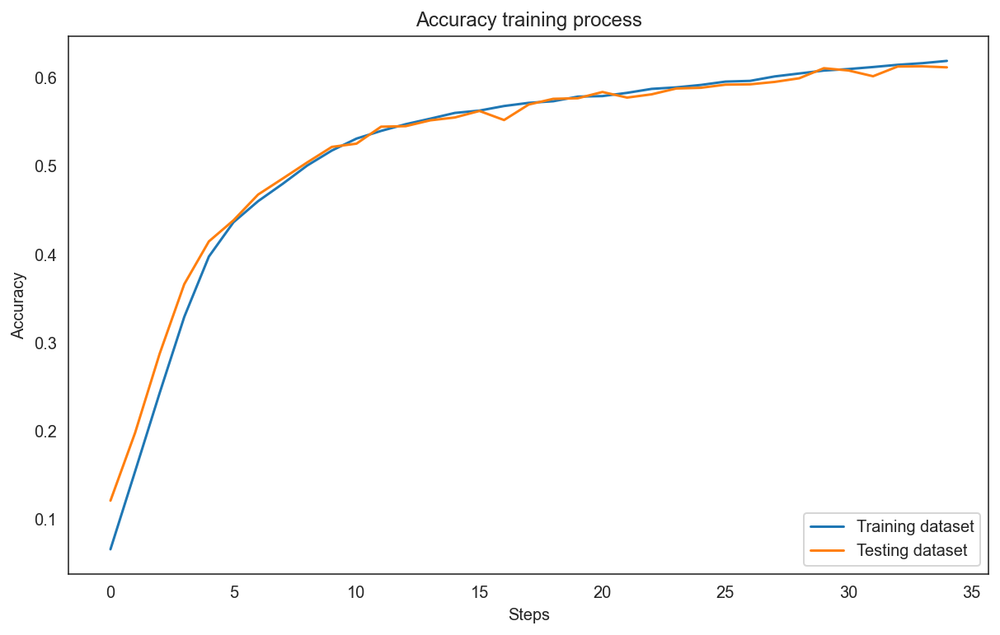

In [53]:
#Model Evaluate (Accuracy)
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
#plt.grid(color = 'w')
plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Accuracy training process')
plt.ylabel('Accuracy')
plt.xlabel('Steps')
plt.legend(['Training dataset', 'Testing dataset'], loc = 'lower right')

In [54]:
#Reconstruction error
predicts = model.predict(X_val_sc)
re_error = ((X_val_sc - predicts) ** 2).mean(axis = 1) # Calculate MSE
re_error = np.stack((y_val, re_error), axis = -1)
print(re_error)

[[0.         0.08050973]
 [0.         0.05718636]
 [0.         0.08077751]
 ...
 [0.         0.25606284]
 [0.         0.09977317]
 [0.         0.05349819]]


In [55]:
mse = pd.DataFrame(re_error[:,1]).rename(columns={0:'MSE'})
mse = mse.reset_index()
mse

,index,MSE
0,0,0.080510
1,1,0.057186
2,2,0.080778
3,3,0.013044
4,4,0.007369
...,...,...
118103,118103,0.104008
118104,118104,0.004849
118105,118105,0.256063
118106,118106,0.099773


In [353]:
### Find the fraud data from outlier (Percentile > 99.9%)

threshold = mse.MSE.quantile(0.999)
threshold

21.75702521014109

In [354]:
mse['isFraud'] = mse['MSE'].apply(lambda x: 'Fraud' if x > threshold else 'NotFraud')
mse['isFraud_num'] = mse['MSE'].apply(lambda x: 1 if x > threshold else 0)
mse

,index,MSE,isFraud,isFraud_num,Answer
0,0,0.080510,NotFraud,0,NotFraud
1,1,0.057186,NotFraud,0,NotFraud
2,2,0.080778,NotFraud,0,NotFraud
3,3,0.013044,NotFraud,0,NotFraud
4,4,0.007369,NotFraud,0,NotFraud
...,...,...,...,...,...
118103,118103,0.104008,NotFraud,0,NotFraud
118104,118104,0.004849,NotFraud,0,NotFraud
118105,118105,0.256063,NotFraud,0,NotFraud
118106,118106,0.099773,NotFraud,0,NotFraud


In [355]:
X_val_cate = X_val[['TransactionAmt','ProductCD_C','ProductCD_H','ProductCD_R',
       'ProductCD_S','ProductCD_W','card4_american express',
       'card4_discover','card4_mastercard','card4_visa',]]

X_val_cate = X_val_cate.reset_index(drop=True).reset_index()
X_val_cate.head()

,index,TransactionAmt,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,card4_american express,card4_discover,card4_mastercard,card4_visa
0,0,15.00,0,0,0,1,0,0,0,0,1
1,1,25.95,0,0,0,0,1,0,0,0,1
2,2,44.00,0,0,0,0,1,0,0,1,0
3,3,88.50,0,0,0,0,1,0,0,1,0
4,4,97.00,0,0,0,0,1,0,0,0,1


In [356]:
mse['Answer'] = y_val.to_frame('isFraud').reset_index(drop=True)
mse['Answer'] = mse['Answer'].apply(lambda x: 'Fraud' if x == 1 else 'NotFraud')
mse

,index,MSE,isFraud,isFraud_num,Answer
0,0,0.080510,NotFraud,0,NotFraud
1,1,0.057186,NotFraud,0,NotFraud
2,2,0.080778,NotFraud,0,NotFraud
3,3,0.013044,NotFraud,0,NotFraud
4,4,0.007369,NotFraud,0,NotFraud
...,...,...,...,...,...
118103,118103,0.104008,NotFraud,0,NotFraud
118104,118104,0.004849,NotFraud,0,NotFraud
118105,118105,0.256063,NotFraud,0,NotFraud
118106,118106,0.099773,NotFraud,0,NotFraud


In [357]:
mse_2 = pd.merge(mse, X_val_cate,on='index')
mse_2

,index,MSE,isFraud,isFraud_num,Answer,TransactionAmt,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,card4_american express,card4_discover,card4_mastercard,card4_visa
0,0,0.080510,NotFraud,0,NotFraud,15.00,0,0,0,1,0,0,0,0,1
1,1,0.057186,NotFraud,0,NotFraud,25.95,0,0,0,0,1,0,0,0,1
2,2,0.080778,NotFraud,0,NotFraud,44.00,0,0,0,0,1,0,0,1,0
3,3,0.013044,NotFraud,0,NotFraud,88.50,0,0,0,0,1,0,0,1,0
4,4,0.007369,NotFraud,0,NotFraud,97.00,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118103,118103,0.104008,NotFraud,0,NotFraud,87.95,0,0,0,0,1,0,0,0,1
118104,118104,0.004849,NotFraud,0,NotFraud,56.95,0,0,0,0,1,0,0,0,1
118105,118105,0.256063,NotFraud,0,NotFraud,107.95,0,0,0,0,1,0,0,1,0
118106,118106,0.099773,NotFraud,0,NotFraud,445.00,0,0,0,0,1,0,0,0,1


In [358]:
### Check %correct from prediction each categorials

mse_2['ProductCD'] = (mse_2.iloc[:, 6:11] == 1).idxmax(1)
mse_2['ProductCD'] = mse_2['ProductCD'].map(lambda x:x[10:])
mse_2['Card4'] = (mse_2.iloc[:, 11:] == 1).idxmax(1)
mse_2['Card4'] = mse_2['Card4'].map(lambda x:x[6:])
mse_2 = mse_2.drop(columns=['ProductCD_C','ProductCD_H','ProductCD_R','ProductCD_S','ProductCD_W','card4_american express','card4_discover','card4_mastercard','card4_visa'])
mse_2['Answer_isFraud_num'] = mse_2['Answer'].map(lambda x: 1 if x =='Fraud' else 0)
mse_2

,index,MSE,isFraud,isFraud_num,Answer,TransactionAmt,ProductCD,Card4,Answer_isFraud_num
0,0,0.080510,NotFraud,0,NotFraud,15.00,S,visa,0
1,1,0.057186,NotFraud,0,NotFraud,25.95,W,visa,0
2,2,0.080778,NotFraud,0,NotFraud,44.00,W,mastercard,0
3,3,0.013044,NotFraud,0,NotFraud,88.50,W,mastercard,0
4,4,0.007369,NotFraud,0,NotFraud,97.00,W,visa,0
...,...,...,...,...,...,...,...,...,...
118103,118103,0.104008,NotFraud,0,NotFraud,87.95,W,visa,0
118104,118104,0.004849,NotFraud,0,NotFraud,56.95,W,visa,0
118105,118105,0.256063,NotFraud,0,NotFraud,107.95,W,mastercard,0
118106,118106,0.099773,NotFraud,0,NotFraud,445.00,W,visa,0


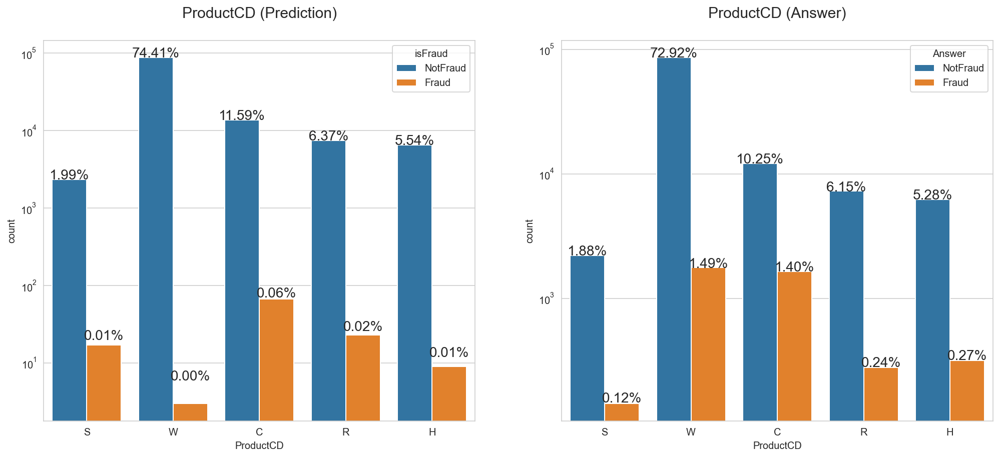

In [359]:
### Plot the comparison between prediction and answer of ProductCD
### Need to adjust threshold before plot graph

sns.set_style('whitegrid')
fig, (p1, p2) = plt.subplots(ncols=2, figsize=(17,7))
total = len(mse_2)
p1 = sns.countplot(x='ProductCD', hue='isFraud', data = mse_2, ax = p1)
for p in p1.patches:
    height = p.get_height()
    p1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14)
p1.set_title('ProductCD (Prediction)\n', fontsize=15)

p2 = sns.countplot(x='ProductCD', hue='Answer', data = mse_2, ax = p2)
for p in p2.patches:
    height = p.get_height()
    p2.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14)
    
p2.set_title('ProductCD (Answer)\n', fontsize=15)
p1.set_yscale('log')
p2.set_yscale('log')

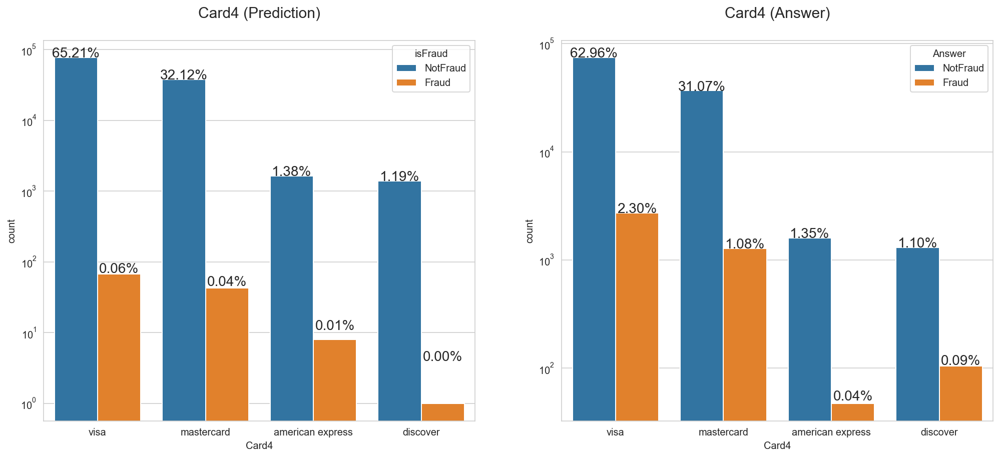

In [360]:
### Plot the comparison between prediction and answer of Card 4
### Need to adjust threshold before plot graph

sns.set_style('whitegrid')
fig, (p1, p2) = plt.subplots(ncols=2, figsize=(17,7))


total = len(mse_2)
p1 = sns.countplot(x='Card4', hue='isFraud', data = mse_2, ax = p1)
for p in p1.patches:
    height = p.get_height()
    p1.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14)
p1.set_title('Card4 (Prediction)\n', fontsize=15)

p2 = sns.countplot(x='Card4', hue='Answer', data = mse_2, ax = p2)
for p in p2.patches:
    height = p.get_height()
    p2.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center",fontsize=14)
    
p2.set_title('Card4 (Answer)\n', fontsize=15)
p1.set_yscale('log')
p2.set_yscale('log')

In [361]:
### Prediction

mse_prod = pd.crosstab(mse_2['ProductCD'], mse_2['isFraud'], normalize = 'index')*100
mse_prod = mse_prod.reset_index()
mse_prod

isFraud,ProductCD,Fraud,NotFraud
0,C,0.486954,99.513046
1,H,0.137384,99.862616
2,R,0.304918,99.695082
3,S,0.719729,99.280271
4,W,0.003413,99.996587


In [362]:
### Answer

mse_prod_ans = pd.crosstab(mse_2['ProductCD'], mse_2['Answer'], normalize = 'index')*100
mse_prod_ans = mse_prod_ans.rename(columns={'NotFraud':'Ans_NoFraud', 'Fraud':'Ans_Fraud'})
mse_prod_ans = mse_prod_ans.reset_index()
mse_prod_ans

Answer,ProductCD,Ans_Fraud,Ans_NoFraud
0,C,11.984883,88.015117
1,H,4.854221,95.145779
2,R,3.685536,96.314464
3,S,6.054191,93.945809
4,W,2.005848,97.994152


In [363]:
### Prediction vs Answer

check_prod = pd.merge(mse_prod, mse_prod_ans, on='ProductCD')
check_prod

,ProductCD,Fraud,NotFraud,Ans_Fraud,Ans_NoFraud
0,C,0.486954,99.513046,11.984883,88.015117
1,H,0.137384,99.862616,4.854221,95.145779
2,R,0.304918,99.695082,3.685536,96.314464
3,S,0.719729,99.280271,6.054191,93.945809
4,W,0.003413,99.996587,2.005848,97.994152


In [158]:
mse['isFraud'].value_counts(normalize=True)*100

NotFraud    99.899245
Fraud        0.100755
Name: isFraud, dtype: float64

Text(0.5, 0, 'False positive')

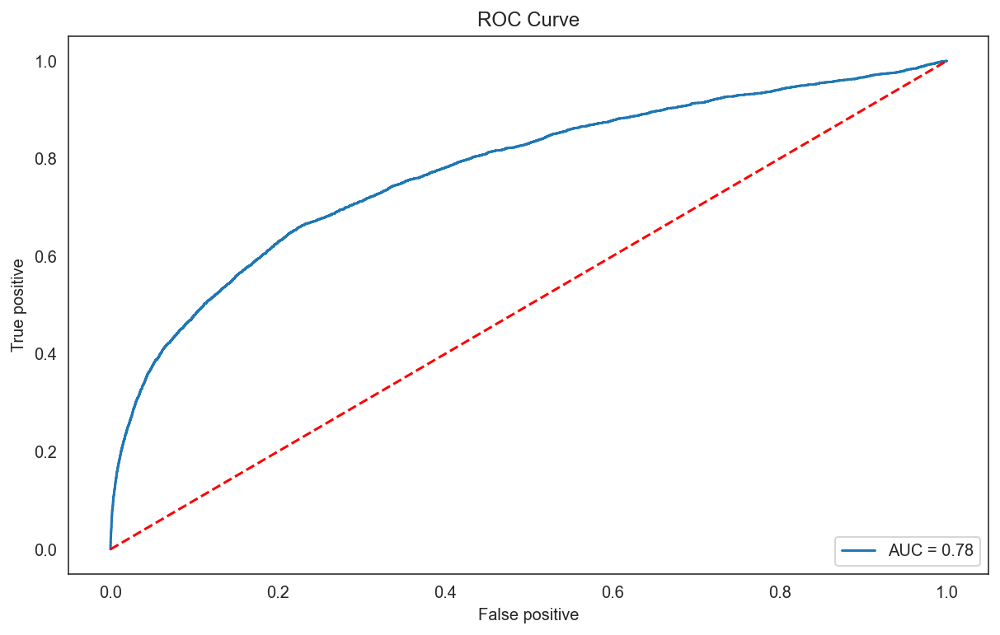

In [159]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(re_error[:,0], re_error[:,1])
roc_auc = auc(fpr, tpr)

#Plotting ROC Curve
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
plt.grid(color = 'w')
plt.plot(fpr, tpr, label = 'AUC = %0.2f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.title('ROC Curve')
plt.ylabel('True positive')
plt.xlabel('False positive')

In [ ]:
plt.figure(figsize=(6,5))
d1 = sns.countplot(x='DeviceType',data = device1, hue='isFraud', color = '#ee7106')
#plt.yscale("log")
plt.ylabel('Count')
d2 = d1.twinx()
d2 = sns.pointplot(x='DeviceType', y ='Fraud',data = device11, color = '#33374d', order=['mobile','desktop'])
plt.title('Device type\n',fontsize=16)
plt.xlabel('DeviceType')
plt.ylabel('Ratio of Fraud (%)')

Text(0.5, 17.800000000000004, 'Prediction')

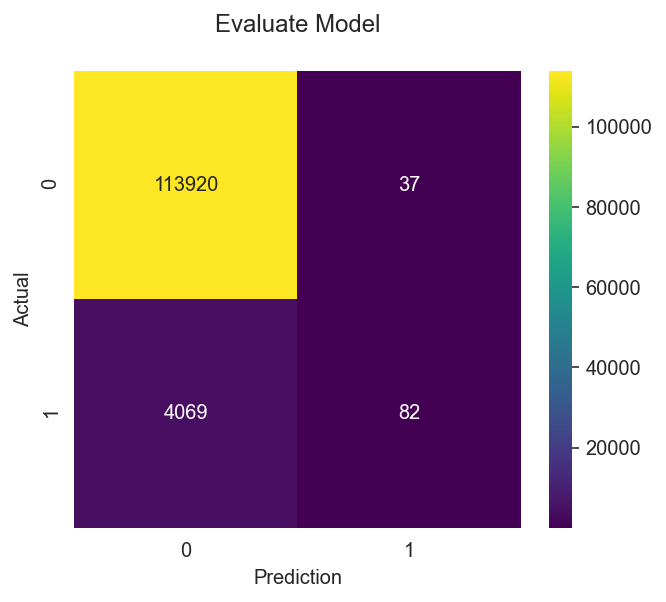

In [160]:
#Confusion matrix

thres = np.round(threshold,2)
y_predict = [1 if e > thres else 0 for e in re_error[:,1]]
matrix = confusion_matrix(re_error[:,0], y_predict)

#Plotting confusion matrix
plt.figure(figsize = (5, 4.2))
sns.heatmap(matrix, annot = True, fmt = 'd', cmap = plt.cm.viridis);
plt.title("Evaluate Model\n")
plt.ylabel('Actual')
plt.xlabel('Prediction')

In [161]:
print(classification_report(y_val, y_predict))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98    113957
           1       0.69      0.02      0.04      4151

    accuracy                           0.97    118108
   macro avg       0.83      0.51      0.51    118108
weighted avg       0.96      0.97      0.95    118108



In [162]:
tn, fp, fn, tp = matrix.ravel()
print('Correctly Predict that Wnv is Positive (TP):',tp)
print('Correctly Predict that Wnv is Negative (TN):',tn)
print('Incorrectly Predict that Wnv is Positive (FP):',fp)
print('Incorrectly Predict that Wnv is Negative (FN):',fn)

Correctly Predict that Wnv is Positive (TP): 82
Correctly Predict that Wnv is Negative (TN): 113920
Incorrectly Predict that Wnv is Positive (FP): 37
Incorrectly Predict that Wnv is Negative (FN): 4069


In [163]:
print('Accuracy: {}'.format(round((tp+tn)/(tp+fp+tn+fn),4)))
print('Misclassification rate: {}'.format(round((fp+fn)/(tp+fp+tn+fn),4)))
print('Precision: {}'.format(round(tp/(tp+fp),4)))
print('Recall: {}'.format(round(tp/(tp+fn),4)))
print('Specificity: {}'.format(round(tn/(tn+fp),4)))

Accuracy: 0.9652
Misclassification rate: 0.0348
Precision: 0.6891
Recall: 0.0198
Specificity: 0.9997


Text(0.5, 0, 'Observation')

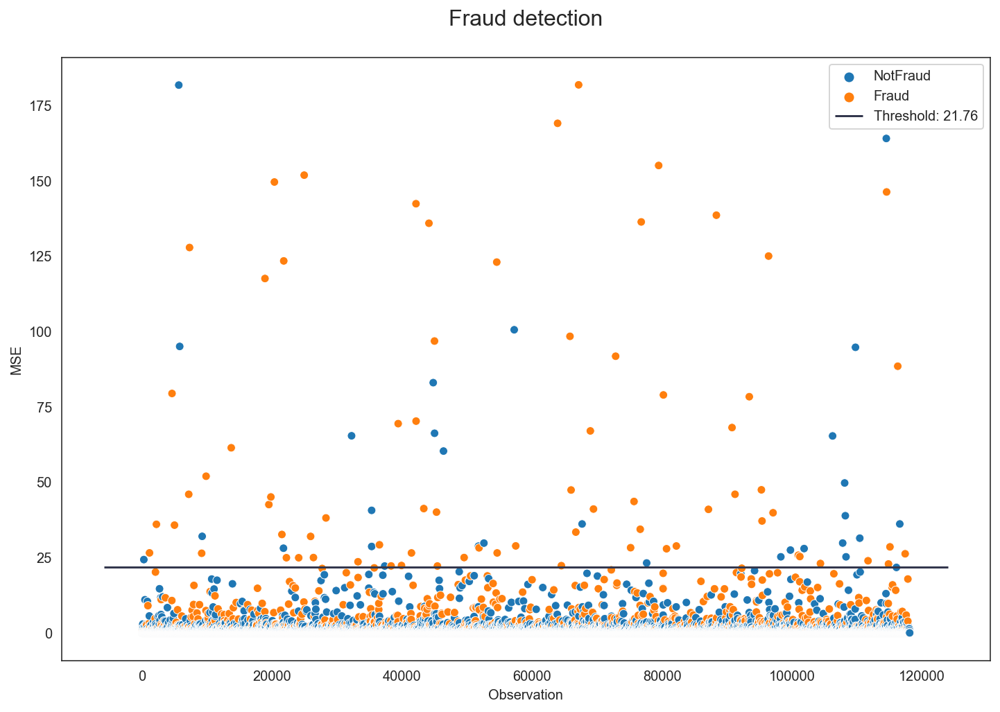

In [164]:
#Prediction
plt.figure(figsize = (12,8))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
#plt.grid(color = 'w')
#plt.plot(re_error[:,1], marker = 'o', ms = 4, c = '#ee7106', linestyle = 'None')
sns.scatterplot(x = mse['index'], y = mse[mse['MSE'] < 200]['MSE'], data = mse, color = '#ee7106', hue='Answer')
ax.hlines(thres, ax.get_xlim()[0], ax.get_xlim()[1], colors = '#33374d', zorder = 100, label = f'Threshold: {thres}')
ax.legend()
plt.title("Fraud detection\n",fontsize=16)
plt.ylabel('MSE')
plt.xlabel('Observation')

In [165]:
### Evaluate model with different threshold

acc = []
miscl = []
prec = []
rec = []
spec = []
thre = []

for i in list(range(800,999,1)):
    threshold = mse.MSE.quantile(i/1000)
    thres = np.round(threshold,2)
    
    y_predict = [1 if e > thres else 0 for e in re_error[:,1]]
    matrix = confusion_matrix(re_error[:,0], y_predict)
    tn, fp, fn, tp = matrix.ravel()
    
    acc.append(round((tp+tn)/(tp+fp+tn+fn),4)*100)
    miscl.append(round((fp+fn)/(tp+fp+tn+fn),4)*100)
    prec.append(round(tp/(tp+fp),4)*100)
    rec.append(round(tp/(tp+fn),4)*100)
    spec.append(round(tn/(tn+fp),4)*100)
    thre.append(i/10)
    
acc_df = pd.DataFrame(acc)
miscl_df = pd.DataFrame(miscl)
prec_df = pd.DataFrame(prec)
rec_df = pd.DataFrame(rec)
spec_df = pd.DataFrame(spec)

In [166]:
# Accuracy
acc_df['thres'] = thre
acc_df.rename(columns={0:'acc'}, inplace = True)

# Misclassification
miscl_df['thres'] = thre
miscl_df.rename(columns={0:'miscl'}, inplace = True)

# Precision
prec_df['thres'] = thre
prec_df.rename(columns={0:'prec'}, inplace = True)

# Recall
rec_df['thres'] = thre
rec_df.rename(columns={0:'rec'}, inplace = True)

# Specificity
spec_df['thres'] = thre
spec_df.rename(columns={0:'spec'}, inplace = True)

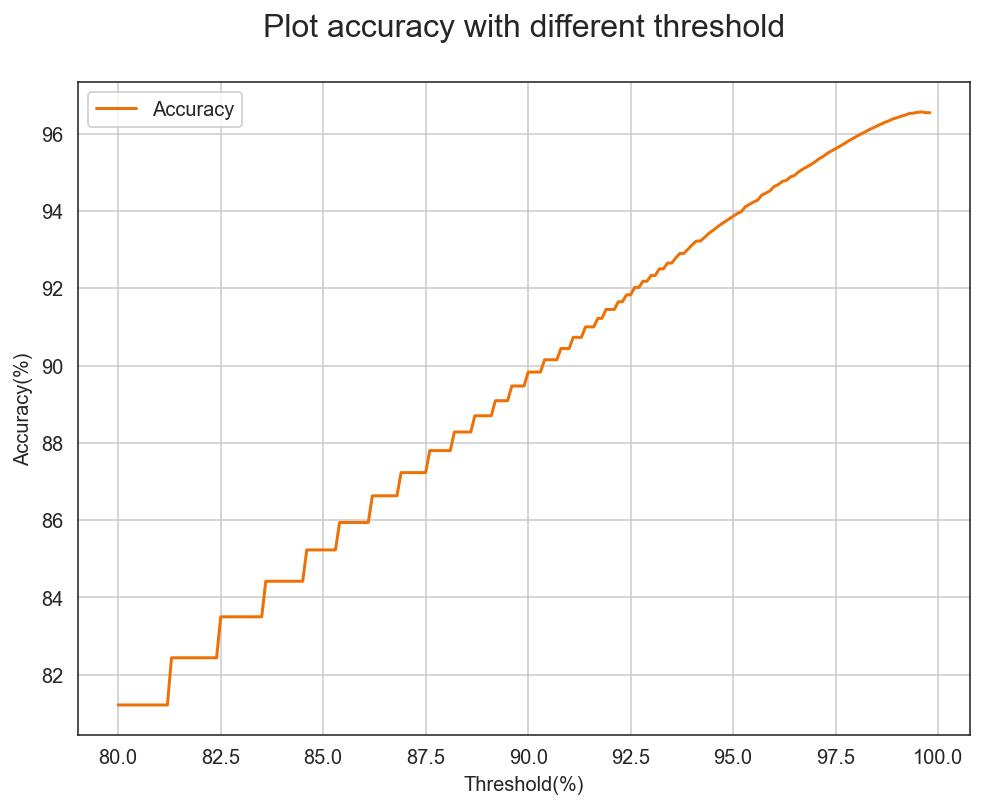

In [167]:
### Plot accuracy with different threshold

plt.figure(figsize=(8,6))
plt.plot(thre, acc, label = 'Accuracy', color = '#ee7106')
plt.title('Plot accuracy with different threshold\n', fontsize=16)
plt.xlabel('Threshold(%)')
plt.ylabel('Accuracy(%)')
plt.grid()
plt.legend()

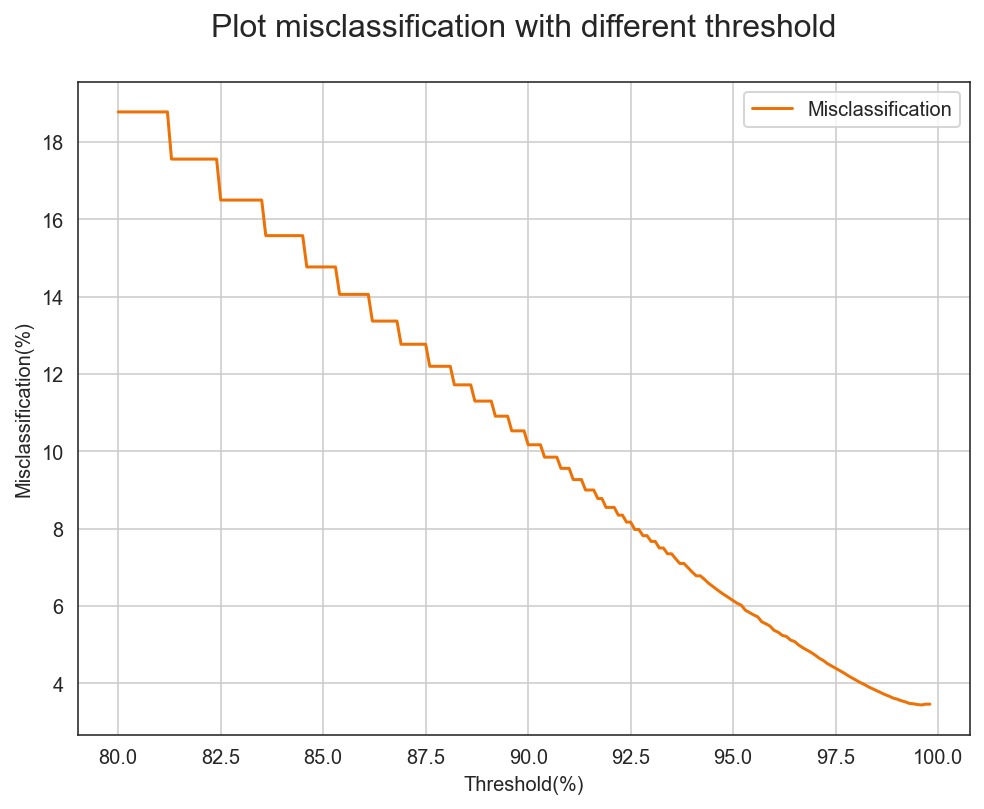

In [168]:
### Plot misclassification with different threshold

plt.figure(figsize=(8,6))
plt.plot(thre, miscl, label = 'Misclassification', color = '#ee7106')
plt.title('Plot misclassification with different threshold\n', fontsize=16)
plt.xlabel('Threshold(%)')
plt.ylabel('Misclassification(%)')
plt.grid()
plt.legend()

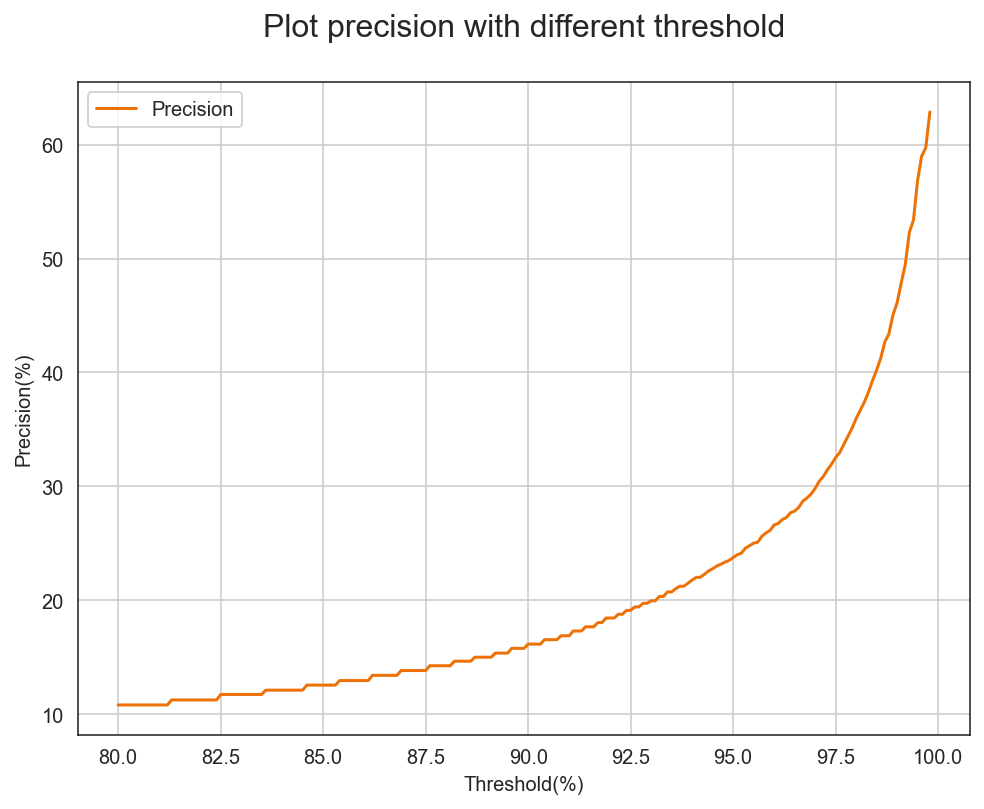

In [169]:
### Plot precision with different threshold

plt.figure(figsize=(8,6))
plt.plot(thre, prec, label = 'Precision', color = '#ee7106')
plt.title('Plot precision with different threshold\n', fontsize=16)
plt.xlabel('Threshold(%)')
plt.ylabel('Precision(%)')
plt.grid()
plt.legend()

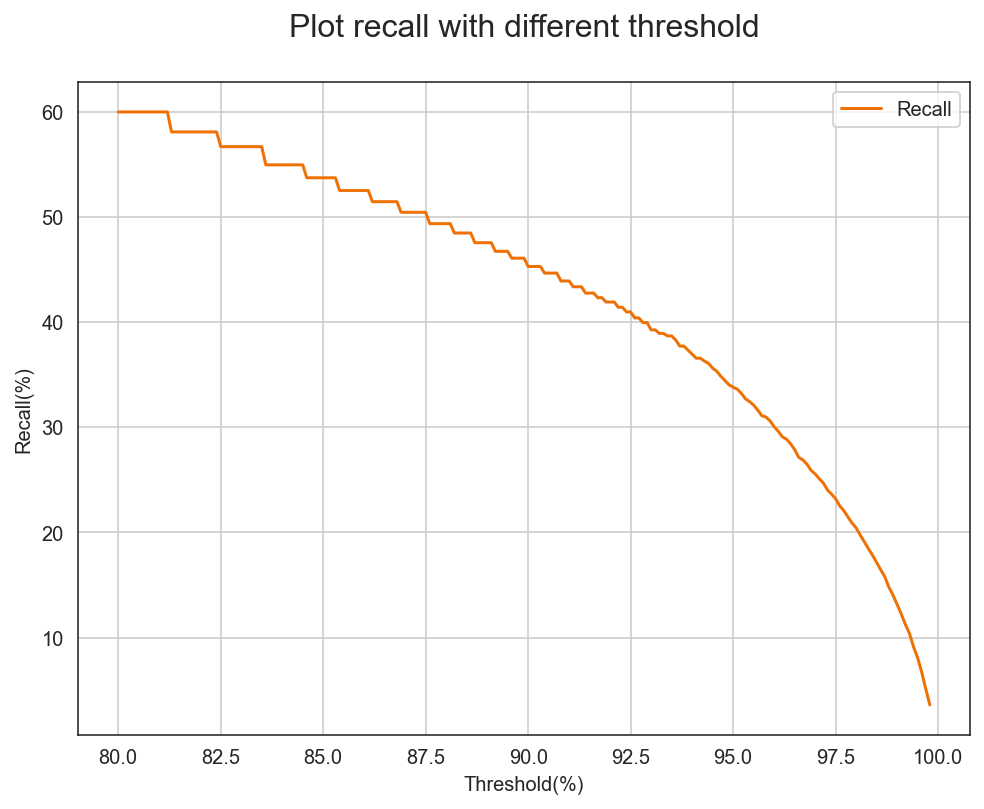

In [170]:
### Plot recall with different threshold

plt.figure(figsize=(8,6))
plt.plot(thre, rec, label = 'Recall', color = '#ee7106')
plt.title('Plot recall with different threshold\n', fontsize=16)
plt.xlabel('Threshold(%)')
plt.ylabel('Recall(%)')
plt.grid()
plt.legend()

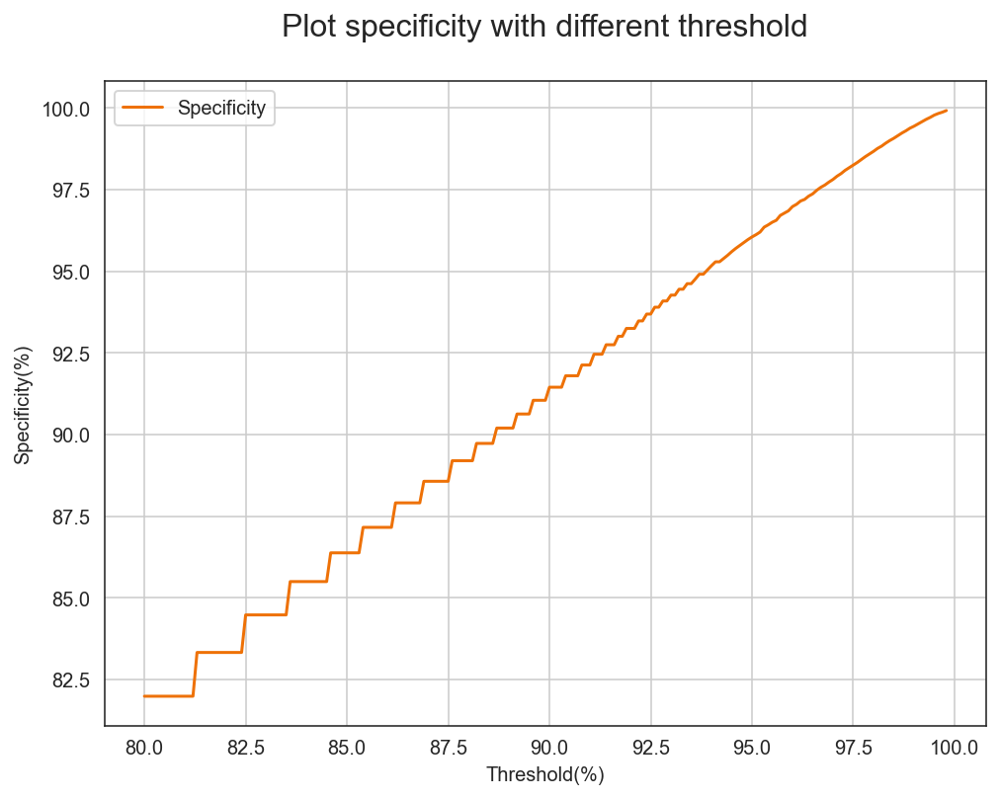

In [171]:
### Plot specificity with different threshold

plt.figure(figsize=(8,6))
plt.plot(thre, spec, label = 'Specificity', color = '#ee7106')
plt.title('Plot specificity with different threshold\n', fontsize=16)
plt.xlabel('Threshold(%)')
plt.ylabel('Specificity(%)')
plt.grid()
plt.legend()

# Prediction with Test Set

In [22]:
X_train = train_new.drop(columns= ['isFraud'])
y_train = train_new['isFraud']

In [23]:
X_test = test_new

In [24]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)

(590540, 417)
(590540,)
(506691, 417)


In [25]:
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train)
X_test_sc = ss.transform(X_test)

In [26]:
y_train.value_counts()

0    569877
1     20663
Name: isFraud, dtype: int64

In [27]:
sm = SMOTE()

Xsm_train, ysm_train = sm.fit_resample(X_train_sc, y_train)

In [28]:
ysm_train.value_counts()

0    569877
1    569877
Name: isFraud, dtype: int64

In [29]:
print(Xsm_train.shape)
print(ysm_train.shape)
print(X_test_sc.shape)

(1139754, 417)
(1139754,)
(506691, 417)


In [30]:
### PCA

columns_pca = [i for i in X_train.columns][5:]

In [37]:
columns_pca

['addr1',
 'addr2',
 'dist1',
 'dist2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67',
 'V68',
 'V69',
 'V70',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V81',
 'V82',
 'V83',
 'V84',
 'V85',
 'V86',
 'V87',
 'V88',
 'V89',
 'V90',
 'V91',
 'V92',
 'V93',
 'V94',
 'V

In [38]:
X_train_pca1 = pd.DataFrame(Xsm_train, columns=X_train.columns)
X_test_pca1 = pd.DataFrame(X_test_sc, columns=X_train.columns)

In [39]:
X_train_pca1

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,-0.278167,0.821695,-0.261218,-0.281425,-1.396380,0.243321,0.069833,-0.118444,-0.099221,-0.098020,...,-0.686646,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
1,-0.443327,-1.457558,0.268534,-0.281425,-2.368254,0.347543,0.069833,-0.196550,-0.099221,-0.098020,...,1.456354,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
2,-0.317889,-1.068263,0.817433,-0.281425,-0.813255,0.399654,0.069833,0.983253,-0.099221,-0.098020,...,-0.686646,0.727004,-1.099924,2.988123,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
3,-0.355521,1.679858,1.308889,-0.281425,-2.003802,1.921291,0.069833,-0.196550,-0.099221,-0.090533,...,1.456354,-1.375509,-1.099924,-0.334658,-0.267954,2.176802,-0.258532,-0.224307,0.322536,-0.322536
4,-0.355521,-1.102133,0.970614,-0.281425,-2.368254,1.337649,0.069833,-0.196550,-0.099221,-0.098020,...,1.456354,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,-3.100425,3.100425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1139749,-0.317889,-1.183629,0.294899,-0.281425,-2.207141,1.551983,0.069833,-0.177113,-0.099221,-0.098020,...,1.456354,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
1139750,-0.091483,0.680587,0.657785,-0.281425,0.644557,-0.185373,0.069833,-0.196550,-0.099221,-0.098020,...,-0.686646,0.727004,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,-3.100425,3.100425
1139751,0.423831,0.397244,1.325070,-0.281425,0.644557,0.926976,0.069833,-0.196550,-0.099221,-0.071187,...,-0.686646,0.727004,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,-2.388614,2.388614
1139752,-0.408098,0.050756,-1.180571,-0.281425,-0.870829,-0.286758,0.069833,-0.196550,-0.099221,-0.098020,...,0.391241,-0.330520,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536


In [40]:
X_test_pca1

,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,...,card4_mastercard,card4_visa,P_emaildomain_Google,P_emaildomain_Microsoft,P_emaildomain_Others,P_emaildomain_Yahoo,P_emaildomain_anonymous.com,P_emaildomain_aol.com,DeviceType_desktop,DeviceType_mobile
0,-0.430993,0.104111,-1.601553,-0.281425,0.644557,-1.267894,0.069833,-0.192439,-0.147699,-0.060586,...,-0.686646,0.727004,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
1,-0.359702,-1.148040,-1.601553,-0.281425,0.644557,0.076566,0.069833,-0.180106,-0.147699,-0.083047,...,-0.686646,0.727004,-1.099924,-0.334658,-0.267954,-0.459389,-0.258532,4.458167,0.322536,-0.322536
2,0.150412,-1.106417,1.353567,-0.281425,0.644557,1.879602,0.069833,10.635438,-0.147699,-0.090533,...,-0.686646,0.727004,-1.099924,2.988123,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
3,0.626866,0.222450,-0.012298,-0.281425,-0.813255,-0.903118,0.069833,-0.126666,-0.147699,-0.068073,...,-0.686646,0.727004,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
4,-0.280467,1.656599,0.574896,-0.281425,-2.003802,-0.288210,0.069833,-0.171885,-0.147699,-0.060586,...,1.456354,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,-0.168706,0.802516,0.083440,2.809740,0.595963,-0.079766,-10.571409,-0.196550,-0.147699,-0.098020,...,1.456354,-1.375509,0.909154,-0.334658,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
506687,-0.513685,-1.376149,0.294064,2.809740,0.595963,0.076566,0.069833,-0.196550,0.939600,-0.098020,...,1.456354,-1.375509,-1.099924,2.988123,-0.267954,-0.459389,-0.258532,-0.224307,-3.100425,3.100425
506688,-0.359702,1.379726,0.817433,-0.281425,0.644557,0.368387,0.069833,-0.196550,-0.147699,-0.098020,...,-0.686646,0.727004,-1.099924,2.988123,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536
506689,0.280031,1.371565,0.983379,-0.281425,0.595963,-1.194939,0.069833,-0.196550,-0.147699,-0.098020,...,1.456354,-1.375509,-1.099924,2.988123,-0.267954,-0.459389,-0.258532,-0.224307,0.322536,-0.322536


In [49]:
X_train_pca = X_train_pca1[columns_pca]
X_test_pca = X_test_pca1[columns_pca]

In [50]:
print(X_train_pca.shape)
print(X_test_pca.shape)

(1139754, 412)
(506691, 412)


In [45]:
### From Cumulative Explained Varience = 95% --> n_components = 100

pca_test = PCA(n_components=100,random_state=1)
X_train_pca2 = pca_test.fit_transform(X_train_pca)
X_test_pca2 = pca_test.transform(X_test_pca)

In [51]:
column_pca = ['pca'+str(i) for i in range(1,101)]

X_train_pca2 = pd.DataFrame(X_train_pca2, columns = column_pca)
X_test_pca2 = pd.DataFrame(X_test_pca2, columns = column_pca)

X_train_pca2.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100
0,-5.168149,1.947495,-2.173144,2.035411,-0.862588,0.106714,-0.116062,-0.036887,-0.432237,0.380586,...,-0.259097,-0.251717,0.259177,-0.565674,-0.418899,-0.566498,-0.455492,0.497229,-0.103680,0.423191
1,-4.663237,1.242848,-1.563226,1.048525,-1.010458,0.079683,-0.240870,0.319001,-1.078011,0.241411,...,-0.096594,0.088386,0.146100,0.026566,0.038082,0.085958,-0.026409,0.192850,-0.078191,0.021684
2,-5.049395,1.805481,-2.108706,1.894329,-0.988183,0.017870,-0.132284,0.096232,-0.614116,0.094826,...,-0.477714,0.159454,-0.595245,0.062089,-0.184506,-0.318370,-0.542446,1.227641,-0.057506,-0.008664
3,-5.265086,1.906415,-2.345718,2.294848,1.240508,0.029046,-0.211739,-0.185126,-0.810030,-0.512200,...,-0.170852,-0.555837,0.584910,0.217534,1.114951,0.641829,1.329617,-0.317038,-0.761889,0.118480
4,-6.462964,-4.402288,-4.188535,2.675455,1.779489,3.061857,2.817031,3.498390,3.053316,3.505191,...,-1.156449,0.089620,-0.555090,0.222423,1.072130,-0.602623,1.576413,0.827148,-0.042359,0.531667


In [52]:
print(X_train_pca2.shape)
print(X_test_pca2.shape)

(1139754, 100)
(506691, 100)


In [53]:
X_train_pca11 = X_train_pca1.drop(columns = columns_pca)
X_test_pca11 = X_test_pca1.reset_index(drop=True).drop(columns = columns_pca)

In [54]:
X_train_pca2 = pd.concat([X_train_pca11, X_train_pca2],axis=1)
X_test_pca2 = pd.concat([X_test_pca11, X_test_pca2],axis=1)

In [55]:
X_test_pca2

,TransactionAmt,card1,card2,card3,card5,pca1,pca2,pca3,pca4,pca5,...,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100
0,-0.430993,0.104111,-1.601553,-0.281425,0.644557,-5.258015,1.742747,-2.229656,2.154109,-1.064997,...,-0.184639,5.041647,-3.304960,-1.572514,1.650325,-1.555951,-0.009794,0.126153,-1.178190,1.506913
1,-0.359702,-1.148040,-1.601553,-0.281425,0.644557,-5.149159,1.766042,-2.070023,1.954230,-0.594436,...,0.023796,5.384592,-2.466678,-0.557427,1.099874,-1.589131,-0.215971,1.209689,-1.667530,1.356711
2,0.150412,-1.106417,1.353567,-0.281425,0.644557,-4.491849,1.208527,-1.066673,2.783242,-0.292302,...,-1.384591,5.163826,-3.466018,-0.928069,1.161341,-2.028842,0.519424,2.760863,-1.433349,0.482192
3,0.626866,0.222450,-0.012298,-0.281425,-0.813255,-3.852367,1.128128,-3.382587,2.620822,-1.104797,...,0.132065,4.661001,-2.697843,-1.334296,1.841393,-1.132916,0.172516,1.362341,-1.729792,1.399257
4,-0.280467,1.656599,0.574896,-0.281425,-2.003802,-5.394759,2.008922,-2.401855,2.328331,-0.343953,...,0.282346,5.346876,-3.577137,-1.560413,1.081967,-1.039569,0.677469,0.937078,-1.210657,1.504932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,-0.168706,0.802516,0.083440,2.809740,0.595963,-1.283229,-2.818773,2.801801,-5.210977,-1.217639,...,1.242086,4.961481,-3.282149,-2.734812,2.142752,-1.903973,2.153575,0.156681,-2.473738,2.223976
506687,-0.513685,-1.376149,0.294064,2.809740,0.595963,2.689059,-7.106408,6.743196,-10.923120,-0.552502,...,0.548126,5.088209,-4.384699,-1.031747,1.698857,-1.100618,1.091858,2.266995,-1.720704,1.245123
506688,-0.359702,1.379726,0.817433,-0.281425,0.644557,-4.939247,1.747539,-1.838904,1.639575,-0.922105,...,-0.195973,5.106439,-3.563677,-1.123033,1.478658,-1.846026,-0.455187,1.609115,-1.552465,1.856344
506689,0.280031,1.371565,0.983379,-0.281425,0.595963,-4.929228,1.733345,-1.826593,1.625323,-0.892912,...,-0.300630,5.168919,-3.615653,-1.156529,1.509170,-1.940033,-0.474714,1.409719,-1.362911,1.781941


In [56]:
print(X_train_pca2.shape)
print(X_test_pca2.shape)

(1139754, 105)
(506691, 105)


In [57]:
Xsm_train = X_train_pca2
X_test_sc = X_test_pca2

## Decision Tree

In [71]:
tree2 = DecisionTreeClassifier(random_state=101)
tree2.fit(Xsm_train, ysm_train)

DecisionTreeClassifier(random_state=101)

In [89]:
pred_proba_tree2 = tree2.predict_proba(X_test_sc)
pred_proba_tree2[:20]

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [78]:
pred_tree2 = tree2.predict(X_test_sc)

In [90]:
pred_proba_tree2 = pd.DataFrame(pred_proba_tree2).reset_index().rename(columns={'index':'TransactionID',0:'NoFraud',1:'isFraud'})
pred_proba_tree2['TransactionID'] = test['TransactionID']
pred_proba_tree2 = pred_proba_tree2.drop(columns=['NoFraud'])

In [91]:
pred_proba_tree2.head(10)

,TransactionID,isFraud
0,3663549,0.0
1,3663550,0.0
2,3663551,0.0
3,3663552,0.0
4,3663553,0.0
5,3663554,0.0
6,3663555,0.0
7,3663556,0.0
8,3663557,0.0
9,3663558,0.0


In [86]:
tree2.score(Xsm_train, ysm_train)

0.9999578856490084

In [ ]:
#tree2.score(X_test_sc, y_test)

In [92]:
pred_proba_tree2.to_csv('fraud_tree_1.csv',index=False)

## Random Forest

In [58]:
clf2 = RandomForestClassifier(n_estimators=200,min_samples_split=11,min_samples_leaf=7, max_features=2,max_depth= 90,random_state=101)
clf2.fit(Xsm_train, ysm_train)

RandomForestClassifier(max_depth=90, max_features=2, min_samples_leaf=7,
                       min_samples_split=11, n_estimators=200,
                       random_state=101)

In [59]:
pred_proba_clf2 = clf2.predict_proba(X_test_sc)
pred_proba_clf2[:20]

array([[0.67692426, 0.32307574],
       [0.71876833, 0.28123167],
       [0.70170767, 0.29829233],
       [0.60335998, 0.39664002],
       [0.6115664 , 0.3884336 ],
       [0.687088  , 0.312912  ],
       [0.64696093, 0.35303907],
       [0.57910684, 0.42089316],
       [0.71143106, 0.28856894],
       [0.61738675, 0.38261325],
       [0.58743289, 0.41256711],
       [0.62174817, 0.37825183],
       [0.58864887, 0.41135113],
       [0.58765069, 0.41234931],
       [0.61845291, 0.38154709],
       [0.56391172, 0.43608828],
       [0.7174734 , 0.2825266 ],
       [0.67974571, 0.32025429],
       [0.6351696 , 0.3648304 ],
       [0.61075808, 0.38924192]])

In [60]:
pred_clf2 = clf2.predict(X_test_sc)

In [61]:
pred_proba_clf2 = pd.DataFrame(pred_proba_clf2).reset_index().rename(columns={'index':'TransactionID',0:'NoFraud',1:'isFraud'})
pred_proba_clf2['TransactionID'] = test['TransactionID']
pred_proba_clf2 = pred_proba_clf2.drop(columns=['NoFraud'])

In [62]:
pred_proba_clf2.head(10)

,TransactionID,isFraud
0,3663549,0.323076
1,3663550,0.281232
2,3663551,0.298292
3,3663552,0.396640
4,3663553,0.388434
5,3663554,0.312912
6,3663555,0.353039
7,3663556,0.420893
8,3663557,0.288569
9,3663558,0.382613


In [64]:
clf2.score(Xsm_train, ysm_train)

0.9902926420964524

In [ ]:
#clf2.score(X_test_sc, y_test)

In [65]:
pred_proba_clf2.to_csv('fraud_clf_2.csv',index=False)

## Gradient Boosting

In [66]:
gb2 = GradientBoostingClassifier(n_estimators=50, random_state=101)
gb2.fit(Xsm_train, ysm_train)

GradientBoostingClassifier(n_estimators=200, random_state=101)

In [67]:
pred_proba_gb2 = gb2.predict_proba(X_test_sc)
pred_proba_gb2[:20]

array([[0.88524548, 0.11475452],
       [0.81531799, 0.18468201],
       [0.42306089, 0.57693911],
       [0.60063652, 0.39936348],
       [0.55091564, 0.44908436],
       [0.75923854, 0.24076146],
       [0.37177778, 0.62822222],
       [0.39071113, 0.60928887],
       [0.9399335 , 0.0600665 ],
       [0.66807204, 0.33192796],
       [0.66725129, 0.33274871],
       [0.67083198, 0.32916802],
       [0.70475854, 0.29524146],
       [0.78995154, 0.21004846],
       [0.76884756, 0.23115244],
       [0.81737012, 0.18262988],
       [0.79082853, 0.20917147],
       [0.82447019, 0.17552981],
       [0.70452922, 0.29547078],
       [0.4612407 , 0.5387593 ]])

In [68]:
pred_gb2 = gb2.predict(X_test_sc)

In [69]:
pred_proba_gb2 = pd.DataFrame(pred_proba_gb2).reset_index().rename(columns={'index':'TransactionID',0:'NoFraud',1:'isFraud'})
pred_proba_gb2['TransactionID'] = test['TransactionID']
pred_proba_gb2 = pred_proba_gb2.drop(columns=['NoFraud'])

In [70]:
pred_proba_gb2.head(10)

,TransactionID,isFraud
0,3663549,0.114755
1,3663550,0.184682
2,3663551,0.576939
3,3663552,0.399363
4,3663553,0.449084
5,3663554,0.240761
6,3663555,0.628222
7,3663556,0.609289
8,3663557,0.060067
9,3663558,0.331928


In [71]:
gb2.score(Xsm_train, ysm_train)

0.8464598501080057

In [ ]:
#gb2.score(X_test_sc, y_test)

In [72]:
pred_proba_gb2.to_csv('fraud_gb_2.csv',index=False)

## AutoEncoder

In [23]:
#Split data for training and testing
#Filtering only "Not Fraud" data into the model
#Need not to SMOTE for imbalance data

X_train = train_new[train_new['isFraud'] == 0]
X_train = X_train.drop(['isFraud'], axis = 1)
X_test = test_new
#y_test = test_new['isFraud']

In [24]:
print(X_train.shape)
#print(y_train.shape)
print(X_test.shape)

(569877, 417)
(506691, 417)


In [25]:
ss = StandardScaler()
X_train_sc = ss.fit_transform(X_train)
X_test_sc = ss.transform(X_test)

In [39]:
print(X_train_sc.shape)
#print(y_train.shape)
print(X_test_sc.shape)

(455920, 417)
(506691, 417)


In [103]:
#Autoencoder model
lr_rate = 0.01
epoch = 35
batch_size = 8000
early_stop = EarlyStopping(monitor='loss', min_delta=0, patience = 5, mode='auto')
#adam = Adam(lr=lr_rate, decay=(lr_rate/epoch))

def autoencoder_model(x):
    input_layer = Input(shape = (x.shape[1], ))
    encoder = Dense(x.shape[1] // 2, activation = 'tanh',use_bias = True, activity_regularizer = regularizers.l2(lr_rate))(input_layer)
    #encoder = Dropout(0.05)(encoder)
    encoder = Dense(x.shape[1] // 4, activation = 'relu')(encoder)
    decoder = Dense(x.shape[1] // 4, activation = 'relu')(encoder)
    #decoder = Dropout(0.05)(decoder)
    decoder = Dense(x.shape[1] // 2, activation = 'tanh')(decoder)
    output_layer = Dense(x.shape[1], activation = 'linear', use_bias = True)(decoder)
    model = Model(inputs = input_layer, outputs = output_layer)
    return model

In [104]:
#Model compile (train)
model_train = autoencoder_model(X_train_sc)
model_train.compile(metrics = ['accuracy'], loss = 'mean_squared_error', optimizer = 'adam')
model_train.summary()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 417)]             0         
_________________________________________________________________
dense_50 (Dense)             (None, 208)               86944     
_________________________________________________________________
dropout (Dropout)            (None, 208)               0         
_________________________________________________________________
dense_51 (Dense)             (None, 104)               21736     
_________________________________________________________________
dense_52 (Dense)             (None, 104)               10920     
_________________________________________________________________
dropout_1 (Dropout)          (None, 104)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 208)               218

In [105]:
#Training model
history_train = model_train.fit(X_train_sc, X_train_sc, epochs = epoch,
                    batch_size = batch_size, shuffle = True,
                    validation_data = (X_val_sc, X_val_sc),
                    verbose = 1).history

Epoch 1/35
57/57 [==============================] - 7s 110ms/step - loss: 1.2564 - accuracy: 0.0330 - val_loss: 0.9429 - val_accuracy: 0.1126
Epoch 2/35
57/57 [==============================] - 6s 103ms/step - loss: 0.6686 - accuracy: 0.1025 - val_loss: 0.7109 - val_accuracy: 0.1428
Epoch 3/35
57/57 [==============================] - 6s 102ms/step - loss: 0.5112 - accuracy: 0.1592 - val_loss: 0.6183 - val_accuracy: 0.2181
Epoch 4/35
57/57 [==============================] - 6s 106ms/step - loss: 0.4442 - accuracy: 0.2263 - val_loss: 0.5648 - val_accuracy: 0.2661
Epoch 5/35
57/57 [==============================] - 6s 102ms/step - loss: 0.4323 - accuracy: 0.2776 - val_loss: 0.5228 - val_accuracy: 0.3230
Epoch 6/35
57/57 [==============================] - 6s 103ms/step - loss: 0.4006 - accuracy: 0.3233 - val_loss: 0.4953 - val_accuracy: 0.3545
Epoch 7/35
57/57 [==============================] - 6s 102ms/step - loss: 0.3677 - accuracy: 0.3502 - val_loss: 0.4735 - val_accuracy: 0.3765
Epoch 

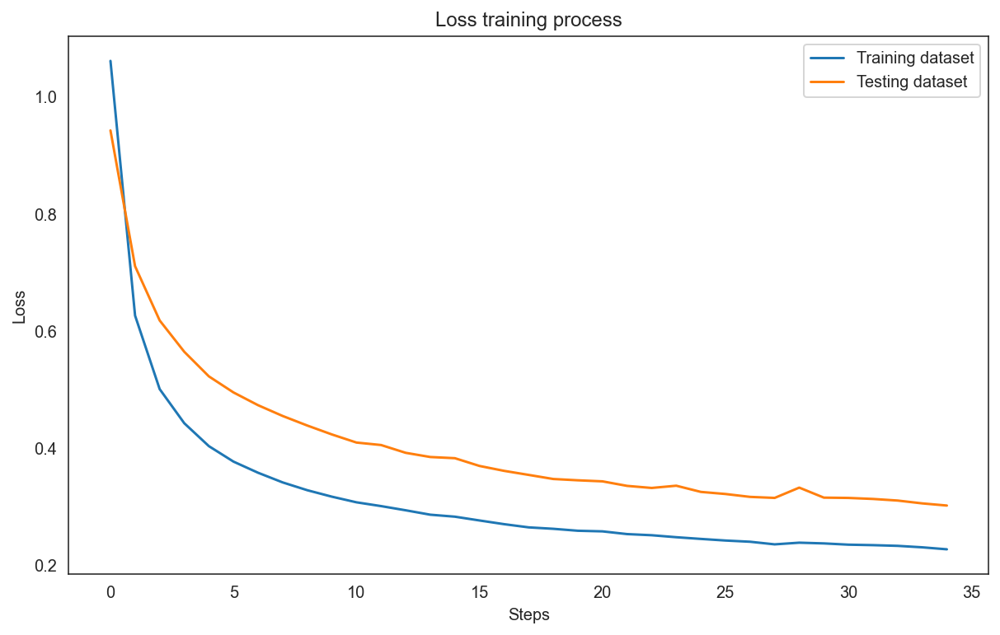

In [106]:
#Model Evaluate (Loss)
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
#plt.grid(color = 'w')
plt.plot(history_train['loss'])
plt.plot(history_train['val_loss'])
plt.title('Loss training process')
plt.ylabel('Loss')
plt.xlabel('Steps')
plt.legend(['Training dataset', 'Testing dataset'], loc = 'upper right')

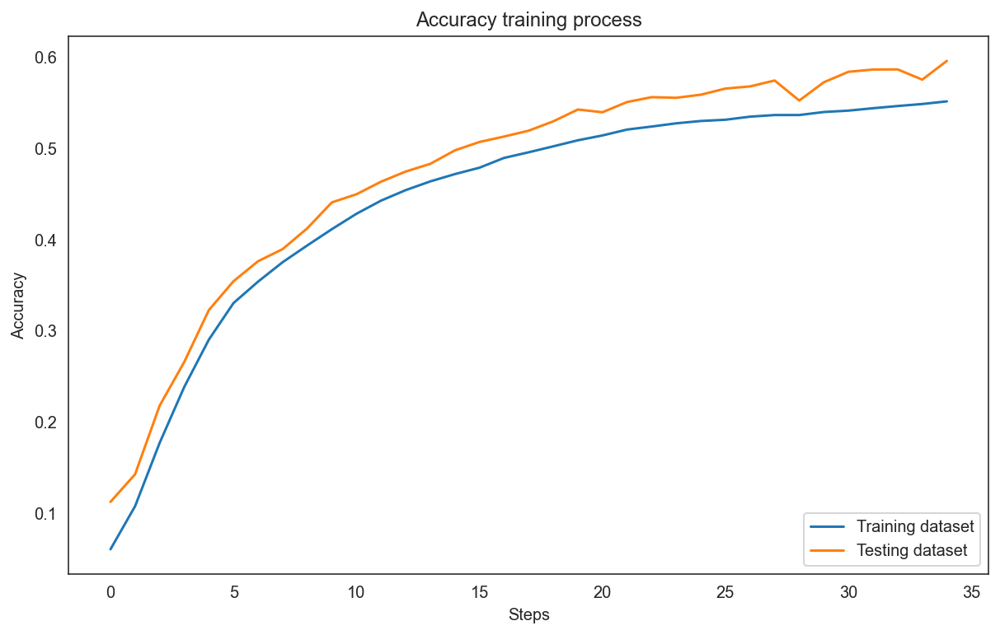

In [107]:
#Model Evaluate (Accuracy)
plt.figure(figsize = (10,6))
ax = plt.axes()
#ax.set_facecolor('#dfe3e6')
#plt.grid(color = 'w')
plt.plot(history_train['accuracy'])
plt.plot(history_train['val_accuracy'])
plt.title('Accuracy training process')
plt.ylabel('Accuracy')
plt.xlabel('Steps')
plt.legend(['Training dataset', 'Testing dataset'], loc = 'lower right')

In [108]:
pred_proba_autoend = model_train.predict(X_test_sc, batch_size=8000)

In [109]:
#Reconstruction error
re_error_test = ((X_test_sc - pred_proba_autoend) ** 2).mean(axis = 1)
#re_error = np.stack((y_val, re_error), axis = -1)
print(re_error_test)

[0.98044971 0.9079455  0.97353691 ... 0.83356705 0.84201473 1.09233373]


In [131]:
pred_proba_autoend_df = pd.DataFrame(re_error_test).reset_index().rename(columns={'index':'TransactionID',0:'MSE'})
pred_proba_autoend_df['TransactionID'] = test['TransactionID']
pred_proba_autoend_df

,TransactionID,MSE
0,3663549,0.980450
1,3663550,0.907946
2,3663551,0.973537
3,3663552,0.995318
4,3663553,1.001838
...,...,...
506686,4170235,0.897888
506687,4170236,1.010251
506688,4170237,0.833567
506689,4170238,0.842015


In [132]:
### Choose the threshold

threshold = pred_proba_autoend_df.MSE.quantile(0.95)
threshold

2.3866360636884307

In [136]:
pred_proba_autoend_df['isFraud'] = rankdata(re_error_test, method = 'dense')
pred_proba_autoend_df['isFraud'] = pred_proba_autoend_df['isFraud']/pred_proba_autoend_df['isFraud'].max()
pred_proba_autoend_df

,TransactionID,MSE,isFraud
0,3663549,0.980450,0.444073
1,3663550,0.907946,0.169107
2,3663551,0.973537,0.421505
3,3663552,0.995318,0.489239
4,3663553,1.001838,0.507328
...,...,...,...
506686,4170235,0.897888,0.142918
506687,4170236,1.010251,0.529799
506688,4170237,0.833567,0.006029
506689,4170238,0.842015,0.014106


<AxesSubplot:ylabel='Density'>

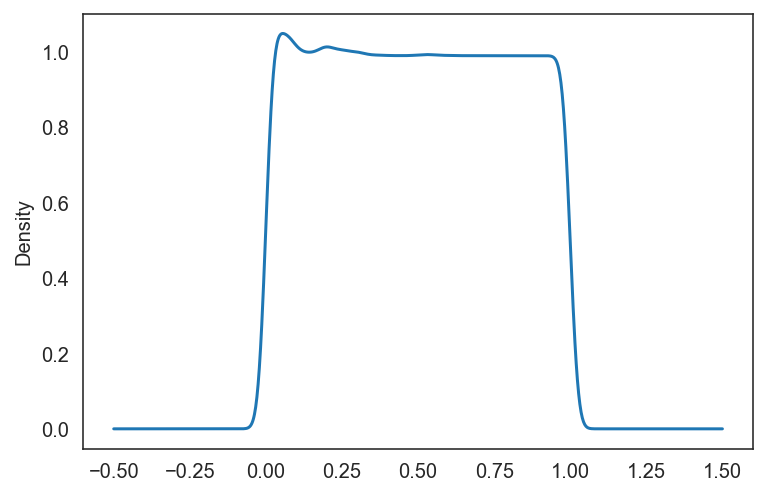

In [116]:
pred_proba_autoend_df.isFraud.plot(kind='kde')

In [113]:
pred_proba_autoend_df = pred_proba_autoend_df.drop(columns= ['MSE'])
pred_proba_autoend_df

,TransactionID,isFraud
0,3663549,0.444073
1,3663550,0.169107
2,3663551,0.421505
3,3663552,0.489239
4,3663553,0.507328
...,...,...
506686,4170235,0.142918
506687,4170236,0.529799
506688,4170237,0.006029
506689,4170238,0.014106


In [115]:
pred_proba_autoend_df.to_csv('fraud_autoend_11.csv',index=False)

# Conclusion
___________________________________________________________________________________________________________________________

1. Fraudulent transactions spend a little money but many times.
2. The transaction with product C, Discovery card, credit card, Microsoft email and use a mobile have more chance to be a fraudulent transactions.
3. The best model to predict probability of fraud or not fraud is Gradient Boosting.
4. Each company has the different criteria to detect fraud so, we can adjust the suitable threshold from the model’s prediction.
5. Transaction payment amount, Card1 , Card2, Card3, and Card5 are the important features for prediction fraudulent transaction.